<div class="alert alert-block alert-info">
<center> <h1> DATA MINING MDSAA-BA </h1> </center> <br>
<center> PROJECT 2021/2022 </center>

**Table of Contents** <br>
* [1. Import](#import)
    * [1.1. Import Libraries](#import_libraries)
    * [1.2. Import Dataset](#import_dataset)
* [2. Change Data Types](#change_datatypes)
* [3. Check for Incoherencies](#check_incoherencies)
* [4. Deal with Outliers](#outliers)
* [5. Treatment of Missing Values](#missing_values)
* [6. Feature Engineering](#feature_engineering)
* [7. Correlation Matrix](#correlation_matrix)
* [8. Scaling Methods](#scaling_methods)
* [9. PCA](#pca)
* [10. Create Segmentation](#segmentation)  
* [11. Quartile-based Clustering](#quartile_based_clustering)

* [12. Clustering Algorithms](#clustering)

    * [12.1. Clustering on Value Segmentation](#value_df )
        * [12.1.1 Hierarchical Clustering](#hierarc_value)
        * [12.1.2. K-Means/K-Medoids Algorithm](#kmeans_value)
        * [12.1.3. Hierarchical on SOM Units](#som_hierarc_value)
        * [12.1.4. K-Means/K-Medoids on SOM Units](#som_kmeans_value)
        * [12.1.5. DBSCAN](#dbscan_value)
        * [12.1.6. Mean Shift Clustering](#mean_shift_value)
        * [12.1.7. Gaussian Mixture Model](#gaussian_value)
        * [12.1.8. Choose Best Solution](#best_cluster_value)

    * [12.2. Clustering on Products Segmentation](#products_df)
        * [12.2.1 Hierarchical Clustering](#hierarchical)
        * [12.2.2. K-Means/K-Medoids Algorithm](#kmeans)
        * [12.2.3. Hierarchical on SOM Units](#h_som)
        * [12.2.4. K-Means/K-Medoids on SOM Units](#k_som)
        * [12.2.5. DBSCAN](#dbscan)
        * [12.1.6. Mean Shift Clustering](#mean_shift_p)
        * [12.1.7. Gaussian Mixture Model](#gaussian_p)
        * [12.1.8. Choose Best Solution](#best_cluster_p)

* [13. Merging the Perspectives](#merging)
* [14 Analysis of the Merged Clusters](#analysis)


<a class="anchor" id="import">

# 1.1. Import 

</a>

<a class="anchor" id="import_libraries">

## 1.1. Import Libraries

</a>

In [1]:
import pandas as pd
import math
import numpy as np

#! pip install plotly==5.4.0
import plotly.express as px

from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.impute import KNNImputer
from patsy import dmatrices
import statsmodels.api as sm

#! pip install scikit-learn-extra
from sklearn_extra.cluster import KMedoids

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.feature_selection import SelectKBest

from sklearn import metrics, tree
from sklearn.metrics import silhouette_samples, silhouette_score, confusion_matrix, classification_report

import sompy
from sompy.visualization.hitmap import HitMapView
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.sompy import SOMFactory
from sompy.visualization.plot_tools import plot_hex_map
from sompy.visualization.mapview import View2DPacked
from pylab import rcParams

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans

from sklearn.base import clone

from umap import UMAP
import plotly.express as px

from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz

bytecode dump:
>          0	NOP(arg=None, lineno=53)
           2	LOAD_FAST(arg=0, lineno=53)
           4	LOAD_CONST(arg=1, lineno=53)
           6	BINARY_SUBSCR(arg=None, lineno=53)
           8	LOAD_CONST(arg=2, lineno=53)
          10	BINARY_AND(arg=None, lineno=53)
          12	LOAD_CONST(arg=3, lineno=53)
          14	BINARY_LSHIFT(arg=None, lineno=53)
          16	LOAD_CONST(arg=4, lineno=53)
          18	BINARY_AND(arg=None, lineno=53)
          20	LOAD_FAST(arg=0, lineno=54)
          22	LOAD_CONST(arg=1, lineno=54)
          24	BINARY_SUBSCR(arg=None, lineno=54)
          26	LOAD_CONST(arg=5, lineno=54)
          28	BINARY_LSHIFT(arg=None, lineno=54)
          30	LOAD_CONST(arg=4, lineno=54)
          32	BINARY_AND(arg=None, lineno=54)
          34	LOAD_FAST(arg=0, lineno=54)
          36	LOAD_CONST(arg=1, lineno=54)
          38	BINARY_SUBSCR(arg=None, lineno=54)
          40	BINARY_XOR(arg=None, lineno=54)
          42	LOAD_CONST(arg=6, lineno=54)
          44	BINARY_RSHIFT

dispatch pc=88, inst=LOAD_CONST(arg=7, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$state86.41']
dispatch pc=90, inst=BINARY_SUBSCR(arg=None, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$state86.41', '$const88.42']
dispatch pc=92, inst=BINARY_XOR(arg=None, lineno=57)
stack ['$70binary_and.33', '$84binary_and.40', '$90binary_subscr.43']
dispatch pc=94, inst=LOAD_CONST(arg=11, lineno=57)
stack ['$70binary_and.33', '$92binary_xor.44']
dispatch pc=96, inst=BINARY_RSHIFT(arg=None, lineno=57)
stack ['$70binary_and.33', '$92binary_xor.44', '$const94.45']
dispatch pc=98, inst=BINARY_XOR(arg=None, lineno=56)
stack ['$70binary_and.33', '$96binary_rshift.46']
dispatch pc=100, inst=LOAD_FAST(arg=0, lineno=56)
stack ['$98binary_xor.47']
dispatch pc=102, inst=LOAD_CONST(arg=7, lineno=56)
stack ['$98binary_xor.47', '$state100.48']
dispatch pc=104, inst=STORE_SUBSCR(arg=None, lineno=56)
stack ['$98binary_xor.47', '$state100.48', '$const102.49']
dispatch pc=106, inst=LOAD_

label 0:
    state = arg(0, name=state)               ['state']
    $const4.1 = const(int, 0)                ['$const4.1']
    $6binary_subscr.2 = getitem(value=state, index=$const4.1, fn=<built-in function getitem>) ['$6binary_subscr.2', '$const4.1', 'state']
    $const8.3 = const(int, 4294967294)       ['$const8.3']
    $10binary_and.4 = $6binary_subscr.2 & $const8.3 ['$10binary_and.4', '$6binary_subscr.2', '$const8.3']
    $const12.5 = const(int, 12)              ['$const12.5']
    $14binary_lshift.6 = $10binary_and.4 << $const12.5 ['$10binary_and.4', '$14binary_lshift.6', '$const12.5']
    $const16.7 = const(int, 4294967295)      ['$const16.7']
    $18binary_and.8 = $14binary_lshift.6 & $const16.7 ['$14binary_lshift.6', '$18binary_and.8', '$const16.7']
    $const22.10 = const(int, 0)              ['$const22.10']
    $24binary_subscr.11 = getitem(value=state, index=$const22.10, fn=<built-in function getitem>) ['$24binary_subscr.11', '$const22.10', 'state']
    $const26.12 = const(in

on stmt: $const26.12 = const(int, 13)
on stmt: $28binary_lshift.13 = $24binary_subscr.11 << $const26.12
on stmt: $const30.14 = const(int, 4294967295)
on stmt: $32binary_and.15 = $28binary_lshift.13 & $const30.14
on stmt: $const36.17 = const(int, 0)
on stmt: $38binary_subscr.18 = static_getitem(value=state, index=0, index_var=$const36.17, fn=<built-in function getitem>)
on stmt: $40binary_xor.19 = $32binary_and.15 ^ $38binary_subscr.18
on stmt: $const42.20 = const(int, 19)
on stmt: $44binary_rshift.21 = $40binary_xor.19 >> $const42.20
on stmt: $46binary_xor.22 = $18binary_and.8 ^ $44binary_rshift.21
on stmt: $const50.24 = const(int, 0)
on stmt: state[0] = $46binary_xor.22
on stmt: $const56.26 = const(int, 1)
on stmt: $58binary_subscr.27 = static_getitem(value=state, index=1, index_var=$const56.26, fn=<built-in function getitem>)
on stmt: $const60.28 = const(int, 4294967288)
on stmt: $62binary_and.29 = $58binary_subscr.27 & $const60.28
on stmt: $const64.30 = const(int, 4)
on stmt: $66bin

SSA violators set()
bytecode dump:
>          0	NOP(arg=None, lineno=79)
           2	LOAD_GLOBAL(arg=0, lineno=79)
           4	LOAD_FAST(arg=0, lineno=79)
           6	CALL_FUNCTION(arg=1, lineno=79)
           8	STORE_FAST(arg=1, lineno=79)
          10	LOAD_GLOBAL(arg=1, lineno=80)
          12	LOAD_GLOBAL(arg=2, lineno=80)
          14	LOAD_FAST(arg=1, lineno=80)
          16	CALL_FUNCTION(arg=1, lineno=80)
          18	LOAD_CONST(arg=1, lineno=80)
          20	BINARY_TRUE_DIVIDE(arg=None, lineno=80)
          22	CALL_FUNCTION(arg=1, lineno=80)
          24	RETURN_VALUE(arg=None, lineno=80)
pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=79)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=79)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=79)
stack ['$2load_global.0']
dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=79)
stack ['$2load_global.0', '$state4.1']
dispatch pc=8, inst=STORE_FAST(arg=1, lineno=79)
stack

stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=64)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=64)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=64)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack=(), npush=0)]
pending: deque([State(pc_initial=24 nstack_initial=1)])
stack: ['$phi24.0']
dispatch pc=24, inst=FOR_ITER(arg=32, lineno=64)
stack ['$phi24.0']
end state. edges=[Edge(pc=58, stack=(), blockstack=(), npush=0), Edge(pc=26, stack=('$phi24.0', '$24for_iter.2'), blockstack=(), npush=0)]
pending: deque([State(pc_initial=58 nstack_initial=0), State(pc_initial=26 nstack_initial=2)])
stack: []
dispatch pc=58, inst=LOAD_FAST(arg=2, lineno=68)
stack []
dispatch pc=60, inst=RETURN_VALUE(arg=None, lineno=68)
stack ['$result58.0']
end state. edges=[]
pending: deque([State(pc_initial=26 nstack_initial=2)])
stack: ['$phi26.0', '$phi26.1']
dispatch pc=26, inst=STORE_FAST

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864A50D30>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:63)], kws=(), vararg=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block analysis pass on 24
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864A50D30>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.2 = pair_first(value=$24for_iter.1)
on stmt: $24for_iter.3 = pair_second(value=$24for_iter.1)
on stmt: $phi26.1 = 

on stmt: result.1 = $52inplace_add.13
on stmt: jump 24
==== SSA block rewrite pass on 58
Running <numba.core.ssa._FixSSAVars object at 0x000001F864A57490>
on stmt: $60return_value.1 = cast(value=result)
find_def var='result' stmt=$60return_value.1 = cast(value=result)
find_def_from_top label 58
idom 24 from label 58
find_def_from_bottom label 24
replaced with: $60return_value.1 = cast(value=result.2)
on stmt: return $60return_value.1
bytecode dump:
>          0	NOP(arg=None, lineno=62)
           2	LOAD_CONST(arg=1, lineno=62)
           4	STORE_FAST(arg=2, lineno=62)
           6	LOAD_FAST(arg=0, lineno=63)
           8	LOAD_ATTR(arg=0, lineno=63)
          10	LOAD_CONST(arg=2, lineno=63)
          12	BINARY_SUBSCR(arg=None, lineno=63)
          14	STORE_FAST(arg=3, lineno=63)
          16	LOAD_GLOBAL(arg=1, lineno=64)
          18	LOAD_FAST(arg=3, lineno=64)
          20	CALL_FUNCTION(arg=1, lineno=64)
          22	GET_ITER(arg=None, lineno=64)
>         24	FOR_ITER(arg=32, lineno=64

block_infos State(pc_initial=24 nstack_initial=1):
AdaptBlockInfo(insts=((24, {'iterator': '$phi24.0', 'pair': '$24for_iter.1', 'indval': '$24for_iter.2', 'pred': '$24for_iter.3'}),), outgoing_phis={'$phi26.1': '$24for_iter.2'}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 26: ('$phi24.0', '$24for_iter.2')})
block_infos State(pc_initial=26 nstack_initial=2):
AdaptBlockInfo(insts=((26, {'value': '$phi26.1'}), (28, {'res': '$x28.2'}), (30, {'res': '$i30.3'}), (32, {'index': '$i30.3', 'target': '$x28.2', 'res': '$32binary_subscr.4'}), (34, {'res': '$y34.5'}), (36, {'res': '$i36.6'}), (38, {'index': '$i36.6', 'target': '$y34.5', 'res': '$38binary_subscr.7'}), (40, {'lhs': '$32binary_subscr.4', 'rhs': '$38binary_subscr.7', 'res': '$40binary_subtract.8'}), (42, {'value': '$40binary_subtract.8'}), (44, {'res': '$result44.9'}), (46, {'res': '$diff46.10'}), (48, {'res': '$diff48.11'}), (50, {'lhs': '$diff46.10', 'rhs': '$diff48.11', 'res': '$50binary_multiply.12'}), (52, {

on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864864490>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.2 = pair_first(value=$24for_iter.1)
on stmt: $24for_iter.3 = pair_second(value=$24for_iter.1)
on stmt: $phi26.1 = $24for_iter.2
on stmt: branch $24for_iter.3, 26, 58
==== SSA block rewrite pass on 26
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864864490>
on stmt: i = $phi26.1
on stmt: $32binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $38binary_subscr.7 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: diff = $32binary_subscr.4 - $38binary_subscr.7
on stmt: $50binary_multiply.12 = diff * diff
on stmt: $52inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply

pending: deque([State(pc_initial=82 nstack_initial=0), State(pc_initial=30 nstack_initial=2)])
stack: []
dispatch pc=82, inst=LOAD_FAST(arg=2, lineno=250)
stack []
dispatch pc=84, inst=LOAD_CONST(arg=1, lineno=250)
stack ['$num_non_zero82.0']
dispatch pc=86, inst=COMPARE_OP(arg=2, lineno=250)
stack ['$num_non_zero82.0', '$const84.1']
dispatch pc=88, inst=POP_JUMP_IF_FALSE(arg=94, lineno=250)
stack ['$86compare_op.2']
end state. edges=[Edge(pc=90, stack=(), blockstack=(), npush=0), Edge(pc=94, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=30 nstack_initial=2), State(pc_initial=90 nstack_initial=0), State(pc_initial=94 nstack_initial=0)])
stack: ['$phi30.0', '$phi30.1']
dispatch pc=30, inst=STORE_FAST(arg=5, lineno=244)
stack ['$phi30.0', '$phi30.1']
dispatch pc=32, inst=LOAD_FAST(arg=0, lineno=245)
stack ['$phi30.0']
dispatch pc=34, inst=LOAD_FAST(arg=5, lineno=245)
stack ['$phi30.0', '$x32.2']
dispatch pc=36, inst=BINARY_SUBSCR(arg=None, lineno=245)
stack ['$phi30

changing phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi30.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi64.0', State(pc_initial=64 nstack_initial=3)),
                          ('$phi74.0', State(pc_initial=74 nstack_initial=2))},
             '$phi62.1': {('$num_non

block_infos State(pc_initial=30 nstack_initial=2):
AdaptBlockInfo(insts=((30, {'value': '$phi30.1'}), (32, {'res': '$x32.2'}), (34, {'res': '$i34.3'}), (36, {'index': '$i34.3', 'target': '$x32.2', 'res': '$36binary_subscr.4'}), (38, {'res': '$const38.5'}), (40, {'lhs': '$36binary_subscr.4', 'rhs': '$const38.5', 'res': '$40compare_op.6'}), (42, {'value': '$40compare_op.6'}), (44, {'res': '$y44.7'}), (46, {'res': '$i46.8'}), (48, {'index': '$i46.8', 'target': '$y44.7', 'res': '$48binary_subscr.9'}), (50, {'res': '$const50.10'}), (52, {'lhs': '$48binary_subscr.9', 'rhs': '$const50.10', 'res': '$52compare_op.11'}), (54, {'value': '$52compare_op.11'}), (56, {'res': '$num_non_zero56.12'}), (58, {'res': '$x_true58.13'}), (60, {'pred': '$x_true58.13'})), outgoing_phis={'$phi64.1': '$num_non_zero56.12', '$phi64.2': '$x_true58.13'}, blockstack=(), active_try_block=None, outgoing_edgepushed={62: ('$phi30.0', '$num_non_zero56.12'), 64: ('$phi30.0', '$num_non_zero56.12', '$x_true58.13')})
block_inf

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864B27EE0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block analysis pass on 28
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864B27EE0>
on stmt: $28for_iter.1 = iternext(value=$phi28.0)
on stmt: $28for_iter.2 = pair_first(value=$28for_iter.1)
on stmt: $28for_iter.3 = pair_

Fix SSA violator on var num_non_zero
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864A57670>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
first assign: num_non_zero
replaced with: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite pass on 28
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864A57670>
on stmt: $28for_iter.1 = iterne

on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B199D0>
on stmt: $const84.1 = const(float, 0.0)
on stmt: $86compare_op.2 = num_non_zero == $const84.1
find_def var='num_non_zero' stmt=$86compare_op.2 = num_non_zero == $const84.1
find_def_from_top label 82
idom 28 from label 82
find_def_from_bottom label 28
replaced with: $86compare_op.2 = num_non_zero.2 == $const84.1
on stmt: bool88 = global(bool: <class 'bool'>)
on stmt: $88pred = call bool88($86compare_op.2, func=bool88, args=(Var($86compare_op.2, distances.py:250),), kws=(), vararg=None)
on stmt: branch $88pred, 90, 94
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B199D0>
on stmt: $const90.0 = const(float, 0.0)
on stmt: $92return_value.1 = cast(value=$const90.0)
on stmt: return $92return_value.1
==== SSA block rewrite pass on 94
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B199D0>
on stmt: $94load_global.0 = global(

on stmt: $48binary_subscr.9 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $const50.10 = const(int, 0)
on stmt: y_true = $48binary_subscr.9 != $const50.10
on stmt: bool60 = global(bool: <class 'bool'>)
on stmt: $60pred = call bool60(x_true, func=bool60, args=(Var(x_true, distances.py:245),), kws=(), vararg=None)
on stmt: $phi64.1 = num_non_zero.2
on stmt: $phi64.2 = x_true
on stmt: branch $60pred, 64, 62
==== SSA block rewrite pass on 62
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B198E0>
on stmt: $phi64.2.1 = y_true
on stmt: jump 64
==== SSA block rewrite pass on 64
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B198E0>
on stmt: num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2, static_lhs=Undefined, static_rhs=Undefined)
find_def var='$phi64.2' stmt=num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=

on stmt: return $108return_value.7
Replaced assignments: defaultdict(<class 'list'>,
            {64: [<numba.core.ir.Assign object at 0x000001F8648FF910>],
             74: [<numba.core.ir.Assign object at 0x000001F8649766D0>]})
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FixSSAVars object at 0x000001F864904A60>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite 

on stmt: $phi76.2 = x_true
on stmt: $phi76.1 = num_equal
on stmt: branch $72pred, 74, 76
==== SSA block rewrite pass on 74
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8648FF100>
on stmt: $phi76.2.1 = y_true
on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8648FF100>
on stmt: $phi76.2.2 = phi(incoming_values=[Var($phi76.2, distances.py:248), Var($phi76.2.1, distances.py:248)], incoming_blocks=[64, 74])
on stmt: num_equal = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, static_rhs=Undefined)
replaced with: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8648FF100>
on stmt: $const84.1 = const(float, 

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=241)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=241)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=241)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=242)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=242)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_FAST(arg=0, lineno=243)
stack []
dispatch pc=12, inst=LOAD_ATTR(arg=0, lineno=243)
stack ['$x10.2']
dispatch pc=14, inst=LOAD_CONST(arg=2, lineno=243)
stack ['$12load_attr.3']
dispatch pc=16, inst=BINARY_SUBSCR(arg=None, lineno=243)
stack ['$12load_attr.3', '$const14.4']
dispatch pc=18, inst=STORE_FAST(arg=4, lineno=243)
stack ['$16binary_subscr.5']
dispatch pc=20, inst=LOAD_GLOBAL(arg=1, lineno=244)
stack []
dispatch pc=22, inst=LOAD_FAST(arg=4, lineno=244)
stack ['$20load_global.6']
dispatch pc=24, inst=CALL_FUNCTION(arg=1, lineno=244)
stack ['$20load_global.6', '$dim22.7']
dispatch pc=2

phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi76.0', State(pc_initial=76 nstack_initial=3))},
             '$phi30.0': {('$phi28.0', State(pc_initial=28 nstack_initial=1))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$phi30.0', State(pc_initial=30 nstack_initial=2))},
             '$phi62.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.0': {('$phi30.0', State(pc_initial=30 nstack_initial=2)),
                          ('$phi62.0', State(pc_initial=62 nstack_initial=2))},
             '$phi64.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2)),
                          ('$phi62.1', State(pc_initial=62 nstack_initial=2))},
             '$phi64.2': {('$x

new_out: defaultdict(<class 'dict'>,
            {State(pc_initial=0 nstack_initial=0): {'$phi28.0': '$26get_iter.9'},
             State(pc_initial=28 nstack_initial=1): {'$phi30.1': '$28for_iter.2'},
             State(pc_initial=30 nstack_initial=2): {'$phi64.1': '$num_non_zero56.12',
                                                     '$phi64.2': '$x_true58.13'},
             State(pc_initial=62 nstack_initial=2): {'$phi64.2': '$y_true62.2'},
             State(pc_initial=64 nstack_initial=3): {'$phi76.1': '$num_equal68.4',
                                                     '$phi76.2': '$x_true70.5'},
             State(pc_initial=74 nstack_initial=2): {'$phi76.2': '$y_true74.2'}})
----------------------DONE Prune PHIs-----------------------
block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$const2.0'}), (4, {'value': '$const2.0'}), (6, {'res': '$const6.1'}), (8, {'value': '$const6.1'}), (10, {'res': '$x10.2'}), (12, {'item': '$x10.2',

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F8649760D0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block analysis pass on 28
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F8649760D0>
on stmt: $28for_iter.1 = iternext(value=$phi28.0)
on stmt: $28for_iter.2 = pair_first(value=$28for_iter.1)
on stmt: $28for_iter.3 = pair_

Fix SSA violator on var num_non_zero
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86488CAC0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
first assign: num_non_zero
replaced with: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite pass on 28
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86488CAC0>
on stmt: $28for_iter.1 = iterne

on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480CF40>
on stmt: $const84.1 = const(float, 0.0)
on stmt: $86compare_op.2 = num_non_zero == $const84.1
find_def var='num_non_zero' stmt=$86compare_op.2 = num_non_zero == $const84.1
find_def_from_top label 82
idom 28 from label 82
find_def_from_bottom label 28
replaced with: $86compare_op.2 = num_non_zero.2 == $const84.1
on stmt: bool88 = global(bool: <class 'bool'>)
on stmt: $88pred = call bool88($86compare_op.2, func=bool88, args=(Var($86compare_op.2, distances.py:250),), kws=(), vararg=None)
on stmt: branch $88pred, 90, 94
==== SSA block rewrite pass on 90
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480CF40>
on stmt: $const90.0 = const(float, 0.0)
on stmt: $92return_value.1 = cast(value=$const90.0)
on stmt: return $92return_value.1
==== SSA block rewrite pass on 94
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480CF40>
on stmt: $94load_global.0 = global(

on stmt: $48binary_subscr.9 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $const50.10 = const(int, 0)
on stmt: y_true = $48binary_subscr.9 != $const50.10
on stmt: bool60 = global(bool: <class 'bool'>)
on stmt: $60pred = call bool60(x_true, func=bool60, args=(Var(x_true, distances.py:245),), kws=(), vararg=None)
on stmt: $phi64.1 = num_non_zero.2
on stmt: $phi64.2 = x_true
on stmt: branch $60pred, 64, 62
==== SSA block rewrite pass on 62
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480C8B0>
on stmt: $phi64.2.1 = y_true
on stmt: jump 64
==== SSA block rewrite pass on 64
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480C8B0>
on stmt: num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=$phi64.2, static_lhs=Undefined, static_rhs=Undefined)
find_def var='$phi64.2' stmt=num_non_zero.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi64.1, rhs=

on stmt: return $108return_value.7
Replaced assignments: defaultdict(<class 'list'>,
            {64: [<numba.core.ir.Assign object at 0x000001F86488C580>],
             74: [<numba.core.ir.Assign object at 0x000001F86480C8B0>]})
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FixSSAVars object at 0x000001F86480CF40>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: num_non_zero = const(float, 0.0)
on stmt: num_equal = const(float, 0.0)
on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
on stmt: $const14.4 = const(int, 0)
on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4, fn=<built-in function getitem>)
on stmt: $20load_global.6 = global(range: <class 'range'>)
on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:243)], kws=(), vararg=None)
on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
on stmt: $phi28.0 = $26get_iter.9
on stmt: jump 28
==== SSA block rewrite 

on stmt: $phi76.2 = x_true
on stmt: $phi76.1 = num_equal
on stmt: branch $72pred, 74, 76
==== SSA block rewrite pass on 74
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86488C5B0>
on stmt: $phi76.2.1 = y_true
on stmt: jump 76
==== SSA block rewrite pass on 76
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86488C5B0>
on stmt: $phi76.2.2 = phi(incoming_values=[Var($phi76.2, distances.py:248), Var($phi76.2.1, distances.py:248)], incoming_blocks=[64, 74])
on stmt: num_equal = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, static_rhs=Undefined)
replaced with: num_equal.1 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$phi76.1, rhs=$phi76.2.2, static_lhs=Undefined, static_rhs=Undefined)
on stmt: jump 28
==== SSA block rewrite pass on 82
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86488C5B0>
on stmt: $const84.1 = const(float, 

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=427)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=427)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=427)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=428)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=428)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=429)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=429)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=430)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=430)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=430)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=430)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=430)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=431)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=431)
s

stack: []
dispatch pc=134, inst=LOAD_GLOBAL(arg=2, lineno=439)
stack []
dispatch pc=136, inst=RETURN_VALUE(arg=None, lineno=439)
stack ['$134load_global.0']
end state. edges=[]
pending: deque([State(pc_initial=134 nstack_initial=0), State(pc_initial=138 nstack_initial=0)])
pending: deque([State(pc_initial=138 nstack_initial=0)])
stack: []
dispatch pc=138, inst=LOAD_FAST(arg=2, lineno=440)
stack []
dispatch pc=140, inst=LOAD_CONST(arg=1, lineno=440)
stack ['$result138.0']
dispatch pc=142, inst=COMPARE_OP(arg=1, lineno=440)
stack ['$result138.0', '$const140.1']
dispatch pc=144, inst=POP_JUMP_IF_FALSE(arg=150, lineno=440)
stack ['$142compare_op.2']
end state. edges=[Edge(pc=146, stack=(), blockstack=(), npush=0), Edge(pc=150, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=146 nstack_initial=0), State(pc_initial=150 nstack_initial=0)])
stack: []
dispatch pc=146, inst=LOAD_GLOBAL(arg=2, lineno=441)
stack []
dispatch pc=148, inst=RETURN_VALUE(arg=None, lineno=441)
stack 

block_infos State(pc_initial=98 nstack_initial=0):
AdaptBlockInfo(insts=((98, {'res': '$norm_x98.0'}), (100, {'res': '$const100.1'}), (102, {'lhs': '$norm_x98.0', 'rhs': '$const100.1', 'res': '$102compare_op.2'}), (104, {'pred': '$102compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={106: (), 118: ()})
block_infos State(pc_initial=106 nstack_initial=0):
AdaptBlockInfo(insts=((106, {'res': '$norm_y106.0'}), (108, {'res': '$const108.1'}), (110, {'lhs': '$norm_y106.0', 'rhs': '$const108.1', 'res': '$110compare_op.2'}), (112, {'pred': '$110compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={114: (), 118: ()})
block_infos State(pc_initial=114 nstack_initial=0):
AdaptBlockInfo(insts=((114, {'res': '$const114.0'}), (116, {'retval': '$const114.0', 'castval': '$116return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=118 nstack_initial

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864BE37F0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864BE37F0>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
o

SSA violators {'result', 'norm_y', 'norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864BDBDC0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler objec

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000001F864B2FD00>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.3 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_de

on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864B2FAC0>
on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:427), Var(result.1, distances.py:432)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864B2FAC0>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<buil

on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x = $72inplace_add.19
on stmt: $82binary_subscr.23 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $88binary_subscr.26 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $90binary_multiply.27 = $82binary_subscr.23 * $88binary_subscr.26
on stmt: $92inplace_add.28 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_y, rhs=$90binary_multiply.27, static_lhs=Undefined, static_rhs=Undefined)
find_def var='norm_y' stmt=$92inpl

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864BDBDC0>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iad

find_def var='norm_x' stmt=$72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def norm_x = const(float, 0.0)
find_def_from_bottom label 34
incoming_def norm_x.1 = $72inplace_add.19
replaced with: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x.2, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x.1 = $72inplace_add.19
on stmt: $82binary_subscr.23 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $88binary_subscr.26 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $90binary_multiply.27 = $82binary_subsc

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=427)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=427)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=427)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=428)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=428)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=429)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=429)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=430)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=430)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=430)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=430)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=430)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=431)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=431)
s

stack: []
dispatch pc=134, inst=LOAD_GLOBAL(arg=2, lineno=439)
stack []
dispatch pc=136, inst=RETURN_VALUE(arg=None, lineno=439)
stack ['$134load_global.0']
end state. edges=[]
pending: deque([State(pc_initial=134 nstack_initial=0), State(pc_initial=138 nstack_initial=0)])
pending: deque([State(pc_initial=138 nstack_initial=0)])
stack: []
dispatch pc=138, inst=LOAD_FAST(arg=2, lineno=440)
stack []
dispatch pc=140, inst=LOAD_CONST(arg=1, lineno=440)
stack ['$result138.0']
dispatch pc=142, inst=COMPARE_OP(arg=1, lineno=440)
stack ['$result138.0', '$const140.1']
dispatch pc=144, inst=POP_JUMP_IF_FALSE(arg=150, lineno=440)
stack ['$142compare_op.2']
end state. edges=[Edge(pc=146, stack=(), blockstack=(), npush=0), Edge(pc=150, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=146 nstack_initial=0), State(pc_initial=150 nstack_initial=0)])
stack: []
dispatch pc=146, inst=LOAD_GLOBAL(arg=2, lineno=441)
stack []
dispatch pc=148, inst=RETURN_VALUE(arg=None, lineno=441)
stack 

block_infos State(pc_initial=98 nstack_initial=0):
AdaptBlockInfo(insts=((98, {'res': '$norm_x98.0'}), (100, {'res': '$const100.1'}), (102, {'lhs': '$norm_x98.0', 'rhs': '$const100.1', 'res': '$102compare_op.2'}), (104, {'pred': '$102compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={106: (), 118: ()})
block_infos State(pc_initial=106 nstack_initial=0):
AdaptBlockInfo(insts=((106, {'res': '$norm_y106.0'}), (108, {'res': '$const108.1'}), (110, {'lhs': '$norm_y106.0', 'rhs': '$const108.1', 'res': '$110compare_op.2'}), (112, {'pred': '$110compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={114: (), 118: ()})
block_infos State(pc_initial=114 nstack_initial=0):
AdaptBlockInfo(insts=((114, {'res': '$const114.0'}), (116, {'retval': '$const114.0', 'castval': '$116return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=118 nstack_initial

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864CDD910>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864CDD910>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
o

SSA violators {'result', 'norm_y', 'norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864C00640>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: norm_x = const(float, 0.0)
on stmt: norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler objec

on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000001F864C00F40>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.3 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_de

on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:430)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864C003A0>
on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:427), Var(result.1, distances.py:432)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864C003A0>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<buil

on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x = $72inplace_add.19
on stmt: $82binary_subscr.23 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $88binary_subscr.26 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $90binary_multiply.27 = $82binary_subscr.23 * $88binary_subscr.26
on stmt: $92inplace_add.28 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_y, rhs=$90binary_multiply.27, static_lhs=Undefined, static_rhs=Undefined)
find_def var='norm_y' stmt=$92inpl

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 98
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864CDD280>
on stmt: i = $phi34.1
on stmt: $42binary_subscr.5 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $48binary_subscr.8 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $50binary_multiply.9 = $42binary_subscr.5 * $48binary_subscr.8
on stmt: $52inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$50binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $52inplace_add.10
on stmt: $62binary_subscr.14 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70binary_multiply.18 = $62binary_subscr.14 * $68binary_subscr.17
on stmt: $72inplace_add.19 = inplace_binop(fn=<built-in function iad

find_def var='norm_x' stmt=$72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def norm_x = const(float, 0.0)
find_def_from_bottom label 34
incoming_def norm_x.1 = $72inplace_add.19
replaced with: $72inplace_add.19 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=norm_x.2, rhs=$70binary_multiply.18, static_lhs=Undefined, static_rhs=Undefined)
on stmt: norm_x.1 = $72inplace_add.19
on stmt: $82binary_subscr.23 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $88binary_subscr.26 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $90binary_multiply.27 = $82binary_subsc

stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=459)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=459)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=459)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=460)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=460)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=460)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=460)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack=(), npush=0)]
pending: deque([State(pc_initial=24 nstack_initial=1)])
stack: ['$phi24.0']
dispatch pc=24, inst=FOR_ITER(arg=24, lineno=460)
stack ['$phi24.0']
end state. edges=[Edge(pc=50, stack=(), blockstack=(), npush=0), Edge(pc=26, stack=('$phi24.0', '$24for_iter.2'), blockstack=(), npush=0)]
pending: deque([State(pc_initial=50 nstack_initial=0), St

block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$const58.0'}), (60, {'retval': '$const58.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$const62.0'}), (64, {'res': '$result64.1'}), (66, {'lhs': '$const62.0', 'rhs': '$result64.1', 'res': '$66binary_subtract.2'}), (68, {'retval': '$66binary_subtract.2', 'castval': '$68return_value.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    x = arg(0, name=x)                       ['x']
    y = arg(1, name=y)                       ['y']
    result = const(float, 0.0)               ['result']
    $8load_attr.2 = getattr(value=x, attr=shape) ['$8load_attr.2', 'x']
    $const10.3 = const(int, 0)               ['$const10.3']
    dim = getitem(value=$8load_attr.2, index=$const10.3, fn=<built-in function getite

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864CDD7C0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:459)], kws=(), vararg=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864CDD7C0>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=486)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=486)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=486)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_FAST(arg=0, lineno=487)
stack []
dispatch pc=8, inst=LOAD_ATTR(arg=0, lineno=487)
stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=487)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=487)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=487)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=488)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=488)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=488)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=488)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack

block_infos State(pc_initial=50 nstack_initial=0):
AdaptBlockInfo(insts=((50, {'res': '$result50.0'}), (52, {'res': '$const52.1'}), (54, {'lhs': '$result50.0', 'rhs': '$const52.1', 'res': '$54compare_op.2'}), (56, {'pred': '$54compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 62: ()})
block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$58load_global.0'}), (60, {'retval': '$58load_global.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$62load_global.0'}), (64, {'item': '$62load_global.0', 'res': '$64load_method.1'}), (66, {'res': '$result66.2'}), (68, {'func': '$64load_method.1', 'args': ['$result66.2'], 'res': '$68call_method.3'}), (70, {'value': '$68call_method.3', 'res': '$70unary_negative.4'}), (72, {'retval': '$70unary_negative.4', 'castva

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E58400>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:487)], kws=(), vararg=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E58400>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=486)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=486)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=486)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_FAST(arg=0, lineno=487)
stack []
dispatch pc=8, inst=LOAD_ATTR(arg=0, lineno=487)
stack ['$x6.1']
dispatch pc=10, inst=LOAD_CONST(arg=2, lineno=487)
stack ['$8load_attr.2']
dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=487)
stack ['$8load_attr.2', '$const10.3']
dispatch pc=14, inst=STORE_FAST(arg=3, lineno=487)
stack ['$12binary_subscr.4']
dispatch pc=16, inst=LOAD_GLOBAL(arg=1, lineno=488)
stack []
dispatch pc=18, inst=LOAD_FAST(arg=3, lineno=488)
stack ['$16load_global.5']
dispatch pc=20, inst=CALL_FUNCTION(arg=1, lineno=488)
stack ['$16load_global.5', '$dim18.6']
dispatch pc=22, inst=GET_ITER(arg=None, lineno=488)
stack ['$20call_function.7']
end state. edges=[Edge(pc=24, stack=('$22get_iter.8',), blockstack

block_infos State(pc_initial=50 nstack_initial=0):
AdaptBlockInfo(insts=((50, {'res': '$result50.0'}), (52, {'res': '$const52.1'}), (54, {'lhs': '$result50.0', 'rhs': '$const52.1', 'res': '$54compare_op.2'}), (56, {'pred': '$54compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={58: (), 62: ()})
block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$58load_global.0'}), (60, {'retval': '$58load_global.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=62 nstack_initial=0):
AdaptBlockInfo(insts=((62, {'res': '$62load_global.0'}), (64, {'item': '$62load_global.0', 'res': '$64load_method.1'}), (66, {'res': '$result66.2'}), (68, {'func': '$64load_method.1', 'args': ['$result66.2'], 'res': '$68call_method.3'}), (70, {'value': '$68call_method.3', 'res': '$70unary_negative.4'}), (72, {'retval': '$70unary_negative.4', 'castva

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864D4E8B0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
on stmt: $const10.3 = const(int, 0)
on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3, fn=<built-in function getitem>)
on stmt: $16load_global.5 = global(range: <class 'range'>)
on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:487)], kws=(), vararg=None)
on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
on stmt: $phi24.0 = $22get_iter.8
on stmt: jump 24
==== SSA block rewrite pass on 24
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864D4E8B0>
on stmt: $24for_iter.1 = iternext(value=$phi24.0)
on stmt: $24for_iter.

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=603)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=603)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=603)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=604)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=604)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=605)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=605)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=606)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=606)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=606)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=606)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=606)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=608)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=608)
s

dispatch pc=132, inst=LOAD_CONST(arg=4, lineno=618)
stack ['$130load_method.1']
dispatch pc=134, inst=LOAD_FAST(arg=2, lineno=618)
stack ['$130load_method.1', '$const132.2']
dispatch pc=136, inst=LOAD_GLOBAL(arg=2, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3']
dispatch pc=138, inst=LOAD_METHOD(arg=3, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$136load_global.4']
dispatch pc=140, inst=LOAD_FAST(arg=3, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5']
dispatch pc=142, inst=LOAD_FAST(arg=4, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5', '$l1_norm_x140.6']
dispatch pc=144, inst=BINARY_MULTIPLY(arg=None, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_method.5', '$l1_norm_x140.6', '$l1_norm_y142.7']
dispatch pc=146, inst=CALL_METHOD(arg=1, lineno=618)
stack ['$130load_method.1', '$const132.2', '$result134.3', '$138load_

block_infos State(pc_initial=116 nstack_initial=0):
AdaptBlockInfo(insts=((116, {'res': '$l1_norm_y116.0'}), (118, {'res': '$const118.1'}), (120, {'lhs': '$l1_norm_y116.0', 'rhs': '$const118.1', 'res': '$120compare_op.2'}), (122, {'pred': '$120compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={124: (), 128: ()})
block_infos State(pc_initial=124 nstack_initial=0):
AdaptBlockInfo(insts=((124, {'res': '$const124.0'}), (126, {'retval': '$const124.0', 'castval': '$126return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=128 nstack_initial=0):
AdaptBlockInfo(insts=((128, {'res': '$128load_global.0'}), (130, {'item': '$128load_global.0', 'res': '$130load_method.1'}), (132, {'res': '$const132.2'}), (134, {'res': '$result134.3'}), (136, {'res': '$136load_global.4'}), (138, {'item': '$136load_global.4', 'res': '$138load_method.5'}), (140, {'res': '$l1_norm_x140.6'}), (142, {'res

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864DDB730>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:606)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864DDB730>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_ite

SSA violators {'result', 'l1_norm_y', 'l1_norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864DDB730>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:606)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarH

on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_def_from_bottom label 34
incoming_def result.1 = $58inplace_add.13
replaced with: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.2, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=

on stmt: l1_norm_y = $82inplace_add.23
replaced with: l1_norm_y.1 = $82inplace_add.23
on stmt: jump 32
==== SSA block rewrite pass on 88
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E5ADC0>
on stmt: $const90.1 = const(int, 0)
on stmt: $92compare_op.2 = l1_norm_x == $const90.1
on stmt: bool94 = global(bool: <class 'bool'>)
on stmt: $94pred = call bool94($92compare_op.2, func=bool94, args=(Var($92compare_op.2, distances.py:613),), kws=(), vararg=None)
on stmt: branch $94pred, 96, 108
==== SSA block rewrite pass on 96
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E5ADC0>
on stmt: $const98.1 = const(int, 0)
on stmt: $100compare_op.2 = l1_norm_y == $const98.1
on stmt: bool102 = global(bool: <class 'bool'>)
on stmt: $102pred = call bool102($100compare_op.2, func=bool102, args=(Var($100compare_op.2, distances.py:613),), kws=(), vararg=None)
on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FreshVarHandler object a

on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FixSSAVars object at 0x000001F864E483D0>
on stmt: $const104.0 = const(float, 0.0)
on stmt: $106return_value.1 = cast(value=$const104.0)
on stmt: return $106return_value.1
==== SSA block rewrite pass on 108
Running <numba.core.ssa._FixSSAVars object at 0x000001F864E483D0>
on stmt: $const110.1 = const(int, 0)
on stmt: $112compare_op.2 = l1_norm_x == $const110.1
on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2, distances.py:615),), kws=(), vararg=None)
on stmt: branch $114pred, 124, 116
==== SSA block rewrite pass on 116
Running <numba.core.ssa._FixSSAVars object at 0x000001F864E483D0>
on stmt: $const118.1 = const(int, 0)
on stmt: $120compare_op.2 = l1_norm_y == $const118.1
find_def var='l1_norm_y' stmt=$120compare_op.2 = l1_norm_y == $const118.1
find_def_from_top label 116
idom 108 from label 116
find_def

on stmt: bool122 = global(bool: <class 'bool'>)
on stmt: $122pred = call bool122($120compare_op.2, func=bool122, args=(Var($120compare_op.2, distances.py:615),), kws=(), vararg=None)
on stmt: branch $122pred, 124, 128
==== SSA block rewrite pass on 124
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864DC6340>
on stmt: $const124.0 = const(float, 1.0)
on stmt: $126return_value.1 = cast(value=$const124.0)
on stmt: return $126return_value.1
==== SSA block rewrite pass on 128
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864DC6340>
on stmt: $128load_global.0 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $130load_method.1 = getattr(value=$128load_global.0, attr=sqrt)
on stmt: $const132.2 = const(int, 1)
on stmt: $136load_global.4 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $138load_method.5 = getattr(value=$136load_global.4, at

==== SSA block rewrite pass on 128
Running <numba.core.ssa._FixSSAVars object at 0x000001F864DDBAC0>
on stmt: $128load_global.0 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $130load_method.1 = getattr(value=$128load_global.0, attr=sqrt)
on stmt: $const132.2 = const(int, 1)
on stmt: $136load_global.4 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $138load_method.5 = getattr(value=$136load_global.4, attr=sqrt)
on stmt: $144binary_multiply.8 = l1_norm_x * l1_norm_y.2
find_def var='l1_norm_x' stmt=$144binary_multiply.8 = l1_norm_x * l1_norm_y.2
find_def_from_top label 128
idom 116 from label 128
find_def_from_bottom label 116
find_def_from_top label 116
idom 108 from label 116
find_def_from_bottom label 108
find_def_from_top label 108
idom 88 from label 108
find_def_from_bottom label 88
find_def_from_top label 88
idom 32 from label 88
find_def_from_botto

dispatch pc=48, inst=LOAD_FAST(arg=1, lineno=609)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7']
dispatch pc=50, inst=LOAD_FAST(arg=6, lineno=609)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$y48.8']
dispatch pc=52, inst=BINARY_SUBSCR(arg=None, lineno=609)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$y48.8', '$i50.9']
dispatch pc=54, inst=BINARY_MULTIPLY(arg=None, lineno=609)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$52binary_subscr.10']
dispatch pc=56, inst=CALL_METHOD(arg=1, lineno=609)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$54binary_multiply.11']
dispatch pc=58, inst=INPLACE_ADD(arg=None, lineno=609)
stack ['$phi34.0', '$result36.2', '$56call_method.12']
dispatch pc=60, inst=STORE_FAST(arg=2, lineno=609)
stack ['$phi34.0', '$58inplace_add.13']
dispatch pc=62, inst=LOAD_FAST(arg=3, lineno=610)
stack ['$phi34.0']
dispatch pc=64, inst=LOAD_

changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
keep phismap: {'$phi32.0': {('$30get_iter.10', State(pc_initial=0 nstack_initial=0))},
 '$phi34.1': {('$32for_iter.2', State(pc_initial=32 nstack_initial=1))}}
new_out: defaultdict(<class 'dict'>,
            {State(pc_initial=0 nstack_

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864F08940>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:606)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864F08940>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_ite

SSA violators {'result', 'l1_norm_y', 'l1_norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E5A730>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:606)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarH

on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def var='result' stmt=$58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node result.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def result = const(float, 0.0)
find_def_from_bottom label 34
incoming_def result.1 = $58inplace_add.13
replaced with: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.2, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=

on stmt: l1_norm_y = $82inplace_add.23
replaced with: l1_norm_y.1 = $82inplace_add.23
on stmt: jump 32
==== SSA block rewrite pass on 88
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E48280>
on stmt: $const90.1 = const(int, 0)
on stmt: $92compare_op.2 = l1_norm_x == $const90.1
on stmt: bool94 = global(bool: <class 'bool'>)
on stmt: $94pred = call bool94($92compare_op.2, func=bool94, args=(Var($92compare_op.2, distances.py:613),), kws=(), vararg=None)
on stmt: branch $94pred, 96, 108
==== SSA block rewrite pass on 96
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E48280>
on stmt: $const98.1 = const(int, 0)
on stmt: $100compare_op.2 = l1_norm_y == $const98.1
on stmt: bool102 = global(bool: <class 'bool'>)
on stmt: $102pred = call bool102($100compare_op.2, func=bool102, args=(Var($100compare_op.2, distances.py:613),), kws=(), vararg=None)
on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FreshVarHandler object a

on stmt: branch $102pred, 104, 108
==== SSA block rewrite pass on 104
Running <numba.core.ssa._FixSSAVars object at 0x000001F864F08940>
on stmt: $const104.0 = const(float, 0.0)
on stmt: $106return_value.1 = cast(value=$const104.0)
on stmt: return $106return_value.1
==== SSA block rewrite pass on 108
Running <numba.core.ssa._FixSSAVars object at 0x000001F864F08940>
on stmt: $const110.1 = const(int, 0)
on stmt: $112compare_op.2 = l1_norm_x == $const110.1
on stmt: bool114 = global(bool: <class 'bool'>)
on stmt: $114pred = call bool114($112compare_op.2, func=bool114, args=(Var($112compare_op.2, distances.py:615),), kws=(), vararg=None)
on stmt: branch $114pred, 124, 116
==== SSA block rewrite pass on 116
Running <numba.core.ssa._FixSSAVars object at 0x000001F864F08940>
on stmt: $const118.1 = const(int, 0)
on stmt: $120compare_op.2 = l1_norm_y == $const118.1
find_def var='l1_norm_y' stmt=$120compare_op.2 = l1_norm_y == $const118.1
find_def_from_top label 116
idom 108 from label 116
find_def

on stmt: bool122 = global(bool: <class 'bool'>)
on stmt: $122pred = call bool122($120compare_op.2, func=bool122, args=(Var($120compare_op.2, distances.py:615),), kws=(), vararg=None)
on stmt: branch $122pred, 124, 128
==== SSA block rewrite pass on 124
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864F083A0>
on stmt: $const124.0 = const(float, 1.0)
on stmt: $126return_value.1 = cast(value=$const124.0)
on stmt: return $126return_value.1
==== SSA block rewrite pass on 128
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864F083A0>
on stmt: $128load_global.0 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $130load_method.1 = getattr(value=$128load_global.0, attr=sqrt)
on stmt: $const132.2 = const(int, 1)
on stmt: $136load_global.4 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $138load_method.5 = getattr(value=$136load_global.4, at

==== SSA block rewrite pass on 128
Running <numba.core.ssa._FixSSAVars object at 0x000001F864F08940>
on stmt: $128load_global.0 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $130load_method.1 = getattr(value=$128load_global.0, attr=sqrt)
on stmt: $const132.2 = const(int, 1)
on stmt: $136load_global.4 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $138load_method.5 = getattr(value=$136load_global.4, attr=sqrt)
on stmt: $144binary_multiply.8 = l1_norm_x * l1_norm_y.2
find_def var='l1_norm_x' stmt=$144binary_multiply.8 = l1_norm_x * l1_norm_y.2
find_def_from_top label 128
idom 116 from label 128
find_def_from_bottom label 116
find_def_from_top label 116
idom 108 from label 116
find_def_from_bottom label 108
find_def_from_top label 108
idom 88 from label 108
find_def_from_bottom label 88
find_def_from_top label 88
idom 32 from label 88
find_def_from_botto

dispatch pc=44, inst=LOAD_FAST(arg=6, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$x42.5']
dispatch pc=46, inst=BINARY_SUBSCR(arg=None, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$x42.5', '$i44.6']
dispatch pc=48, inst=LOAD_FAST(arg=1, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7']
dispatch pc=50, inst=LOAD_FAST(arg=6, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$y48.8']
dispatch pc=52, inst=BINARY_SUBSCR(arg=None, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$y48.8', '$i50.9']
dispatch pc=54, inst=BINARY_MULTIPLY(arg=None, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$46binary_subscr.7', '$52binary_subscr.10']
dispatch pc=56, inst=CALL_METHOD(arg=1, lineno=645)
stack ['$phi34.0', '$result36.2', '$40load_method.4', '$54binary_multiply.11']
dispatch pc=58, inst=INPLACE_ADD(arg=None, lineno=6

defmap: {'$phi32.0': State(pc_initial=0 nstack_initial=0),
 '$phi34.1': State(pc_initial=32 nstack_initial=1)}
phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi34.0', State(pc_initial=34 nstack_initial=2))},
             '$phi34.0': {('$phi32.0', State(pc_initial=32 nstack_initial=1))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi32.0', State(pc_initial=32 nstack_initial=1))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
changing

label 0:
    x = arg(0, name=x)                       ['x']
    y = arg(1, name=y)                       ['y']
    result = const(float, 0.0)               ['result']
    l1_norm_x = const(float, 0.0)            ['l1_norm_x']
    l1_norm_y = const(float, 0.0)            ['l1_norm_y']
    $16load_attr.4 = getattr(value=x, attr=shape) ['$16load_attr.4', 'x']
    $const18.5 = const(int, 0)               ['$const18.5']
    dim = getitem(value=$16load_attr.4, index=$const18.5, fn=<built-in function getitem>) ['$16load_attr.4', '$const18.5', 'dim']
    $24load_global.7 = global(range: <class 'range'>) ['$24load_global.7']
    $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None) ['$24load_global.7', '$28call_function.9', 'dim']
    $30get_iter.10 = getiter(value=$28call_function.9) ['$28call_function.9', '$30get_iter.10']
    $phi32.0 = $30get_iter.10                ['$30get_iter.10', '$phi32.0']
    jump 32            

on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864F59220>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88


SSA violators {'result', 'l1_norm_y', 'l1_norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864FBA8B0>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarH

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000001F864F08550>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:645)], kws=(), vararg=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Und

on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864EC5250>
on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:639), Var(result.1, distances.py:645)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864EC5250>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib

on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:645)], kws=(), vararg=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23

on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:639), Var(result.1, distances.py:645)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864FA7280>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4(

on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
find_def var='l1_norm_x' stmt=$70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node l1_norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def l1_norm_x = const(float, 0.0)
find_def_from_b

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=639)
stack []
dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=639)
stack []
dispatch pc=4, inst=STORE_FAST(arg=2, lineno=639)
stack ['$const2.0']
dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=640)
stack []
dispatch pc=8, inst=STORE_FAST(arg=3, lineno=640)
stack ['$const6.1']
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=641)
stack []
dispatch pc=12, inst=STORE_FAST(arg=4, lineno=641)
stack ['$const10.2']
dispatch pc=14, inst=LOAD_FAST(arg=0, lineno=642)
stack []
dispatch pc=16, inst=LOAD_ATTR(arg=0, lineno=642)
stack ['$x14.3']
dispatch pc=18, inst=LOAD_CONST(arg=2, lineno=642)
stack ['$16load_attr.4']
dispatch pc=20, inst=BINARY_SUBSCR(arg=None, lineno=642)
stack ['$16load_attr.4', '$const18.5']
dispatch pc=22, inst=STORE_FAST(arg=5, lineno=642)
stack ['$20binary_subscr.6']
dispatch pc=24, inst=LOAD_GLOBAL(arg=1, lineno=644)
stack []
dispatch pc=26, inst=LOAD_FAST(arg=5, lineno=644)
s

dispatch pc=132, inst=COMPARE_OP(arg=1, lineno=653)
stack ['$result128.0', '$const130.1']
dispatch pc=134, inst=POP_JUMP_IF_FALSE(arg=140, lineno=653)
stack ['$132compare_op.2']
end state. edges=[Edge(pc=136, stack=(), blockstack=(), npush=0), Edge(pc=140, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=136 nstack_initial=0), State(pc_initial=140 nstack_initial=0)])
stack: []
dispatch pc=136, inst=LOAD_GLOBAL(arg=4, lineno=654)
stack []
dispatch pc=138, inst=RETURN_VALUE(arg=None, lineno=654)
stack ['$136load_global.0']
end state. edges=[]
pending: deque([State(pc_initial=140 nstack_initial=0)])
stack: []
dispatch pc=140, inst=LOAD_GLOBAL(arg=2, lineno=656)
stack []
dispatch pc=142, inst=LOAD_METHOD(arg=3, lineno=656)
stack ['$140load_global.0']
dispatch pc=144, inst=LOAD_FAST(arg=3, lineno=656)
stack ['$142load_method.1']
dispatch pc=146, inst=LOAD_FAST(arg=4, lineno=656)
stack ['$142load_method.1', '$l1_norm_x144.2']
dispatch pc=148, inst=BINARY_MULTIPLY(arg=None,

block_infos State(pc_initial=104 nstack_initial=0):
AdaptBlockInfo(insts=((104, {'res': '$const104.0'}), (106, {'retval': '$const104.0', 'castval': '$106return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=108 nstack_initial=0):
AdaptBlockInfo(insts=((108, {'res': '$l1_norm_x108.0'}), (110, {'res': '$const110.1'}), (112, {'lhs': '$l1_norm_x108.0', 'rhs': '$const110.1', 'res': '$112compare_op.2'}), (114, {'pred': '$112compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={116: (), 124: ()})
block_infos State(pc_initial=116 nstack_initial=0):
AdaptBlockInfo(insts=((116, {'res': '$l1_norm_y116.0'}), (118, {'res': '$const118.1'}), (120, {'lhs': '$l1_norm_y116.0', 'rhs': '$const118.1', 'res': '$120compare_op.2'}), (122, {'pred': '$120compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={124: (), 128: ()})
block_infos State(pc_initial=12

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864E86B50>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block analysis pass on 32
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864E86B50>
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_ite

SSA violators {'result', 'l1_norm_y', 'l1_norm_x'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864FDE610>
on stmt: x = arg(0, name=x)
on stmt: y = arg(1, name=y)
on stmt: result = const(float, 0.0)
first assign: result
replaced with: result = const(float, 0.0)
on stmt: l1_norm_x = const(float, 0.0)
on stmt: l1_norm_y = const(float, 0.0)
on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
on stmt: $const18.5 = const(int, 0)
on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5, fn=<built-in function getitem>)
on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarH

on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FixSSAVars object at 0x000001F864E86820>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:645)], kws=(), vararg=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Und

on stmt: $24load_global.7 = global(range: <class 'range'>)
on stmt: $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:642)], kws=(), vararg=None)
on stmt: $30get_iter.10 = getiter(value=$28call_function.9)
on stmt: $phi32.0 = $30get_iter.10
on stmt: jump 32
==== SSA block rewrite pass on 32
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E867C0>
on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:639), Var(result.1, distances.py:645)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E867C0>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib

on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4($54binary_multiply.11, func=$40load_method.4, args=[Var($54binary_multiply.11, distances.py:645)], kws=(), vararg=None)
on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
on stmt: l1_norm_x = $70inplace_add.18
on stmt: $80binary_subscr.22 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $82inplace_add.23

on stmt: result.3 = phi(incoming_values=[Var(result, distances.py:639), Var(result.1, distances.py:645)], incoming_blocks=[0, 34])
on stmt: $32for_iter.1 = iternext(value=$phi32.0)
on stmt: $32for_iter.2 = pair_first(value=$32for_iter.1)
on stmt: $32for_iter.3 = pair_second(value=$32for_iter.1)
on stmt: $phi34.1 = $32for_iter.2
on stmt: branch $32for_iter.3, 34, 88
==== SSA block rewrite pass on 34
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864E76D90>
on stmt: i = $phi34.1
on stmt: $38load_global.3 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $40load_method.4 = getattr(value=$38load_global.3, attr=sqrt)
on stmt: $46binary_subscr.7 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $52binary_subscr.10 = getitem(value=y, index=i, fn=<built-in function getitem>)
on stmt: $54binary_multiply.11 = $46binary_subscr.7 * $52binary_subscr.10
on stmt: $56call_method.12 = call $40load_method.4(

on stmt: $58inplace_add.13 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.3, rhs=$56call_method.12, static_lhs=Undefined, static_rhs=Undefined)
on stmt: result.1 = $58inplace_add.13
on stmt: $68binary_subscr.17 = getitem(value=x, index=i, fn=<built-in function getitem>)
on stmt: $70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
find_def var='l1_norm_x' stmt=$70inplace_add.18 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=l1_norm_x, rhs=$68binary_subscr.17, static_lhs=Undefined, static_rhs=Undefined)
find_def_from_top label 34
idom 32 from label 34
find_def_from_bottom label 32
find_def_from_top label 32
insert phi node l1_norm_x.2 = phi(incoming_values=[], incoming_blocks=[]) at 32
find_def_from_bottom label 0
incoming_def l1_norm_x = const(float, 0.0)
find_def_from_b

stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=291)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=291)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=291)
stack ['$2load_global.0']
dispatch pc=6, inst=LOAD_FAST(arg=1, lineno=291)
stack ['$2load_global.0', '$ind14.1']
dispatch pc=8, inst=LOAD_FAST(arg=2, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2']
dispatch pc=10, inst=LOAD_FAST(arg=3, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3']
dispatch pc=12, inst=CALL_FUNCTION(arg=4, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3', '$data210.4']
dispatch pc=14, inst=UNPACK_SEQUENCE(arg=2, lineno=291)
stack ['$12call_function.5']
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=291)
stack ['$14unpack_sequence.7', '$14unpack_sequence.6']
dispatch pc=18, inst=STORE_FAST(arg=5, lineno=291)
stack ['$14unpack_sequence.7']
dispatch pc=20, inst=LOAD_CONST(arg=1, lineno=292)
stack []
dispatch pc=22, inst=STORE_FAST(arg=

block_infos State(pc_initial=66 nstack_initial=0):
AdaptBlockInfo(insts=((66, {'res': '$result66.0'}), (68, {'retval': '$result66.0', 'castval': '$68return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    ind1 = arg(0, name=ind1)                 ['ind1']
    data1 = arg(1, name=data1)               ['data1']
    ind2 = arg(2, name=ind2)                 ['ind2']
    data2 = arg(3, name=data2)               ['data2']
    $2load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>)) ['$2load_global.0']
    $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:291), Var(data1, sparse.py:291), Var(ind2, sparse.py:291), Var(data2, sparse.py:291)], kws=(), vararg=None) ['$12call_function.5', '$2load_global.0', 'data1', 'data2', 'ind1', 'ind2']
    $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2) ['$12call_function.5',

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8647C8F40>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:291), Var(data1, sparse.py:291), Var(ind2, sparse.py:291), Var(data2, sparse.py:291)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $1

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=291)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=291)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=291)
stack ['$2load_global.0']
dispatch pc=6, inst=LOAD_FAST(arg=1, lineno=291)
stack ['$2load_global.0', '$ind14.1']
dispatch pc=8, inst=LOAD_FAST(arg=2, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2']
dispatch pc=10, inst=LOAD_FAST(arg=3, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3']
dispatch pc=12, inst=CALL_FUNCTION(arg=4, lineno=291)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3', '$data210.4']
dispatch pc=14, inst=UNPACK_SEQUENCE(arg=2, lineno=291)
stack ['$12call_function.5']
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=291)
stack ['$14unpack_sequence.7', '$14unpack_sequence.6']
dispatch pc=18, inst=STORE_FAST(arg=5, lineno=291)
stack ['$14unpack_sequence.7']
dispatch pc=20, inst=LOAD_CONST(arg=1, li

block_infos State(pc_initial=66 nstack_initial=0):
AdaptBlockInfo(insts=((66, {'res': '$result66.0'}), (68, {'retval': '$result66.0', 'castval': '$68return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    ind1 = arg(0, name=ind1)                 ['ind1']
    data1 = arg(1, name=data1)               ['data1']
    ind2 = arg(2, name=ind2)                 ['ind2']
    data2 = arg(3, name=data2)               ['data2']
    $2load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>)) ['$2load_global.0']
    $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:291), Var(data1, sparse.py:291), Var(ind2, sparse.py:291), Var(data2, sparse.py:291)], kws=(), vararg=None) ['$12call_function.5', '$2load_global.0', 'data1', 'data2', 'ind1', 'ind2']
    $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2) ['$12call_function.5',

SSA violators {'result'}
Fix SSA violator on var result
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864B6F250>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:291), Var(data1, sparse.py:291), Var(ind2, sparse.py:291), Var(data2, sparse.py:291)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $1

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=362)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=362)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=362)
stack ['$2load_global.0']
dispatch pc=6, inst=LOAD_FAST(arg=1, lineno=362)
stack ['$2load_global.0', '$ind14.1']
dispatch pc=8, inst=LOAD_FAST(arg=2, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2']
dispatch pc=10, inst=LOAD_FAST(arg=3, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3']
dispatch pc=12, inst=CALL_FUNCTION(arg=4, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3', '$data210.4']
dispatch pc=14, inst=UNPACK_SEQUENCE(arg=2, lineno=362)
stack ['$12call_function.5']
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=362)
stack ['$14unpack_sequence.7', '$14unpack_sequence.6']
dispatch pc=18, inst=STORE_FAST(arg=5, lineno=362)
stack ['$14unpack_sequence.7']
dispatch pc=20, inst=LOAD_GLOBAL(arg=1, l

block_infos State(pc_initial=66 nstack_initial=0):
AdaptBlockInfo(insts=((66, {'res': '$const66.0'}), (68, {'retval': '$const66.0', 'castval': '$68return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=70 nstack_initial=0):
AdaptBlockInfo(insts=((70, {'res': '$70load_global.0'}), (72, {'res': '$ind172.1'}), (74, {'res': '$data174.2'}), (76, {'res': '$ind276.3'}), (78, {'res': '$data278.4'}), (80, {'func': '$70load_global.0', 'args': ['$ind172.1', '$data174.2', '$ind276.3', '$data278.4'], 'res': '$80call_function.5'}), (82, {'iterable': '$80call_function.5', 'stores': ['$82unpack_sequence.6', '$82unpack_sequence.7'], 'tupleobj': '$82unpack_sequence.8'}), (84, {'value': '$82unpack_sequence.6'}), (86, {'value': '$82unpack_sequence.7'}), (88, {'res': '$88load_global.9'}), (90, {'item': '$88load_global.9', 'res': '$90load_method.10'}), (92, {'res': '$numer_data92.11'}), (94, {'func': '$90load_method.10', 'args': ['$nu

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864801AC0>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000001F864BE4D30>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequ

SSA violators {'_', 'numer_data'}
Fix SSA violator on var _
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8647FA7C0>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000001F864BE4D30>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = 

on stmt: branch $64pred, 66, 70
==== SSA block rewrite pass on 66
Running <numba.core.ssa._FixSSAVars object at 0x000001F8647F0670>
on stmt: $const66.0 = const(float, 0.0)
on stmt: $68return_value.1 = cast(value=$const66.0)
on stmt: return $68return_value.1
==== SSA block rewrite pass on 70
Running <numba.core.ssa._FixSSAVars object at 0x000001F8647F0670>
on stmt: $70load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>))
on stmt: $80call_function.5 = call $70load_global.0(ind1, data1, ind2, data2, func=$70load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $82unpack_sequence.8 = exhaust_iter(value=$80call_function.5, count=2)
on stmt: $82unpack_sequence.6 = static_getitem(value=$82unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $82unpack_sequence.7 = static_getitem(value=$82unpack_sequence.8, index=1, in

on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequence.7
on stmt: $20load_global.9 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $22load_method.10 = getattr(value=$20load_global.9, attr=abs)
on stmt: denom_data.1 = call $22load_method.10(denom_data, func=$22load_method.10, args=[Var(denom_data, sparse.py:362)], kws=(), vararg=None)
on stmt: $32load_attr.14 = getattr(value=denom_data.1, attr=shape)
on stmt: $const34.15 = const(int, 0)
on stmt: $36binary_subscr.16 = static_getitem(value=$32load_attr.14, index=0, index_var=$const34.15, fn=<built-in function getite

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=205)
stack []
dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=205)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=2, lineno=205)
stack ['$src_ndim2.0']
dispatch pc=6, inst=COMPARE_OP(arg=4, lineno=205)
stack ['$src_ndim2.0', '$dest_ndim4.1']
dispatch pc=8, inst=POP_JUMP_IF_FALSE(arg=14, lineno=205)
stack ['$6compare_op.2']
end state. edges=[Edge(pc=10, stack=(), blockstack=(), npush=0), Edge(pc=14, stack=(), blockstack=(), npush=0)]
pending: deque([State(pc_initial=10 nstack_initial=0), State(pc_initial=14 nstack_initial=0)])
stack: []
dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=208)
stack []
dispatch pc=12, inst=RETURN_VALUE(arg=None, lineno=208)
stack ['$const10.0']
end state. edges=[]
pending: deque([State(pc_initial=14 nstack_initial=0)])
stack: []
dispatch pc=14, inst=LOAD_CONST(arg=1, lineno=210)
stack []
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=210)
stack ['$const14.0']
dispa

defmap: {}
phismap: defaultdict(<class 'set'>, {})
changing phismap: defaultdict(<class 'set'>, {})
keep phismap: {}
new_out: defaultdict(<class 'dict'>, {})
----------------------DONE Prune PHIs-----------------------
block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$src_ndim2.0'}), (4, {'res': '$dest_ndim4.1'}), (6, {'lhs': '$src_ndim2.0', 'rhs': '$dest_ndim4.1', 'res': '$6compare_op.2'}), (8, {'pred': '$6compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={10: (), 14: ()})
block_infos State(pc_initial=10 nstack_initial=0):
AdaptBlockInfo(insts=((10, {'res': '$const10.0'}), (12, {'retval': '$const10.0', 'castval': '$12return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=14 nstack_initial=0):
AdaptBlockInfo(insts=((14, {'res': '$const14.0'}), (16, {'value': '$const14.0'}), (18, {'res': '$dest_ndim18.1'}), (20, {'res': '$src_

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F86485EFD0>
on stmt: src_ndim = arg(0, name=src_ndim)
on stmt: src_shape = arg(1, name=src_shape)
on stmt: dest_ndim = arg(2, name=dest_ndim)
on stmt: dest_shape = arg(3, name=dest_shape)
on stmt: $6compare_op.2 = src_ndim > dest_ndim
on stmt: bool8 = global(bool: <class 'bool'>)
on stmt: $8pred = call bool8($6compare_op.2, func=bool8, args=(Var($6compare_op.2, npyimpl.py:205),), kws=(), vararg=None)
on stmt: branch $8pred, 10, 14
==== SSA block analysis pass on 10
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F86485EFD0>
on stmt: $const10.0 = const(int, 0)
on stmt: $12return_value.1 = cast(value=$const10.0)
on stmt: return $12return_value.1
==== SSA block analysis pass on 14
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F86485EFD0>
on stmt: src_index = const(int, 0)
on stmt: dest_index = dest_ndim - src_ndim
on stmt: jump 26
==== SSA block analysis pass on 26
Ru

on stmt: src_ndim = arg(0, name=src_ndim)
on stmt: src_shape = arg(1, name=src_shape)
on stmt: dest_ndim = arg(2, name=dest_ndim)
on stmt: dest_shape = arg(3, name=dest_shape)
on stmt: $6compare_op.2 = src_ndim > dest_ndim
on stmt: bool8 = global(bool: <class 'bool'>)
on stmt: $8pred = call bool8($6compare_op.2, func=bool8, args=(Var($6compare_op.2, npyimpl.py:205),), kws=(), vararg=None)
on stmt: branch $8pred, 10, 14
==== SSA block rewrite pass on 10
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86482E220>
on stmt: $const10.0 = const(int, 0)
on stmt: $12return_value.1 = cast(value=$const10.0)
on stmt: return $12return_value.1
==== SSA block rewrite pass on 14
Running <numba.core.ssa._FreshVarHandler object at 0x000001F86482E220>
on stmt: src_index = const(int, 0)
on stmt: dest_index = dest_ndim - src_ndim
first assign: dest_index
replaced with: dest_index = dest_ndim - src_ndim
on stmt: jump 26
==== SSA block rewrite pass on 26
Running <numba.core.ssa._FreshVarHandler o

idom 66 from label 74
find_def_from_bottom label 66
find_def_from_top label 66
idom 58 from label 66
find_def_from_bottom label 58
find_def_from_top label 58
idom 34 from label 58
find_def_from_bottom label 34
find_def_from_top label 34
idom 26 from label 34
find_def_from_bottom label 26
replaced with: $78binary_add.2 = dest_index.2 + $const76.1
on stmt: $80unary_negative.3 = unary(fn=<built-in function neg>, value=$78binary_add.2)
on stmt: $82return_value.4 = cast(value=$80unary_negative.3)
on stmt: return $82return_value.4
==== SSA block rewrite pass on 86
Running <numba.core.ssa._FixSSAVars object at 0x000001F86485E100>
on stmt: $const88.1 = const(int, 1)
on stmt: $90compare_op.2 = src_dim_size != $const88.1
on stmt: bool92 = global(bool: <class 'bool'>)
on stmt: $92pred = call bool92($90compare_op.2, func=bool92, args=(Var($90compare_op.2, npyimpl.py:223),), kws=(), vararg=None)
on stmt: branch $92pred, 94, 102
==== SSA block rewrite pass on 94
Running <numba.core.ssa._FixSSAVars o

on stmt: dest_ndim = arg(2, name=dest_ndim)
on stmt: dest_shape = arg(3, name=dest_shape)
on stmt: $6compare_op.2 = src_ndim > dest_ndim
on stmt: bool8 = global(bool: <class 'bool'>)
on stmt: $8pred = call bool8($6compare_op.2, func=bool8, args=(Var($6compare_op.2, npyimpl.py:205),), kws=(), vararg=None)
on stmt: branch $8pred, 10, 14
==== SSA block rewrite pass on 10
Running <numba.core.ssa._FixSSAVars object at 0x000001F86485E8B0>
on stmt: $const10.0 = const(int, 0)
on stmt: $12return_value.1 = cast(value=$const10.0)
on stmt: return $12return_value.1
==== SSA block rewrite pass on 14
Running <numba.core.ssa._FixSSAVars object at 0x000001F86485E8B0>
on stmt: src_index = const(int, 0)
on stmt: dest_index = dest_ndim - src_ndim
on stmt: jump 26
==== SSA block rewrite pass on 26
Running <numba.core.ssa._FixSSAVars object at 0x000001F86485E8B0>
on stmt: dest_index.2 = phi(incoming_values=[Var(dest_index.1, npyimpl.py:227), Var(dest_index, npyimpl.py:211)], incoming_blocks=[102, 14])
on st

stack ['$phi18.0', '$c20.2', '$24load_method.4']
dispatch pc=28, inst=INPLACE_ADD(arg=None, lineno=169)
stack ['$phi18.0', '$c20.2', '$26call_method.5']
dispatch pc=30, inst=STORE_FAST(arg=1, lineno=169)
stack ['$phi18.0', '$28inplace_add.6']
dispatch pc=32, inst=JUMP_ABSOLUTE(arg=16, lineno=169)
stack ['$phi18.0']
end state. edges=[Edge(pc=16, stack=('$phi18.0',), blockstack=(), npush=0)]
pending: deque([State(pc_initial=16 nstack_initial=1)])
-------------------------Prune PHIs-------------------------
Used_phis: defaultdict(<class 'set'>,
            {State(pc_initial=0 nstack_initial=0): set(),
             State(pc_initial=16 nstack_initial=1): {'$phi16.0'},
             State(pc_initial=18 nstack_initial=2): {'$phi18.1'},
             State(pc_initial=34 nstack_initial=0): set()})
defmap: {'$phi16.0': State(pc_initial=0 nstack_initial=0),
 '$phi18.1': State(pc_initial=16 nstack_initial=1)}
phismap: defaultdict(<class 'set'>,
            {'$phi16.0': {('$14get_iter.5',
           

SSA violators {'c'}
Fix SSA violator on var c
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8650782B0>
on stmt: arr = arg(0, name=arr)
on stmt: c = freevar(zero: 0.0)
first assign: c
replaced with: c = freevar(zero: 0.0)
on stmt: $6load_global.1 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $8load_method.2 = getattr(value=$6load_global.1, attr=nditer)
on stmt: $12call_method.4 = call $8load_method.2(arr, func=$8load_method.2, args=[Var(arr, arraymath.py:167)], kws=(), vararg=None)
on stmt: $14get_iter.5 = getiter(value=$12call_method.4)
on stmt: $phi16.0 = $14get_iter.5
on stmt: jump 16
==== SSA block rewrite pass on 16
Running <numba.core.ssa._FreshVarHandler object at 0x000001F8650782B0>
on stmt: $16for_iter.1 = iternext(value=$phi16.0)
on stmt: $16for_iter.2 = pair_first(value=$16for_iter.1)
on stmt: $16for_iter.3 = pair_second(value=$16for_iter.1)
on stmt: $phi18.1 = 

dispatch pc=36, inst=LOAD_FAST(arg=2, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$main_shape28.5', '$34call_function.8']
dispatch pc=38, inst=BINARY_SUBTRACT(arg=None, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$main_shape28.5', '$34call_function.8', '$n36.9']
dispatch pc=40, inst=LOAD_FAST(arg=3, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$main_shape28.5', '$38binary_subtract.10']
dispatch pc=42, inst=BINARY_ADD(arg=None, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$main_shape28.5', '$38binary_subtract.10', '$i40.11']
dispatch pc=44, inst=BINARY_SUBSCR(arg=None, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$main_shape28.5', '$42binary_add.12']
dispatch pc=46, inst=COMPARE_OP(arg=3, lineno=2718)
stack ['$phi20.0', '$26binary_subscr.4', '$44binary_subscr.13']
dispatch pc=48, inst=POP_JUMP_IF_FALSE(arg=18, lineno=2718)
stack ['$phi20.0', '$46compare_op.14']
end state. edges=[Edge(pc=50, stack=('$phi20.0',), blockstack=(), npush=0),

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864D346D0>
on stmt: shape = arg(0, name=shape)
on stmt: main_shape = arg(1, name=main_shape)
on stmt: $2load_global.0 = global(len: <built-in function len>)
on stmt: n = const(int, 1)
on stmt: $10load_global.3 = global(range: <class 'range'>)
on stmt: $14call_function.5 = call $10load_global.3(n, func=$10load_global.3, args=[Var(n, arrayobj.py:2716)], kws=(), vararg=None)
on stmt: $16get_iter.6 = getiter(value=$14call_function.5)
on stmt: $phi18.0 = $16get_iter.6
on stmt: jump 18
==== SSA block analysis pass on 18
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F864D346D0>
on stmt: $18for_iter.1 = iternext(value=$phi18.0)
on stmt: $18for_iter.2 = pair_first(value=$18for_iter.1)
on stmt: $18for_iter.3 = pair_second(value=$18for_iter.1)
on stmt: $phi20.1 = $18for_iter.2
on stmt: branch $18for_iter.3, 20, 60
==== SSA block analysis pass on 20
Running <numba.core.ssa._GatherDefsHand

pending: deque([State(pc_initial=0 nstack_initial=0)])
stack: []
dispatch pc=0, inst=NOP(arg=None, lineno=362)
stack []
dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=362)
stack []
dispatch pc=4, inst=LOAD_FAST(arg=0, lineno=362)
stack ['$2load_global.0']
dispatch pc=6, inst=LOAD_FAST(arg=1, lineno=362)
stack ['$2load_global.0', '$ind14.1']
dispatch pc=8, inst=LOAD_FAST(arg=2, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2']
dispatch pc=10, inst=LOAD_FAST(arg=3, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3']
dispatch pc=12, inst=CALL_FUNCTION(arg=4, lineno=362)
stack ['$2load_global.0', '$ind14.1', '$data16.2', '$ind28.3', '$data210.4']
dispatch pc=14, inst=UNPACK_SEQUENCE(arg=2, lineno=362)
stack ['$12call_function.5']
dispatch pc=16, inst=STORE_FAST(arg=4, lineno=362)
stack ['$14unpack_sequence.7', '$14unpack_sequence.6']
dispatch pc=18, inst=STORE_FAST(arg=5, lineno=362)
stack ['$14unpack_sequence.7']
dispatch pc=20, inst=LOAD_GLOBAL(arg=1, l

block_infos State(pc_initial=66 nstack_initial=0):
AdaptBlockInfo(insts=((66, {'res': '$const66.0'}), (68, {'retval': '$const66.0', 'castval': '$68return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=70 nstack_initial=0):
AdaptBlockInfo(insts=((70, {'res': '$70load_global.0'}), (72, {'res': '$ind172.1'}), (74, {'res': '$data174.2'}), (76, {'res': '$ind276.3'}), (78, {'res': '$data278.4'}), (80, {'func': '$70load_global.0', 'args': ['$ind172.1', '$data174.2', '$ind276.3', '$data278.4'], 'res': '$80call_function.5'}), (82, {'iterable': '$80call_function.5', 'stores': ['$82unpack_sequence.6', '$82unpack_sequence.7'], 'tupleobj': '$82unpack_sequence.8'}), (84, {'value': '$82unpack_sequence.6'}), (86, {'value': '$82unpack_sequence.7'}), (88, {'res': '$88load_global.9'}), (90, {'item': '$88load_global.9', 'res': '$90load_method.10'}), (92, {'res': '$numer_data92.11'}), (94, {'func': '$90load_method.10', 'args': ['$nu

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F8652A1AF0>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000001F864BE4D30>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequ

SSA violators {'_', 'numer_data'}
Fix SSA violator on var _
==== SSA block rewrite pass on 0
Running <numba.core.ssa._FreshVarHandler object at 0x000001F864DCECA0>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(sparse_sum: CPUDispatcher(<function sparse_sum at 0x000001F864BE4D30>))
on stmt: $12call_function.5 = call $2load_global.0(ind1, data1, ind2, data2, func=$2load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = 

on stmt: branch $64pred, 66, 70
==== SSA block rewrite pass on 66
Running <numba.core.ssa._FixSSAVars object at 0x000001F8647F0430>
on stmt: $const66.0 = const(float, 0.0)
on stmt: $68return_value.1 = cast(value=$const66.0)
on stmt: return $68return_value.1
==== SSA block rewrite pass on 70
Running <numba.core.ssa._FixSSAVars object at 0x000001F8647F0430>
on stmt: $70load_global.0 = global(sparse_diff: CPUDispatcher(<function sparse_diff at 0x000001F864A4CCA0>))
on stmt: $80call_function.5 = call $70load_global.0(ind1, data1, ind2, data2, func=$70load_global.0, args=[Var(ind1, sparse.py:362), Var(data1, sparse.py:362), Var(ind2, sparse.py:362), Var(data2, sparse.py:362)], kws=(), vararg=None)
on stmt: $82unpack_sequence.8 = exhaust_iter(value=$80call_function.5, count=2)
on stmt: $82unpack_sequence.6 = static_getitem(value=$82unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $82unpack_sequence.7 = static_getitem(value=$82unpack_sequence.8, index=1, in

on stmt: $14unpack_sequence.8 = exhaust_iter(value=$12call_function.5, count=2)
on stmt: $14unpack_sequence.6 = static_getitem(value=$14unpack_sequence.8, index=0, index_var=None, fn=<built-in function getitem>)
on stmt: $14unpack_sequence.7 = static_getitem(value=$14unpack_sequence.8, index=1, index_var=None, fn=<built-in function getitem>)
on stmt: _ = $14unpack_sequence.6
on stmt: denom_data = $14unpack_sequence.7
on stmt: $20load_global.9 = global(np: <module 'numpy' from 'C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\numpy\\__init__.py'>)
on stmt: $22load_method.10 = getattr(value=$20load_global.9, attr=abs)
on stmt: denom_data.1 = call $22load_method.10(denom_data, func=$22load_method.10, args=[Var(denom_data, sparse.py:362)], kws=(), vararg=None)
on stmt: $32load_attr.14 = getattr(value=denom_data.1, attr=shape)
on stmt: $const34.15 = const(int, 0)
on stmt: $36binary_subscr.16 = static_getitem(value=$32load_attr.14, index=0, index_var=$const34.15, fn=<built-in function getite

stack ['$2load_global.0']
dispatch pc=6, inst=CALL_FUNCTION(arg=1, lineno=1)
stack ['$2load_global.0', '$numer_data_24.1']
dispatch pc=8, inst=RETURN_VALUE(arg=None, lineno=1)
stack ['$6call_function.2']
end state. edges=[]
-------------------------Prune PHIs-------------------------
Used_phis: defaultdict(<class 'set'>, {State(pc_initial=0 nstack_initial=0): set()})
defmap: {}
phismap: defaultdict(<class 'set'>, {})
changing phismap: defaultdict(<class 'set'>, {})
keep phismap: {}
new_out: defaultdict(<class 'dict'>, {})
----------------------DONE Prune PHIs-----------------------
block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$2load_global.0'}), (4, {'res': '$numer_data_24.1'}), (6, {'func': '$2load_global.0', 'args': ['$numer_data_24.1'], 'res': '$6call_function.2'}), (8, {'retval': '$6call_function.2', 'castval': '$8return_value.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    numer_da

block_infos State(pc_initial=42 nstack_initial=0):
AdaptBlockInfo(insts=((42, {'res': '$const42.0'}), (44, {'retval': '$const42.0', 'castval': '$44return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
block_infos State(pc_initial=46 nstack_initial=0):
AdaptBlockInfo(insts=((46, {'res': '$46load_global.0'}), (48, {'item': '$46load_global.0', 'res': '$48load_method.1'}), (50, {'res': '$num_equal50.2'}), (52, {'res': '$num_non_zero52.3'}), (54, {'lhs': '$num_equal50.2', 'rhs': '$num_non_zero52.3', 'res': '$54binary_true_divide.4'}), (56, {'func': '$48load_method.1', 'args': ['$54binary_true_divide.4'], 'res': '$56call_method.5'}), (58, {'value': '$56call_method.5', 'res': '$58unary_negative.6'}), (60, {'retval': '$58unary_negative.6', 'castval': '$60return_value.7'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
label 0:
    ind1 = arg(0, name=ind1)                 ['ind1']
    data1 = arg(1, name=data1)    

SSA violators set()
bytecode dump:
>          0	NOP(arg=None, lineno=406)
           2	LOAD_GLOBAL(arg=0, lineno=406)
           4	LOAD_FAST(arg=0, lineno=406)
           6	LOAD_FAST(arg=2, lineno=406)
           8	CALL_FUNCTION(arg=2, lineno=406)
          10	LOAD_ATTR(arg=1, lineno=406)
          12	LOAD_CONST(arg=1, lineno=406)
          14	BINARY_SUBSCR(arg=None, lineno=406)
          16	STORE_FAST(arg=4, lineno=406)
          18	LOAD_GLOBAL(arg=2, lineno=407)
          20	LOAD_FAST(arg=0, lineno=407)
          22	LOAD_FAST(arg=2, lineno=407)
          24	CALL_FUNCTION(arg=2, lineno=407)
          26	LOAD_ATTR(arg=1, lineno=407)
          28	LOAD_CONST(arg=1, lineno=407)
          30	BINARY_SUBSCR(arg=None, lineno=407)
          32	STORE_FAST(arg=5, lineno=407)
          34	LOAD_FAST(arg=4, lineno=409)
          36	LOAD_CONST(arg=1, lineno=409)
          38	COMPARE_OP(arg=2, lineno=409)
          40	POP_JUMP_IF_FALSE(arg=46, lineno=409)
          42	LOAD_CONST(arg=2, lineno=410)
  

==== SSA block analysis pass on 0
Running <numba.core.ssa._GatherDefsHandler object at 0x000001F8664DA550>
on stmt: ind1 = arg(0, name=ind1)
on stmt: data1 = arg(1, name=data1)
on stmt: ind2 = arg(2, name=ind2)
on stmt: data2 = arg(3, name=data2)
on stmt: $2load_global.0 = global(arr_union: CPUDispatcher(<function arr_union at 0x000001F864BE4A60>))
on stmt: $8call_function.3 = call $2load_global.0(ind1, ind2, func=$2load_global.0, args=[Var(ind1, sparse.py:406), Var(ind2, sparse.py:406)], kws=(), vararg=None)
on stmt: $10load_attr.4 = getattr(value=$8call_function.3, attr=shape)
on stmt: $const12.5 = const(int, 0)
on stmt: num_non_zero = static_getitem(value=$10load_attr.4, index=0, index_var=$const12.5, fn=<built-in function getitem>)
on stmt: $18load_global.7 = global(arr_intersect: CPUDispatcher(<function arr_intersect at 0x000001F864BE4E50>))
on stmt: $24call_function.10 = call $18load_global.7(ind1, ind2, func=$18load_global.7, args=[Var(ind1, sparse.py:406), Var(ind2, sparse.py:4

<a class="anchor" id="import_dataset">

## 1.2. Import Dataset

</a>

In [2]:
insur = pd.read_sas('a2z_insurance.sas7bdat', format='sas7bdat')

print(insur.shape)
insur.head()

NumExpr defaulting to 8 threads.


(10296, 14)


,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


<a class="anchor" id="change_datatypes">

## 2. Change Data Types

</a>

In [3]:
insur.dtypes

CustID           float64
FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [4]:
# ID does not make sense to be a float
insur.CustID = insur.CustID.astype('string') 
# Identify the education degree by only one number
insur.EducDeg = insur.EducDeg.astype('string').str[2]
# Transform GeoLivArea to a string
insur.GeoLivArea = insur.GeoLivArea.astype('string') 
# Transform Children to a string
insur.Children = insur.Children.astype('string') 

insur.dtypes

CustID            string
FirstPolYear     float64
BirthYear        float64
EducDeg           string
MonthSal         float64
GeoLivArea        string
Children          string
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

<a class="anchor" id="check_incoherencies">

## 3. Check for Incoherencies

</a>

In [5]:
# Only makes sense to have FirstPolYear between 1916 and 2016 --> delete 1 line where FirstPolYear = 53784
insur = insur.loc[insur["FirstPolYear"] != 53784.0] 

# Only makes sense to have Birth Years between 1916 and 2016 --> delete 1 line where BirthYear = 1028
insur = insur.loc[insur["BirthYear"] != 1028]

In [6]:
# insur.apply(lambda x: 1 if x.FirstPolYear < x.BirthYear else 0, axis=1).value_counts()

In [7]:
insur['BirthYear'] = insur.apply(lambda x: None if x.FirstPolYear < x.BirthYear else x.BirthYear, axis=1)
# insur.apply(lambda x: 1 if x.FirstPolYear < x.BirthYear else 0, axis=1).value_counts()

In [8]:
# Checking for incoherencies in the the Educ. Try to see if there are people with advanced qualifications who are too young
# to have them. None were found
educ = insur.loc[((insur["EducDeg"] == '3') | (insur["EducDeg"] == '4')) & (insur["BirthYear"] >= 1995)] 
#educ
# Aqui há incoerências !!!

In [9]:
# checking if there is any case where the client has not spent any amount in premiums
#insur.apply(lambda x:1 if sum_prems(x.PremMotor, x.PremHousehold, x.PremLife, x.PremHealth, x.PremWork) == 0 else 0, axis=1).value_counts()

#REMOVE BirthYear FROM THE DATASET
insur.drop('BirthYear', axis = 1, inplace= True)

<a class="anchor" id="outliers">

## 4. Deal with Outliers

</a>

### Pair Grid before Outlier Removal 

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaV

findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Noto Sans JP' (nsjpb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans' (LucidaSansRegular.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Guttman Kav' (GKAVBLD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Tw Cen MT' (TCM_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MingLiU' (mingliu.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeui.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Kristen ITC' (ITCKRIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.

findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Thorndale AMT' (saswthb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bell MT' (BELLI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Noto Sans JP' (nsjpl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Rockwell' (ROCKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Wide Latin' (LATINWD.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'CSongGB18030C-LightHWL' (csonghwl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Bradley Hand ITC' (BRADHITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans Ultra Bold' (GILSANU

findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Courier New' (couri.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Uighur' (MSUIGHUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Aharoni' (GAHROM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'GLYPHICONS Halflings' (e18bbf611f2a2e43afc071aa2f4e1512.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 6.888636363636364
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Palace Script MT' (PALSCRI.TTF) normal normal 4

findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'SAS Monospace' (sasmono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Helvetica Neue for SAS' (hnfsasl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Noto Sans' (nsr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Open Sans' (73f7301a9cd7a086295401eefe0c998f.ttf) italic normal 600 normal>) = 11.24
findfont: score(<Font

findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbola' (symbolah.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Noto Sans SC' (nsscr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Guttman Myamfix' (GMYAMFIX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial Symbol' (sasgasb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calisto MT' (CALIST.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Calligraphy' (L

findfont: score(<Font 'Guttman Rashi' (RASHIB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Showcard Gothic' (SHOWG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Hatzvi' (TZVIB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT' (BOD_R.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Guttman Haim-Condensed' (GHAIMC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewr

findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman Symbol' (sasgtsbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee' (LEELAWDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Avenir Next for SAS' (anfsasr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Helvetica Neue for SAS' (hnfsasi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) 

findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century' (CENTURY.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Rashi' (RASHI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (couri.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Palatino Linotype' (palabi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI' (seguisli.ttf) italic normal 350 normal>) = 11.0975
findfont: score(<Font 'Segoe MDL2 Assets' (segmdl2.

findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Old English Text MT' (OLDENGL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (arialbd.ttf) normal normal 700 normal>) = 6.698636363636363
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal 900 normal>) = 6.888636363636364
findfont: score(<Font 'Hadassah Friedlaender' (HADASAH.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Dro

findfont: score(<Font 'Helvetica Neue for SAS' (hnfsasl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to DejaVu Sans ('C:\\Users\\tsoom\\anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000.
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title

top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved
top of axes not in the figure, so title not moved


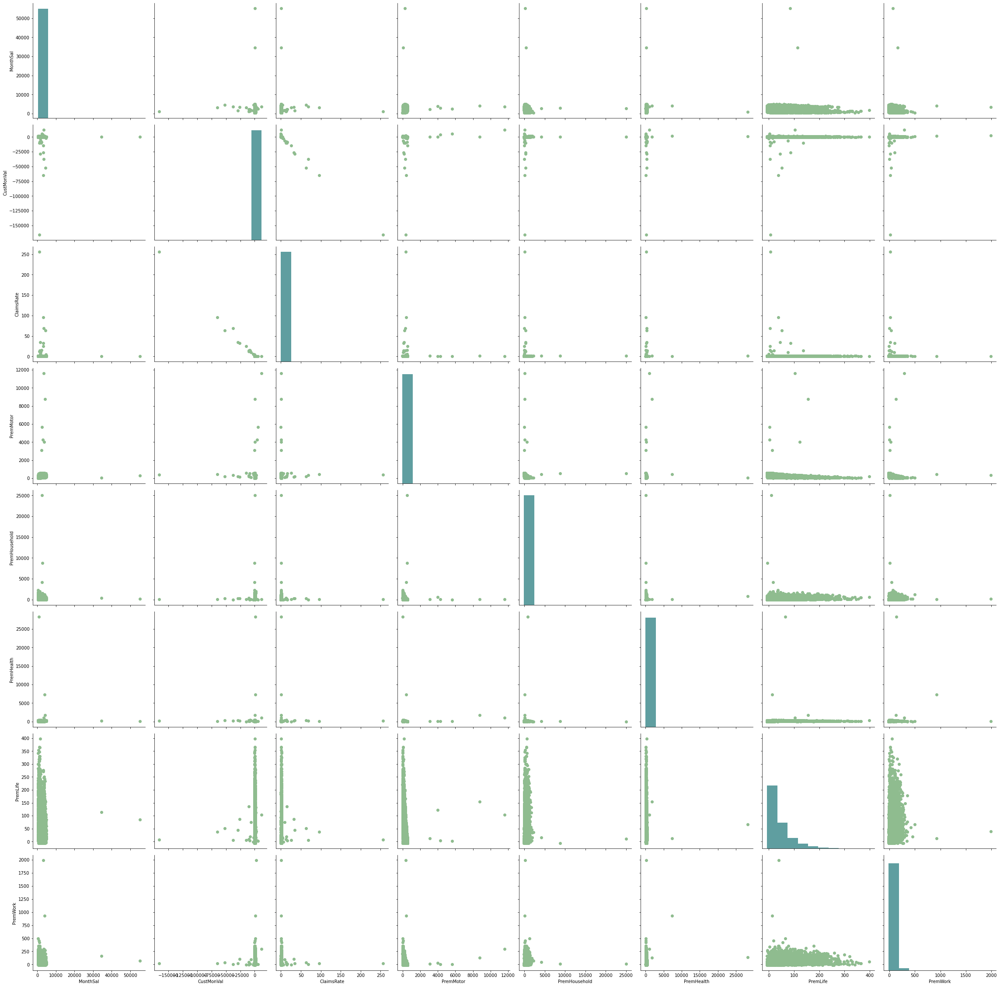

In [10]:
grid = sns.PairGrid(data= insur, vars = ['MonthSal', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', \
                                       'PremHealth', 'PremLife', 'PremWork'], height = 4)
grid = grid.map_upper(plt.scatter, color = 'darkseagreen')
grid = grid.map_diag(plt.hist, bins = 10, color = 'cadetblue')
grid = grid.map_lower(plt.scatter, color = 'darkseagreen')

In [11]:
# Store the number of observations before removing the outliers
before_outliers = insur.shape[0]

insur.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10264.0,1986.016368,6.612072,1974.00,1980.00,1986.00,1992.0000,1998.00
MonthSal,10258.0,2506.561318,1157.533656,333.00,1706.00,2501.00,3290.7500,55215.00
CustMonVal,10294.0,177.879094,1945.999783,-165680.42,-9.44,186.87,399.8325,11875.89
ClaimsRate,10294.0,0.742806,2.917245,0.00,0.39,0.72,0.9800,256.20
PremMotor,10260.0,300.452764,211.931258,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10294.0,210.451889,352.624933,-75.00,49.45,132.80,290.0500,25048.80
PremHealth,10251.0,171.585406,296.434205,-2.11,111.80,162.81,219.8200,28272.00
PremLife,10190.0,41.861608,47.483252,-7.00,9.89,25.56,57.7900,398.30
PremWork,10208.0,41.281541,51.517799,-12.00,10.67,25.67,56.7900,1988.70


### Function to visualize the histograms and boxplots

In [12]:
def show_plots(feature):
    fig = px.histogram(insur, x=insur[feature], color_discrete_sequence=['darkseagreen'], template='plotly_white', \
                   width=950, height=350)
    fig.show()

    fig = px.box(insur, y=insur[feature], color_discrete_sequence=['dimgrey'], template='plotly_white', \
                 width=400, height=350)
    fig.show()

### MonthSal

In [13]:
# show_plots('MonthSal')

In [14]:
#add the observation to the outlier dataset
outliers_df = insur.loc[(insur["MonthSal"] == 34490.0) | (insur["MonthSal"] == 55215.0)].copy()
display(outliers_df.shape)

#remove from the insur dataset
insur = insur.loc[(insur["MonthSal"] != 34490.0) & (insur["MonthSal"] != 55215.0)] # Delete 2 lines

(2, 13)

### CustMonVal

In [15]:
# show_plots('CustMonVal') 

In [16]:
#add the observation to the outlier dataset
outliers_df = outliers_df.append(insur.loc[(insur["CustMonVal"] < -490.2) | (insur["CustMonVal"] > 1197.22)].copy())
display(outliers_df.shape) #2 + 51

#remove from the insur dataset
insur = insur.loc[(insur["CustMonVal"] >= -490.2) & (insur["CustMonVal"] <= 1197.22)] 
# Delete 51 lines

(53, 13)

### ClaimsRate

In [17]:
# show_plots('ClaimsRate')

In [18]:
#add the observation to the outlier dataset
outliers_df = outliers_df.append(insur.loc[insur["ClaimsRate"]  > 1.62].copy())
display(outliers_df.shape) # +1

#remove from the insur dataset
insur = insur.loc[insur["ClaimsRate"] <= 1.62] # Delete 1 line

(54, 13)

### PremMotor

In [19]:
# show_plots('PremMotor')

In [20]:
#add the observation to the outlier dataset
outliers_df = outliers_df.append(insur.loc[(insur["PremMotor"] == 3106.62) | \
                                           (insur["PremMotor"] == 4003.44) | (insur["PremMotor"] == 8744.61)].copy())
display(outliers_df.shape) # +3 apagados 

#remove from the insur dataset
insur = insur.loc[(insur["PremMotor"] != 3106.62) & (insur["PremMotor"] != 4003.44) & (insur["PremMotor"] != 8744.61)]

# Delete 3 lines

(57, 13)

### PremHousehold

In [21]:
show_plots('PremHousehold')

In [22]:
#add the observation to the outlier dataset
outliers_df = outliers_df.append(insur.loc[insur["PremHousehold"] >= 1179.1].copy())
display(outliers_df.shape) #57 + 35

#remove from the insur dataset
insur = insur.loc[insur["PremHousehold"] < 1179.1] 
# Delete 35 lines

(92, 13)

### PremHealth

In [23]:
# show_plots('PremHealth')

In [24]:
#add the observation to the outlier dataset
outliers_df =  outliers_df.append(insur.loc[(insur["PremHealth"] == 28272.0) | (insur["PremHealth"] == 442.86 ) \
                                          | (insur["PremHealth"] == 440.86)  | (insur["PremHealth"] == 432.97)  \
                                          | (insur["PremHealth"] == 417.3)   | (insur["PremHealth"] == 417.08)].copy())
display(outliers_df.shape) # +6 apagados 

#remove from the insur dataset
insur = insur.loc[(insur["PremHealth"] != 28272.0) & (insur["PremHealth"] != 442.86 ) \
                 & (insur["PremHealth"] != 440.86) & (insur["PremHealth"] != 432.97)  \
                 & (insur["PremHealth"] != 417.3)  & (insur["PremHealth"] != 417.08)] # Delete 6 lines


(98, 13)

### PremLife

In [25]:
show_plots('PremLife') # AINDA TEM ALGUNS OUTLIERS ?? TIRAR OUTLIERS !!

In [26]:
#add the observation to the outlier dataset
outliers_df =  outliers_df.append(insur.loc[(insur["PremLife"] == 398.3) | (insur["PremLife"] == 365.18) | \
                                            (insur["PremLife"] == 363.29) | (insur["PremLife"] == 354.4)  | \
                                            (insur["PremLife"] == 346.4) | (insur["PremLife"] == 341.51) | \
                                            (insur["PremLife"] == 330.84) | (insur["PremLife"] == 329.73) | \
                                            (insur["PremLife"] == 324.84) | (insur["PremLife"] == 320.06) | \
                                            (insur["PremLife"] == 318.06) | (insur["PremLife"] == 313.28) | \
                                            (insur["PremLife"] == 311.28) | (insur["PremLife"] == 309.28) | \
                                            (insur["PremLife"] == 300.5) | (insur["PremLife"] == 297.5) | \
                                            (insur["PremLife"] == 295.5) | (insur["PremLife"] == 299.5)].copy())
display(outliers_df.shape) # +6 apagados 

#remove from the insur dataset
insur = insur.loc[ (insur["PremLife"] != 398.3) & (insur["PremLife"] != 365.18) & \
                   (insur["PremLife"] != 363.29) & (insur["PremLife"] != 354.4)  & \
                   (insur["PremLife"] != 346.4) & (insur["PremLife"] != 341.51) & \
                   (insur["PremLife"] != 330.84) & (insur["PremLife"] != 329.73) & \
                   (insur["PremLife"] != 324.84) & (insur["PremLife"] != 320.06) & \
                   (insur["PremLife"] != 318.06) & (insur["PremLife"] != 313.28) & \
                   (insur["PremLife"] != 311.28) & (insur["PremLife"] != 309.28) & \
                   (insur["PremLife"] != 300.5) & (insur["PremLife"] != 297.5) & \
                   (insur["PremLife"] != 295.5) & (insur["PremLife"] != 299.5)]

# Delete 18 lines

(116, 13)

### PremWork

In [27]:
show_plots('PremWork') # AINDA TEM ALGUNS OUTLIERS ?? # abaixo de 310 !!

In [28]:
#add the observation to the outlier dataset
outliers_df =  outliers_df.append(insur.loc[(insur["PremWork"] == 417.08) | (insur["PremWork"] == 451.53) | \
                                            (insur["PremWork"] == 494.1) | (insur["PremWork"] == 353.18) | \
                                            (insur["PremWork"] == 350.62) | (insur["PremWork"] == 352.61) | \
                                            (insur["PremWork"] == 339.84) | (insur["PremWork"] == 334.73) | \
                                            (insur["PremWork"] == 323.73) | (insur["PremWork"] == 322.95) | \
                                            (insur["PremWork"] == 313.95) | (insur["PremWork"] == 312.95) | \
                                            (insur["PremWork"] == 310.28) | (insur["PremWork"] == 352.62) | \
                                            (insur["PremWork"] == 352.61) | (insur["PremWork"] == 313.28)].copy())
display(outliers_df.shape) # +3 apagados 

#remove from the insur dataset
insur = insur.loc[(insur["PremWork"] != 417.08) & (insur["PremWork"] != 451.53) & \
                  (insur["PremWork"] != 494.1) & (insur["PremWork"] != 353.18) & \
                  (insur["PremWork"] != 350.62) & (insur["PremWork"] != 352.61)  & \
                  (insur["PremWork"] != 339.84) & (insur["PremWork"] != 334.73) & \
                  (insur["PremWork"] != 323.73) & (insur["PremWork"] != 322.95) & \
                  (insur["PremWork"] != 313.95) & (insur["PremWork"] != 312.95)  & \
                  (insur["PremWork"] != 310.28) & (insur["PremWork"] != 352.62) & \
                  (insur["PremWork"] != 352.51) & (insur["PremWork"] != 313.28)] 

# Delete 13 lines

(129, 13)

In [29]:
#outliers_df.describe().T

In [30]:
after_outliers = insur.shape[0]
perc = round(((before_outliers - after_outliers) / before_outliers)*100, 3)
print(f'By removing the outliers, we deleted {perc}% of our data set ({before_outliers - after_outliers} observations).')

By removing the outliers, we deleted 1.263% of our data set (130 observations).


In [31]:
# grid = sns.PairGrid(data= insur, vars = ['MonthSal', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', \
#                                          'PremLife', 'PremWork'], height = 4)
# grid = grid.map_upper(plt.scatter, color = 'darkseagreen')
# grid = grid.map_diag(plt.hist, bins = 10, color = 'cadetblue')
# grid = grid.map_lower(plt.scatter, color = 'darkseagreen')

In [32]:
# See descriptive statistics for all the variables after the remobal of outliers
insur.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10134.0,1986.019440,6.603780,1974.00,1980.0000,1986.000,1992.0000,1998.00
MonthSal,10128.0,2510.359202,978.767466,333.00,1726.0000,2515.500,3295.0000,5021.00
CustMonVal,10164.0,214.905695,248.353278,-406.07,-9.1375,187.035,397.7825,1197.22
ClaimsRate,10164.0,0.680487,0.317458,0.00,0.3900,0.720,0.9800,1.62
PremMotor,10131.0,299.375269,136.545321,-4.11,195.2600,301.280,408.5200,585.22
PremHousehold,10164.0,199.439522,218.170247,-75.00,48.9000,132.250,284.5000,1154.10
PremHealth,10122.0,168.357365,73.903840,-2.11,112.0200,163.030,219.8200,408.41
PremLife,10061.0,41.158974,45.753440,-7.00,9.8900,25.560,57.0100,284.61
PremWork,10079.0,40.230807,44.970162,-12.00,10.6700,25.560,55.9000,298.50


In [33]:
#DEFINE METRIC AND NON METRIC FEATURES
metric_features = insur.select_dtypes(include=np.number).set_index(insur.index).columns.to_list()
non_metric_features = insur.select_dtypes(exclude=np.number).set_index(insur.index).columns.to_list()

<a class="anchor" id="missing_values">

## 5. Treatment of Missing Values

</a>

In [34]:
insur.isna().sum()

CustID             0
FirstPolYear      30
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         33
PremHousehold      0
PremHealth        42
PremLife         103
PremWork          85
dtype: int64

In [35]:
#STRATEGIES TO APPLY

#FirstPolYear      30 ------> simply remove, it is probably an error of the system!

#GeoLivArea         1 -------> replace with the mode!

#PremMotor         34 ------> replace with zero, meaning that they did not spent anything in that premium!
#PremHealth        43 ------> replace with zero, meaning that they did not spent anything in that premium!
#PremLife         104 ------> replace with zero, meaning that they did not spent anything in that premium!
#PremWork          86 ------> replace with zero, meaning that they did not spent anything in that premium!


#EducDeg           17 
#MonthSal          36 
#Children          21 

### Treatment of missing values from FirstPolYear, GeoLivArea and Prem Variables

In [36]:
# Remove missing values from FirstPolYear
insur.dropna(subset=['FirstPolYear'], inplace=True)  # 30 rows dropped

# Remove missing values from GeoLivArea
insur['GeoLivArea'].fillna(insur['GeoLivArea'].mode(), inplace = True)

# Remove missing values from Prem variables
insur['PremMotor'].fillna(0, inplace = True)
insur['PremHealth'].fillna(0, inplace = True)
insur['PremLife'].fillna(0, inplace = True)
insur['PremWork'].fillna(0, inplace = True)

In [37]:
insur.isna().sum()

CustID            0
FirstPolYear      0
EducDeg           2
MonthSal         34
GeoLivArea        0
Children         13
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

In [38]:
#EducDeg           2 ----->  nearest neighbours
#MonthSal          34 ----->  nearest neighbours
#Children          13 ----->  nearest neighbours

### Treatment of missing values from EducDeg

In [39]:
# Impute the missing values in EducDeg
missing_EducDeg = insur.loc[insur.EducDeg.isnull()]
#missing_EducDeg
complete = insur.loc[~insur.EducDeg.isnull()]
#complete


# We can change these parameters !!!
knn = KNeighborsClassifier(n_neighbors=7, weights='distance', metric='euclidean')


# Fit our model to X and y (without missing values)
knn_fitted = knn.fit(complete.loc[ : , ['PremMotor','PremHealth','PremHousehold','PremLife','PremWork', 'CustMonVal', 'ClaimsRate']], complete.loc[ : , 'EducDeg'])

# Imput the missing values in EducDeg
imputed_values = knn_fitted.predict(missing_EducDeg.loc[ : , ['PremMotor','PremHealth','PremHousehold','PremLife','PremWork', 'CustMonVal', 'ClaimsRate']])

missing_EducDeg = missing_EducDeg.drop(columns='EducDeg')
missing_EducDeg.insert(3, 'EducDeg', imputed_values)
imputed_EducDeg = missing_EducDeg
display(imputed_EducDeg) # Show imputed observations

# Drop the nulls values in EducDeg
insur.dropna(subset = ['EducDeg'], inplace = True) # 2 rows dropped

# Concate the observations that had nulls and were imputed
insur = insur.append(imputed_EducDeg) # 2 rows added

,CustID,FirstPolYear,MonthSal,EducDeg,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
1707,1708.0,1992.0,3827.0,2,4.0,0.0,355.52,0.33,222.71,146.7,0.0,94.13,105.24
6560,6561.0,1976.0,NaN,2,4.0,1.0,85.91,0.77,91.24,0.0,227.6,60.01,110.91


In [40]:
insur.isna().sum()

CustID            0
FirstPolYear      0
EducDeg           0
MonthSal         34
GeoLivArea        0
Children         13
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

### Treatment of missing values from MonthSal

In [41]:
# Impute the missing values in MonthSal
y,x = dmatrices('MonthSal ~ FirstPolYear + CustMonVal + ClaimsRate + PremHealth + PremMotor + PremHousehold + PremLife + PremWork', data = insur, NA_action='drop', return_type='dataframe')
mod = sm.OLS(y,x)
res = mod.fit()
# print(res.summary())
# dá 36% de variância explicada

In [42]:
#criar tabela com as observacoes onde MonthSal é null
missing_MonthSal = insur[insur['MonthSal'].isna()]

#criar outra tabela com as observaçoes inversas
complete = insur[~insur.index.isin(missing_MonthSal.index)]

#criar o regressor - podemos alterar isto !!!
regressor = KNeighborsRegressor(n_neighbors=11, weights='distance', metric='euclidean')


#treinar os dados
regressor_fitted = regressor.fit(complete.loc[:, ['FirstPolYear', 'PremHousehold', 'PremMotor', 'PremLife', 'PremWork']], complete.loc[:,['MonthSal']])

#criar array com os valores previstos
imputed_values = regressor_fitted.predict(missing_MonthSal.loc[:, ['FirstPolYear', 'PremHousehold', 'PremMotor', 'PremLife', 'PremWork']])

missing_MonthSal = missing_MonthSal.drop(columns=['MonthSal'])
missing_MonthSal.insert(4, 'MonthSal', imputed_values)
imputed_MonthSal = missing_MonthSal
# display(imputed_MonthSal) # Show imputed observations

#remover do dataframe original todas as observaçoes onde MonthSal é null
insur = insur.loc[insur['MonthSal'].notnull()]

insur = pd.concat([insur, imputed_MonthSal])

In [43]:
insur.isna().sum()

CustID            0
FirstPolYear      0
EducDeg           0
MonthSal          0
GeoLivArea        0
Children         13
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
dtype: int64

### Treatment of missing values from Children

In [44]:
missing_Children = insur.loc[insur.Children.isnull()]
#missing_Children
complete = insur.loc[~insur.Children.isnull()]
#complete


# We can change these parameters - podemos mudar isto !!!
knn = KNeighborsClassifier(n_neighbors=9, weights='distance', metric='euclidean')


# Fit our model to X and y (without missing values)
knn_fitted = knn.fit(complete.loc[ : , ['MonthSal', 'PremMotor','PremHealth','PremHousehold','PremLife','PremWork', 'CustMonVal', 'ClaimsRate']], complete.loc[ : , 'Children'])

# Imput the missing values in EducDeg
imputed_values = knn_fitted.predict(missing_Children.loc[ : , ['MonthSal', 'PremMotor','PremHealth','PremHousehold','PremLife','PremWork', 'CustMonVal', 'ClaimsRate']])

missing_Children = missing_Children.drop(columns='Children')
missing_Children.insert(6, 'Children', imputed_values)
imputed_Children = missing_Children
# display(imputed_Children) # show imputed observations

#drop the nulls values in EducDeg
insur.dropna(subset = ['Children'], inplace = True) # 2 rows dropped

#concate the observations that had nulls and were imputed
insur = insur.append(imputed_Children) # 2 rows added

In [45]:
insur.isna().sum()

CustID           0
FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

### Treatment of missing values from BirthYear

In [46]:
# # Impute the missing values in BirthYear

# y,x = dmatrices('BirthYear ~ FirstPolYear + MonthSal + CustMonVal + ClaimsRate + PremMotor + PremHousehold + PremHealth + PremLife + PremWork', 
#                 data = insur, NA_action='drop', return_type='dataframe')
# mod = sm.OLS(y,x)
# res = mod.fit()
# print(res.summary())

In [47]:
# missing_BirthYear = insur.loc[insur.BirthYear.isnull()]
# #missing_BirthYear
# complete = insur.loc[~insur.BirthYear.isnull()]
# #complete



# # We can change these parameters
# clf = KNeighborsClassifier(n_neighbors=7, weights='distance', metric='euclidean')



# # Fit our model to X and y (without missing values)
# trained_model = clf.fit(complete.loc[ : , ['FirstPolYear','MonthSal']], complete.loc[ : , 'BirthYear'])

# # Imput the missing values in EducDeg
# imputed_values = trained_model.predict(missing_BirthYear.loc[ : , ['FirstPolYear','MonthSal']])

# missing_BirthYear = missing_BirthYear.drop(columns='BirthYear')
# missing_BirthYear.insert(2, 'BirthYear', imputed_values)
# imputed_BirthYear = missing_BirthYear
# display(imputed_BirthYear) # show imputed observations

# #drop the nulls values in EducDeg
# insur.dropna(subset = ['BirthYear'], inplace = True) # 1967 rows dropped

# #concate the observations that had nulls and were imputed
# insur = insur.append(imputed_BirthYear, sort=True) 

In [48]:
# insur.apply(lambda x: 1 if x.FirstPolYear < x.BirthYear else 0, axis=1).value_counts()

In [49]:
#REMOVE CustID FROM THE DATASET
insur.drop('CustID', axis = 1, inplace= True)

In [50]:
insur.isna().sum()

FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

<a class="anchor" id="feature_engineering">

## 6. Feature Engineering

</a>

### Transform Variables

In [51]:
# #Apply Square Root to some variables because of Skewness
# # SQRT's from original variables with long tails

insur['PremLife_sqrt'] = np.sqrt(insur['PremLife'] + abs(insur['PremLife'].min()))
insur['PremWork_sqrt'] = np.sqrt(insur['PremWork'] + abs(insur['PremWork'].min()))
insur['PremHousehold_sqrt'] = np.sqrt(insur['PremHousehold'] + abs(insur['PremHousehold'].min()))

# #As we had negative numbers and it is not possible to compute the square root of a negative number,
# #we had to sum to all observations the absolute value of the minimum value for each variable. 

In [52]:
# show_plots('PremHousehold_sqrt')

### New Numerical Variables

In [53]:
#Number of year since the client has been involved with the company
#insur.insert(5, 'Client_Recency', 2016 - insur['FirstPolYear'])

In [54]:
insur['Client_Recency'] = 2016 - insur['FirstPolYear']  ############ DIVIDIR POR INTERVALOS ?? #########################

#Total amount spent in premiums 
insur['Total_Premiums'] = insur.loc[:,['PremMotor','PremHousehold','PremHealth','PremLife','PremWork']].sum(1)
 
#Annual Salary of the client
insur['Annual_Salary'] = 12 * insur['MonthSal']

#Weight of the expenditure in Premiums on the total Annual Salary
insur['SalarySpent_Ratio'] = insur['Total_Premiums']/insur['Annual_Salary']

#Weight of the expenditure in Motor Premiums on the Total Premiums 
insur['PremMotor_Ratio'] = insur['PremMotor']/insur['Total_Premiums']
insur['PremMotor_Ratio'] = insur['PremMotor_Ratio'].where(insur['PremMotor_Ratio']>0, 0)  ######### ISTO FAZ SENTIDO?? #####

#Weight of the expenditure in Household Premiums on the Total Premiums 
insur['PremHousehold_Ratio'] = insur['PremHousehold']/insur['Total_Premiums']
insur['PremHousehold_Ratio'] = insur['PremHousehold_Ratio'].where(insur['PremHousehold_Ratio']>0, 0)

#Weight of the expenditure in Health Premiums on the Total Premiums 
insur['PremHealth_Ratio'] = insur['PremHealth']/insur['Total_Premiums']
insur['PremHealth_Ratio'] = insur['PremHealth_Ratio'].where(insur['PremHealth_Ratio']>0, 0)

#Weight of the expenditure in Life Premiums on the Total Premiums 
insur['PremLife_Ratio'] = insur['PremLife']/insur['Total_Premiums']
insur['PremLife_Ratio'] = insur['PremLife_Ratio'].where(insur['PremLife_Ratio']>0, 0)

#Weight of the expenditure in Work Premiums on the Total Premiums 
insur['PremWork_Ratio'] = insur['PremWork']/insur['Total_Premiums']
insur['PremWork_Ratio'] = insur['PremWork_Ratio'].where(insur['PremWork_Ratio']>0, 0)


# What about prémios negativos? O que fazer?
# Negative premiums may manifest reversals occurred in the current year, paid in previous one(s)

#### NEW VARIABLES: Checking outliers and distributions

In [55]:
#SQRT's from NEW variables with long tails
insur['SalarySpent_Ratio_sqrt'] = np.sqrt(insur['SalarySpent_Ratio'])
insur['PremLife_Ratio_sqrt'] = np.sqrt(insur['PremLife_Ratio'])
insur['PremWork_Ratio_sqrt'] = np.sqrt(insur['PremWork_Ratio']) 
insur['PremHousehold_Ratio_sqrt'] = np.sqrt(insur['PremHousehold_Ratio'])

##### Salary

In [56]:
# for i in insur.SalarySpent_Ratio.sort_values():
#  print(i)

In [57]:
#show_plots('MonthSal')
#show_plots('Annual_Salary')
#show_plots('SalarySpent_Ratio')
#show_plots('SalarySpent_Ratio_sqrt')

In [58]:
# # NÃO ESTÁ A ADICIONAR ESTES OUTLIERS AO DATASET !!!

# #add to the outliers dataset
# outliers_df = outliers_df.append(insur.loc[(insur["SalarySpent_Ratio"] == 0.4648712) | \
#                                            (insur["SalarySpent_Ratio"] == 0.3650611) | \
#                                            (insur["SalarySpent_Ratio"] == 0.3361918)].copy())

# #remove from the insur dataset
# insur = insur.loc[(insur["SalarySpent_Ratio"] != 0.4648712) & (insur["SalarySpent_Ratio"] != 0.3650611) & \
#                   (insur["SalarySpent_Ratio"] != 0.3361918)]

# display(outliers_df.shape) # +3 apagados 

##### Life

In [59]:
#show_plots('PremLife')
#show_plots('PremLife_sqrt')
#show_plots('PremLife_Ratio')
#show_plots('PremLife_Ratio_sqrt')

##### Work

In [60]:
#show_plots('PremWork')
#show_plots('PremWork_sqrt')
#show_plots('PremWork_Ratio')
#show_plots('PremWork_Ratio_sqrt')

##### Household

In [61]:
#show_plots('PremHousehold') 
#show_plots('PremHousehold_sqrt') 
#show_plots('PremHousehold_Ratio') 
#show_plots('PremHousehold_Ratio_sqrt') 

In [62]:
metric_features = insur.select_dtypes(include=np.number).set_index(insur.index).columns.to_list()
non_metric_features = insur.select_dtypes(exclude=np.number).set_index(insur.index).columns.to_list()

<a class="anchor" id="correlation_matrix">

## 7. Correlation Matrix

</a>

In [63]:
# Correlation Matrix
def corr_matrix():
    
    correlacoes = insur[metric_features].corr(method='spearman')
    correlacoes[np.abs(correlacoes)<0.05] = 0
    correlacoes = round(correlacoes,2)
    
    f, ax = plt.subplots(figsize = (16, 16))
    mask = np.zeros_like(correlacoes, dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True

    mask_annot = np.absolute(correlacoes.values) >= 0.6
    annot1 = np.where(mask_annot, correlacoes.values, np.full((len(metric_features),len(metric_features)),""))
    cmap = sns.diverging_palette(49, 163, as_cmap = True)

    sns.heatmap(correlacoes, mask=mask, cmap=cmap, center = 0, square = True, ax = ax, \
                linewidths = .5, annot = annot1, fmt = "s", vmin = -1, vmax = 1, cbar_kws= dict(ticks = [-1,0,1]))

    sns.set(font_scale = 1.2)
    sns.set_style('white')

    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom + 0.5, top - 0.5)
    plt.show()

<ipython-input-63-8016566c2b9d>:9: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

locator: <matplotlib.ticker.FixedLocator object at 0x000001F86CEE3550>
Using auto colorbar locator <matplotlib.ticker.FixedLocator object at 0x000001F86CEE3550> on colorbar
Setting pcolormesh
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: scor

findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'SAS Monospace Bold' (sasmonob.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_PSTC.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Blackadder ITC' (ITCBLKAD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Wingdings 2' (WINGDNG2.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Noto Sans Thai' (nsthb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Noto Sans JP' (nsjpb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans' (LucidaSansRegular.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Guttman Kav' (GKAV

findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-MEDIUM.TTF) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal 900 normal>) = 10.525
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Thorndale AMT' (saswthb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bell MT' (BELLI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Noto Sans JP' (nsjpl.ttf) normal norma

findfont: score(<Font 'Guttman Logo1' (LOGO1.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal 900 normal>) = 10.525
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Guttman Yad-Light' (GYADXL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSD.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Courier New' (couri.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Uighur' (MSUIGHUR.TTF) 

findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Perpetua Titling MT' (PERTILI.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Guttman Drogolin' (DROGM.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 600 normal>) = 10.24
findfont: score(<Font 'SAS Monospace' (sasmono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Helvetica 

findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'Guttman Yad-Brush' (GYADBR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguili.ttf) italic normal 300 normal>) = 11.145
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbola' (symbolah.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Noto Sans SC' (nsscr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Guttman Myamfix' (GMYAMFIX.TTF) normal normal 40

findfont: score(<Font 'Avenir Next for SAS' (anfsasl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Cumberland AMT' (saswcubi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Candara' (Candarai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Guttman Rashi' (RASHIB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Showcard Gothic' (SHOWG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Hatzvi' (TZVIB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT'

findfont: score(<Font 'MS Reference Specialty' (REFSPCL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Mantova-Decor' (MANTDEC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Thorndale AMT' (saswthr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaS.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Bookman Old Style' (BOOKOSBI.TTF) italic normal 600 normal>) = 11.24
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman Symbol' (sasgtsbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee' (LEELAWDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Rockwell Condensed' (ROCCB___.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335

findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 500 normal>) = 10.145
findfont: score(<Font 'Magneto' (MAGNETOB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft JhengHei' (msjhl.ttc) normal normal 290 normal>) = 10.1545
findfont: score(<Font 'Arial Symbol' (sasgasi.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Century' (CENTURY.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal 900 normal>) = 11.525
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Rashi' (RASHI.TTF) norm

findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century' (CENTURY.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal 350 normal>) = 10.0975
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Old English Text MT' (OL

findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Symbola' (symbolah.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Guttman Miryam' (MIRB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Helvetica Neue for SAS' (hnfsasl.ttf) normal normal 300 normal>) = 10.145
findfont: score(<Font 'Gigi' (GIGI.TTF) normal normal 400 normal>) = 10.05
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to Arial ('C:\\WINDOWS\\Fonts\\arial.ttf') with score of 0.050000.


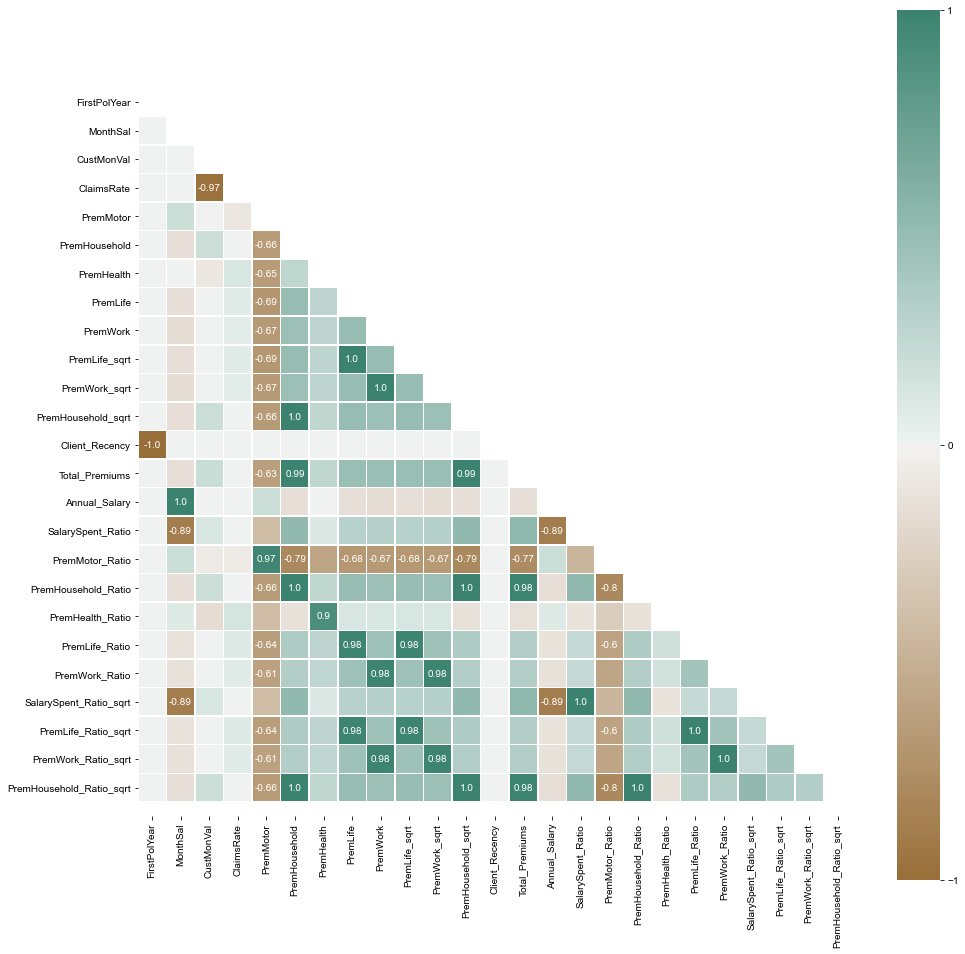

In [64]:
 corr_matrix()

In [65]:
# Use this cell to drop the correlated variables

insur.drop('FirstPolYear', axis=1, inplace=True)
insur.drop('Annual_Salary', axis=1, inplace=True)

# insur.drop('ClaimsRate', axis=1, inplace=True)

# insur.drop('PremLife', axis=1, inplace=True)
# insur.drop('PremHousehold', axis=1, inplace=True)
# insur.drop('PremWork', axis=1, inplace=True)

# insur.drop('Total_Premiums', axis=1, inplace=True)


# # insur.drop('MonthSal', axis=1, inplace=True) 
# insur.drop('SalarySpent_Ratio', axis=1, inplace=True) 


metric_features = insur.select_dtypes(include=np.number).set_index(insur.index).columns.to_list()

<a class="anchor" id="scaling_methods">

## 8. Scaling Methods

</a>

In [66]:
insur[metric_features].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
MonthSal,10134.0,2510.40,977.92,333.00,1727.00,2516.00,3293.75,5021.00
CustMonVal,10134.0,214.97,248.42,-406.07,-9.00,187.04,397.72,1197.22
ClaimsRate,10134.0,0.68,0.32,0.00,0.39,0.72,0.98,1.62
PremMotor,10134.0,298.29,137.37,-4.11,193.29,299.50,408.30,585.22
PremHousehold,10134.0,199.57,218.24,-75.00,48.90,132.25,284.50,1154.10
PremHealth,10134.0,167.69,74.53,-2.11,111.80,162.92,219.82,408.41
PremLife,10134.0,40.76,45.73,-7.00,9.78,24.67,56.90,284.61
PremWork,10134.0,39.92,44.96,-12.00,9.89,25.45,55.79,298.50
PremLife_sqrt,10134.0,6.24,2.97,0.00,4.10,5.63,7.99,17.08
PremWork_sqrt,10134.0,6.64,2.80,0.00,4.68,6.12,8.23,17.62


In [67]:
# SCALE THE METRIC FEATURES  
insur_min_max = insur.copy()

# Select the scaler to use
min_max_scaler = MinMaxScaler()

scaled_feat = min_max_scaler.fit_transform(insur_min_max[metric_features])
insur_min_max[metric_features] = scaled_feat

# Checking max and min of minmaxed variables
# insur_min_max[metric_features].describe().round(2).T

In [68]:
# SCALE THE METRIC FEATURES 
insur_min_max2 = insur.copy()

# Select the scaler to use
min_max2_scaler = MinMaxScaler(feature_range=(-1, 1))

scaled_feat = min_max2_scaler.fit_transform(insur_min_max2[metric_features])
insur_min_max2[metric_features] = scaled_feat

# Checking max and min of minmaxed variables
# insur_min_max2[metric_features].describe().round(2).T

In [69]:
# SCALE THE METRIC FEATURES  
insur_std_scaler = insur.copy()

# Select the scaler to use
standard_scaler = StandardScaler()

scaled_feat = standard_scaler.fit_transform(insur_std_scaler[metric_features])
insur_std_scaler[metric_features] = scaled_feat

# Checking max and min of minmaxed variables
insur_std_scaler[metric_features].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
MonthSal,10134.0,-0.0,1.0,-2.23,-0.80,0.01,0.80,2.57
CustMonVal,10134.0,-0.0,1.0,-2.50,-0.90,-0.11,0.74,3.95
ClaimsRate,10134.0,-0.0,1.0,-2.14,-0.92,0.12,0.94,2.96
PremMotor,10134.0,-0.0,1.0,-2.20,-0.76,0.01,0.80,2.09
PremHousehold,10134.0,0.0,1.0,-1.26,-0.69,-0.31,0.39,4.37
PremHealth,10134.0,0.0,1.0,-2.28,-0.75,-0.06,0.70,3.23
PremLife,10134.0,-0.0,1.0,-1.04,-0.68,-0.35,0.35,5.33
PremWork,10134.0,-0.0,1.0,-1.15,-0.67,-0.32,0.35,5.75
PremLife_sqrt,10134.0,-0.0,1.0,-2.10,-0.72,-0.21,0.59,3.65
PremWork_sqrt,10134.0,0.0,1.0,-2.37,-0.70,-0.19,0.57,3.92


### Choose the scaler to use

In [70]:
# insur = insur_min_max
# insur = insur_min_max2
insur = insur_std_scaler

<a class="anchor" id="pca">

## 9. PCA
</a>

In [71]:
# # Use PCA to reduce dimensionality of data
# pca_df = insur.copy()

# pca = PCA()
# pca_feat = pca.fit_transform(pca_df[metric_features])

In [72]:
# # Output PCA table
# pd.DataFrame(
#     {"Eigenvalue": pca.explained_variance_,
#      "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
#      "Proportion": pca.explained_variance_ratio_,
#      "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
#     index=range(1, pca.n_components_ + 1)
# )

In [73]:
# # figure and axes
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# # draw plots
# ax1.plot(pca.explained_variance_, marker=".", markersize=12)
# ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
# ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# # customizations
# ax2.legend()
# ax1.set_title("Scree Plot", fontsize=14)
# ax2.set_title("Variance Explained", fontsize=14)
# ax1.set_ylabel("Eigenvalue")
# ax2.set_ylabel("Proportion")
# ax1.set_xlabel("Components")
# ax2.set_xlabel("Components")
# ax1.set_xticks(range(0, pca.n_components_, 2))
# ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
# ax2.set_xticks(range(0, pca.n_components_, 2))
# ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

# plt.show()

In [74]:
# # Perform PCA again with the number of principal components you want to retain
# pca = PCA(n_components=5)
# pca_feat = pca.fit_transform(pca_df[metric_features])
# pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
# pca_insur = pd.DataFrame(pca_feat, index=pca_df.index, columns=pca_feat_names)  # remember index=insur_pca.index
# pca_insur

In [75]:
# # Reassigning insur to contain pca variables
# insur_pca = pd.concat([pca_df, pca_insur], axis=1)
# insur_pca.head()

In [76]:
# def _color_red_or_green(val):
#     if val < -0.45:
#         color = 'background-color: red'
#     elif val > 0.45:
#         color = 'background-color: green'
#     else:
#         color = ''
#     return color

# # Interpreting each Principal Component
# loadings = insur_pca[list(metric_features) + pca_feat_names].corr().loc[list(metric_features), pca_feat_names]
# loadings.style.applymap(_color_red_or_green)

In [77]:
# insur = insur_pca

In [78]:
# from pandas_profiling import ProfileReport

# profile = ProfileReport(
#     insur, 
#     title='Insurance Dataset',
#     correlations={
#         "pearson": {"calculate": True},
#         "spearman": {"calculate": False},
#         "kendall": {"calculate": False},
#         "phi_k": {"calculate": False},
#         "cramers": {"calculate": False},
#     },
# )

# profile.to_notebook_iframe()

<a class="anchor" id="segmentation">

## 10. Create Segmentation 

</a>

In [79]:
insur = insur.reset_index()

In [80]:
value_df = insur[['Client_Recency','MonthSal', 'CustMonVal']]
# display(value_df.head(3))

value_df2 = insur[['Client_Recency','MonthSal', 'ClaimsRate']]
# display(value_df2.head(3))

value_df3 = insur[['Client_Recency','SalarySpent_Ratio', 'CustMonVal']]
# display(value_df3.head(3))

value_df4 = insur[['Client_Recency','SalarySpent_Ratio', 'ClaimsRate']]
# display(value_df4.head(3))

# --------------------------------------------------------------------------------------------------------------------

products_df = insur[['PremMotor', 'PremHealth', 'PremLife_sqrt', 'PremWork_sqrt', 'PremHousehold_sqrt']]
# display(products_df.head(3))

products_df2 = insur[['PremMotor', 'PremHealth', 'PremLife_sqrt', 'PremWork_sqrt', 'Total_Premiums']]
# display(products_df2.head(3))

products_df3 = insur[['PremMotor_Ratio', 'PremHealth_Ratio', 'PremLife_Ratio_sqrt', \
                      'PremWork_Ratio_sqrt', 'PremHousehold_Ratio_sqrt']]
# display(products_df3.head(3))

products_df4 = insur[['PremMotor_Ratio', 'PremHealth_Ratio', 'PremLife_Ratio_sqrt', \
                      'PremWork_Ratio_sqrt', 'Total_Premiums']]
# display(products_df4.head(3))


<a class="anchor" id="quartile_based_clustering">

## 11. Quartile-based Clustering
    
</a>

In [81]:
def quartileMatrix(df, feature1, feature2):
    quartile_id = ['q1','q2','q3','q4']
    df['f1_quartile'] = pd.qcut(df[feature1], 4, quartile_id)
    df['f2_quartile'] = pd.qcut(df[feature2], 4, quartile_id)
    quartiles_df = pd.DataFrame(index=quartile_id, columns=quartile_id)
    
    for i in quartile_id:
        for j in quartile_id:
            quartiles_df.loc[i,j] = len(df[(df['f1_quartile']==i) & (df['f2_quartile']==j)])
            
    return quartiles_df

In [86]:
def quartilePlotter(df, y_variables, x_variable):

    widths = [6, 6, 6]
    heights = [6, 6]    
    gs_kw = dict(width_ratios=widths, height_ratios=heights)

    f,((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, figsize=(18,12), gridspec_kw=gs_kw)
    ax1.get_shared_y_axes().join(ax2,ax3)
    ax4.get_shared_y_axes().join(ax5)
    
    g1 = sns.heatmap(quartileMatrix(df, y_variables[0], x_variable).apply(pd.to_numeric), annot=True, fmt="d", cmap="Greens",cbar=False,ax=ax1)
    g1.set_ylabel(y_variables[0])
    g1.set_xlabel(x_variable)
    g1.set_ylim(4,0)
    
    g2 = sns.heatmap(quartileMatrix(df, y_variables[1], x_variable).apply(pd.to_numeric), annot=True, fmt="d", cmap="Greens",cbar=False,ax=ax2)
    g2.set_ylabel(y_variables[1])
    g2.set_xlabel(x_variable)
    g2.set_yticks([])
    
    g3 = sns.heatmap(quartileMatrix(df, y_variables[2], x_variable).apply(pd.to_numeric),cmap="Greens", annot=True, fmt="d", cbar=False, ax=ax3)
    g3.set_ylabel(y_variables[2])
    g3.set_xlabel(x_variable)
    g3.set_yticks([])
    
    g4 = sns.heatmap(quartileMatrix(df, y_variables[3], x_variable).apply(pd.to_numeric), annot=True, fmt="d", cmap="Greens",cbar=False,ax=ax4)
    g4.set_ylabel(y_variables[3])
    g4.set_xlabel(x_variable)
    g4.set_yticks([])
    
    g5 = sns.heatmap(quartileMatrix(df, y_variables[4], x_variable).apply(pd.to_numeric),cmap="Greens", annot=True, fmt="d", cbar=False, ax=ax5)
    g5.set_ylabel(y_variables[4])
    g5.set_xlabel(x_variable)
    g5.yaxis.tick_right()
    g5.set_ylim(4, 0)
    
    f.delaxes(ax6)
#     ax1.invert_yaxis()
#     ax2.invert_yaxis()
#     ax3.invert_yaxis()
#     ax4.invert_yaxis()
#     ax5.invert_yaxis()

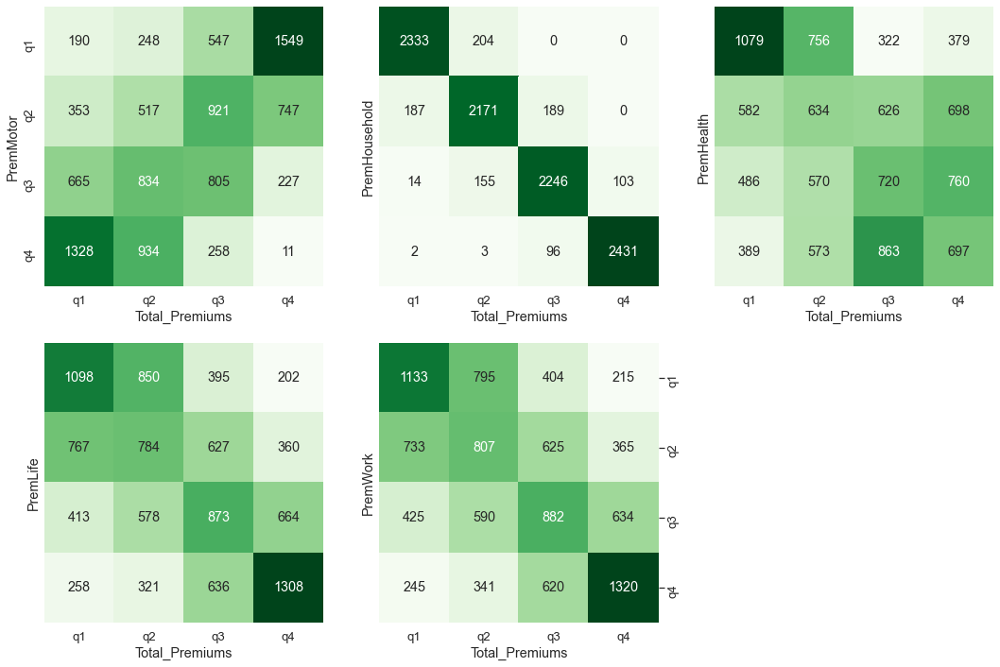

In [87]:
# #Plotting the quartile matrix for Insurance Consumption features
# #Show insurance type sales potential in relation to sum of premiums

y_variables = ['PremMotor',
               'PremHousehold',
               'PremHealth',
               'PremLife',
               'PremWork']

x_variable = 'Total_Premiums'

quartilePlotter(insur, y_variables, x_variable)

<a class="anchor" id="clustering">

## 12. Clustering Algorithms
</a>

### Function for plotting R2 for various clustering methods 

In [694]:
def get_ss(df):
    """
    Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # Return the sum of squares of each df variable

# ------------------------------------------------------------------
def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst   # Return the r2

# ------------------------------------------------------------------
def get_r2_scores(df, clusterer, min_k=1, max_k=6):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    
    # Iterate over number of clusters
    for n in range(min_k, max_k+1):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
        
    return r2_clust

# ------------------------------------------------------------------
def plot_r2_scores(df):

    max_nclus = 5
    
    kmeans = KMeans(init='k-means++', n_init=20, random_state=1)
    kmedoids =  KMedoids(init='heuristic', random_state=1)
    hierarchical = AgglomerativeClustering(affinity='euclidean')

    r2_scores = {}
    r2_scores['kmeans'] = get_r2_scores(df, kmeans, max_k=max_nclus)
    r2_scores['kmedoids'] = get_r2_scores(df, kmedoids, max_k=max_nclus)

    for linkage in ['complete', 'average', 'single', 'ward']:
        r2_scores[linkage] = get_r2_scores(df, hierarchical.set_params(linkage=linkage), max_k=max_nclus)
    
    # Print DataFrame
    r2_df = pd.DataFrame(r2_scores)
    
    def _color_max(val):
        if val in max_values:
            color = 'background-color: green'
        else:
            color = ''
        return color

    max_values = list(r2_df.max(axis=1))[1:]
    display(r2_df.style.applymap(_color_max))
    
    # Plot data
    r2_df.plot.line(figsize=(14,7))
    plt.gca().invert_xaxis()  # invert x axis
    
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.legend(title="Cluster methods", title_fontsize=11)
    plt.xlabel("Number of clusters", fontsize=13)
    plt.xticks(range(1, max_nclus + 1))
    plt.ylabel("R² metric", fontsize=13)
    plt.show()


### Function to plot the dendogram

In [695]:
def dendogram(hclust, dashed_line=20):
    
    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    # hclust.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hclust.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack( [hclust.children_, hclust.distances_, counts] ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(13,5))
    # The Dendrogram parameters need to be tuned
    y_threshold = dashed_line
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()
    

### Function to plot the inertia values for Kmeans and Kmedoids

In [696]:
def inertia_over_clusters(method, df, random_state,init, n_init=15):
    
    range_clusters = range(2, 9)
    inertia = [None,None]
    
    if method == 'Kmeans':
        for n_clus in range_clusters:  
            kmeans = KMeans(n_clusters=n_clus, init=init, n_init=n_init, random_state=random_state)
            kmeans.fit(df)
            inertia.append(kmeans.inertia_)  

    if method == 'Kmedoids':
        for n_clus in range_clusters:  
            kmedoids = KMedoids(n_clusters=n_clus, init=init, random_state=random_state)
            kmedoids.fit(df)
            inertia.append(kmedoids.inertia_) 
            
    # The inertia plot
    plt.figure(figsize=(9,5))
    plt.plot(inertia)
    plt.ylabel("Inertia: SSw")
    plt.xlabel("Number of clusters")
    plt.title("Inertia plot over clusters", size=15)
    plt.show()
    

### Function to plot the silhouette scores for Kmeans and Kmedoids

In [697]:
def silhouette_plots(method, df):
    
    range_clusters = range(2, 7)
    # Storing average silhouette metric
    avg_silhouette = []
    
    for nclus in range_clusters:
        if nclus == 1:
            continue

        # Create a figure
        fig = plt.figure(figsize=(13, 7))

        if method == 'Kmeans':
            # Initialize the KMeans object with n_clusters value and a random generator seed of 10 for reproducibility.
            kmeans = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
            cluster_labels = kmeans.fit_predict(df)        
        
        if method == 'Kmedoids':
            kmedoids = KMedoids(n_clusters=nclus, metric='euclidean', method='alternate', init='heuristic', max_iter=300)
            cluster_labels = kmedoids.fit_predict(df)

        # The silhouette_score gives the average value for all the samples.
        #This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(df, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(df, cluster_labels)

        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            # Get y_upper to demarcate silhouette y range size
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Filling the silhouette
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        plt.title("The silhouette plot for the various clusters.")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")

        # The silhouette coefficient can range from -1, 1
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])

        # The (nclus+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        plt.ylim([0, len(df) + (nclus + 1) * 10])

        plt.yticks([])  # Clear the yaxis labels / ticks
        plt.xticks(np.arange(xmin, xmax, 0.1))
        
    # Plot the average silhouette over the number of clusters
    plt.figure(figsize=(9,5))
    plt.plot(pd.Series(avg_silhouette, index = range_clusters))
    plt.ylabel("Average silhouette")
    plt.xlabel("Number of clusters")
    plt.xticks([2,3,4,5,6])
    plt.title("Average silhouette plot over clusters", size=15)
    plt.show()
    

### Function to plot the profiling for the value segmentation

In [698]:
def profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3):
    
    # Show histograms for each cluster 
    fig, axs = plt.subplots(n_clusters, n_features, figsize=(15,15))

    ################################# cluster 1 #################################
    axs[0, 0].hist(df[df.columns[0]].loc[df[labels]==0], color='darkseagreen', range=range_axis1)
    axs[0, 0].set_title(df.columns[0])
    axs[0, 1].hist(df[df.columns[1]].loc[df[labels]==0], color='cadetblue', range=range_axis2)
    axs[0, 1].set_title(df.columns[1])
    plt.sca(axs[0, 1])
    axs[0, 2].hist(df[df.columns[2]].loc[df[labels]==0], color='tan', range=range_axis3)
    axs[0, 2].set_title(df.columns[2])
    plt.sca(axs[0, 2])


    ################################# cluster 2 #################################
    axs[1, 0].hist(df[df.columns[0]].loc[df[labels]==1], color='darkseagreen', range=range_axis1)
    axs[1, 0].set_title(df.columns[0])
    axs[1, 1].hist(df[df.columns[1]].loc[df[labels]==1], color='cadetblue', range=range_axis2)
    axs[1, 1].set_title(df.columns[1])
    plt.sca(axs[1, 1])
    axs[1, 2].hist(df[df.columns[2]].loc[df[labels]==1], color='tan', range=range_axis3)
    axs[1, 2].set_title(df.columns[2])
    plt.sca(axs[1, 2])

    ################################# cluster 3 #################################
    axs[2, 0].hist(df[df.columns[0]].loc[df[labels]==2], color='darkseagreen', range=range_axis1)
    axs[2, 0].set_title(df.columns[0])
    axs[2, 1].hist(df[df.columns[1]].loc[df[labels]==2], color='cadetblue', range=range_axis2)
    axs[2, 1].set_title(df.columns[1])
    plt.sca(axs[2, 1])
    axs[2, 2].hist(df[df.columns[2]].loc[df[labels]==2], color='tan', range=range_axis3)
    axs[2, 2].set_title(df.columns[2])
    plt.sca(axs[2, 2])

    
    if n_clusters == 4:
        ################################# cluster 4 #################################
        axs[3, 0].hist(df[df.columns[0]].loc[df[labels]==3], color='darkseagreen', range=range_axis1)
        axs[3, 0].set_title(df.columns[0])
        axs[3, 1].hist(df[df.columns[1]].loc[df[labels]==3], color='cadetblue', range=range_axis2)
        axs[3, 1].set_title(df.columns[1])
        plt.sca(axs[3, 1])
        axs[3, 2].hist(df[df.columns[2]].loc[df[labels]==3], color='tan', range=range_axis3)
        axs[3, 2].set_title(df.columns[2])
        plt.sca(axs[3, 2])

    plt.show()

### Function to plot the profiling for the products segmentation

In [699]:
def profiling_for_products(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3, range_axis4, range_axis5):
    
    # Show histograms for each cluster 
    fig, axs = plt.subplots(n_clusters, n_features, figsize=(15,15))

    ################################# cluster 1 #################################
    axs[0, 0].hist(df[df.columns[0]].loc[df[labels]==0], color='darkseagreen', range=range_axis1)
    axs[0, 0].set_title(df.columns[0])
    axs[0, 1].hist(df[df.columns[1]].loc[df[labels]==0], color='cadetblue', range=range_axis2)
    axs[0, 1].set_title(df.columns[1])
    plt.sca(axs[0, 1])
    axs[0, 2].hist(df[df.columns[2]].loc[df[labels]==0], color='tan', range=range_axis3)
    axs[0, 2].set_title(df.columns[2])
    plt.sca(axs[0, 2])
    axs[0, 3].hist(df[df.columns[3]].loc[df[labels]==0], color='gold', range=range_axis4)
    axs[0, 3].set_title(df.columns[3])
    plt.sca(axs[0, 3])
    axs[0, 4].hist(df[df.columns[4]].loc[df[labels]==0], color='lightcoral', range=range_axis5)
    axs[0, 4].set_title(df.columns[4])
    plt.sca(axs[0, 4])

    if n_clusters >= 2:
        ################################# cluster 2 #################################
        axs[1, 0].hist(df[df.columns[0]].loc[df[labels]==1], color='darkseagreen', range=range_axis1)
        axs[1, 0].set_title(df.columns[0])
        axs[1, 1].hist(df[df.columns[1]].loc[df[labels]==1], color='cadetblue', range=range_axis2)
        axs[1, 1].set_title(df.columns[1])
        plt.sca(axs[1, 1])
        axs[1, 2].hist(df[df.columns[2]].loc[df[labels]==1], color='tan', range=range_axis3)
        axs[1, 2].set_title(df.columns[2])
        plt.sca(axs[1, 2])
        axs[1, 3].hist(df[df.columns[3]].loc[df[labels]==1], color='gold', range=range_axis4)
        axs[1, 3].set_title(df.columns[3])
        plt.sca(axs[1, 3])
        axs[1, 4].hist(df[df.columns[4]].loc[df[labels]==1], color='lightcoral', range=range_axis5)
        axs[1, 4].set_title(df.columns[4])
        plt.sca(axs[1, 4])

    if n_clusters >= 3:
        ################################# cluster 3 #################################
        axs[2, 0].hist(df[df.columns[0]].loc[df[labels]==2], color='darkseagreen', range=range_axis1)
        axs[2, 0].set_title(df.columns[0])
        axs[2, 1].hist(df[df.columns[1]].loc[df[labels]==2], color='cadetblue', range=range_axis2)
        axs[2, 1].set_title(df.columns[1])
        plt.sca(axs[2, 1])
        axs[2, 2].hist(df[df.columns[2]].loc[df[labels]==2], color='tan', range=range_axis3)
        axs[2, 2].set_title(df.columns[2])
        plt.sca(axs[2, 2])
        axs[2, 3].hist(df[df.columns[3]].loc[df[labels]==2], color='gold', range=range_axis4)
        axs[2, 3].set_title(df.columns[3])
        plt.sca(axs[2, 3])
        axs[2, 4].hist(df[df.columns[4]].loc[df[labels]==2], color='lightcoral', range=range_axis5)
        axs[2, 4].set_title(df.columns[4])
        plt.sca(axs[2, 4])

    
    if n_clusters >= 4:
        ################################# cluster 4 #################################
        axs[3, 0].hist(df[df.columns[0]].loc[df[labels]==3], color='darkseagreen', range=range_axis1)
        axs[3, 0].set_title(df.columns[0])
        axs[3, 1].hist(df[df.columns[1]].loc[df[labels]==3], color='cadetblue', range=range_axis2)
        axs[3, 1].set_title(df.columns[1])
        plt.sca(axs[3, 1])
        axs[3, 2].hist(df[df.columns[2]].loc[df[labels]==3], color='tan', range=range_axis3)
        axs[3, 2].set_title(df.columns[2])
        plt.sca(axs[3, 2])
        axs[3, 3].hist(df[df.columns[3]].loc[df[labels]==3], color='gold', range=range_axis4)
        axs[3, 3].set_title(df.columns[3])
        plt.sca(axs[3, 3])
        axs[3, 4].hist(df[df.columns[4]].loc[df[labels]==3], color='lightcoral', range=range_axis5)
        axs[3, 4].set_title(df.columns[4])
        plt.sca(axs[3, 4])
        
    if n_clusters >= 5:
        ################################# cluster 5 #################################
        axs[4, 0].hist(df[df.columns[0]].loc[df[labels]==4], color='darkseagreen', range=range_axis1)
        axs[4, 0].set_title(df.columns[0])
        axs[4, 1].hist(df[df.columns[1]].loc[df[labels]==4], color='cadetblue', range=range_axis2)
        axs[4, 1].set_title(df.columns[1])
        plt.sca(axs[4, 1])
        axs[4, 2].hist(df[df.columns[2]].loc[df[labels]==4], color='tan', range=range_axis3)
        axs[4, 2].set_title(df.columns[2])
        plt.sca(axs[4, 2])
        axs[4, 3].hist(df[df.columns[3]].loc[df[labels]==4], color='gold', range=range_axis4)
        axs[4, 3].set_title(df.columns[3])
        plt.sca(axs[4, 3])
        axs[4, 4].hist(df[df.columns[4]].loc[df[labels]==4], color='lightcoral', range=range_axis5)
        axs[4, 4].set_title(df.columns[4])
        plt.sca(axs[4, 4])

    plt.show()

### Function to calculate the r2 score and the silhouette score

In [700]:
def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst   # Return the r2
# ----------------------------------------------------------------
def silhouette(df, labels):
    return silhouette_score(df, labels, metric='euclidean')

<a class="anchor" id="value_df">

## 12.1. Clustering on Value Segementation
</a>

In [701]:
# value_df = insur[['Client_Recency','MonthSal', 'CustMonVal']]

# value_df2 = insur[['Client_Recency','MonthSal', 'ClaimsRate']]

# value_df3 = insur[['Client_Recency','SalarySpent_Ratio', 'CustMonVal']]   ---> dá 0.8 de r2 com 3 clusters

# value_df4 = insur[['Client_Recency','SalarySpent_Ratio', 'ClaimsRate']]

In [702]:
df_value = value_df4

<a class="anchor" id="hierarc_value">

### 12.1.1 Hierarchical Clustering
</a>

#### A) Chose best hierarchical linkage and the best partitioning method (based on the R2)

,kmeans,kmedoids,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.260178,0.183676,0.056054,0.133150,0.004601,0.209545
3,0.446088,0.410995,0.192779,0.141827,0.008540,0.396899
4,0.594177,0.559185,0.203119,0.142084,0.036527,0.510596
5,0.680498,0.671755,0.443923,0.247808,0.036810,0.594316


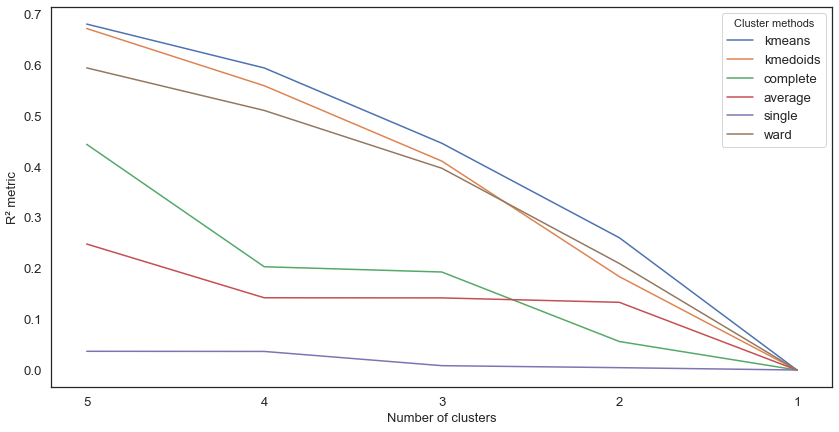

In [703]:
plot_r2_scores(df_value)

#### B) With best hierarchical linkage (Ward), plot the dendogram and chose the optimal number of clusters to use

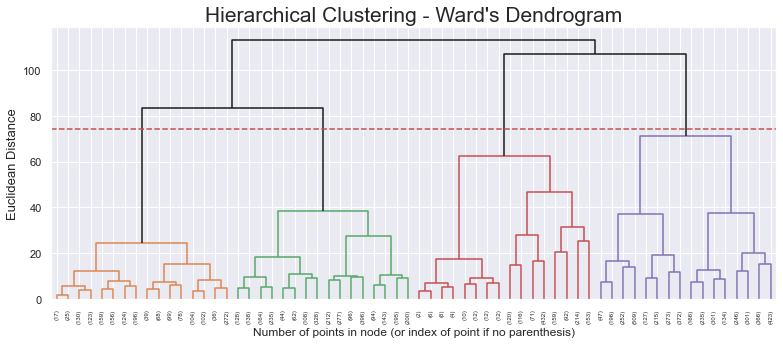

In [704]:
# Setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage='ward'
distance='euclidean' 

hierarc_value = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hierarc_value.fit_predict(df_value)
dendogram(hierarc_value, 74)

#### C) Create a hierarchical clustering algorithm and compare the mean values of the variables

In [705]:
# 4 cluster solution
hierarc_value_4 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=4)
hierarc_value_4_labels = hierarc_value_4.fit_predict(df_value)

# Characterizing the 4 clusters
hierarc_value_4 = pd.concat((df_value, pd.Series(hierarc_value_4_labels, name='hierarc_labels')), axis=1)
hierarc_value_4.groupby('hierarc_labels').mean().round(4)

,Client_Recency,SalarySpent_Ratio,ClaimsRate
hierarc_labels,,,
0,0.1737,-0.3106,-0.8759
1,-0.7846,-0.2774,0.7224
2,-0.1579,1.8351,-0.0653
3,0.9919,-0.3103,0.9852


In [706]:
# 3 cluster solution
hierarc_value_3 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
hierarc_value_3_labels = hierarc_value_3.fit_predict(df_value)

# Characterizing the 3 clusters
hierarc_value_3 = pd.concat((df_value, pd.Series(hierarc_value_3_labels, name='hierarc_labels')), axis=1)
hierarc_value_3.groupby('hierarc_labels').mean().round(4)

,Client_Recency,SalarySpent_Ratio,ClaimsRate
hierarc_labels,,,
0,-0.1096,-0.2899,0.8222
1,0.1737,-0.3106,-0.8759
2,-0.1579,1.8351,-0.0653


In [707]:
# Best solution --> 4 clusters !!

r2_hierarc_value = round(r2(df_value, hierarc_value_4_labels),4)
silhouette_hierarc_value = round(silhouette(df_value, hierarc_value_4_labels),4)
print(f'R2 score : {r2_hierarc_value}')
print(f'Silhouette score : {silhouette_hierarc_value}')

hierarc_value_results = pd.DataFrame((np.array([('Hierarchical',4, r2_hierarc_value, 
                                                silhouette_hierarc_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = hierarc_value_results

R2 score : 0.5106
Silhouette score : 0.2631


#### D) Plot the histograms for the different clusters obtained

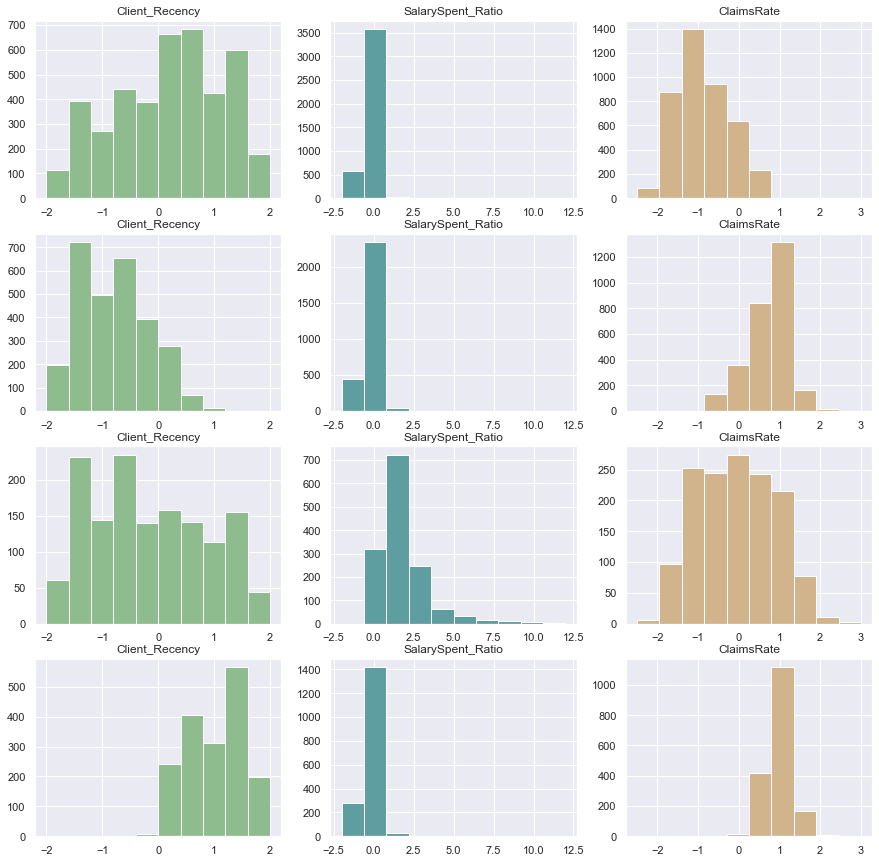

In [708]:
labels = 'hierarc_labels'
df = hierarc_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="kmeans_value">

### 12.1.2 K-Means/K-Medoids Algorithm
</a>

#### A) Chose best partitioning method to use based on the R2 (done above)

#### B) With best partitioning method (Kmeans), plot the Inertia values and the silhouette scores

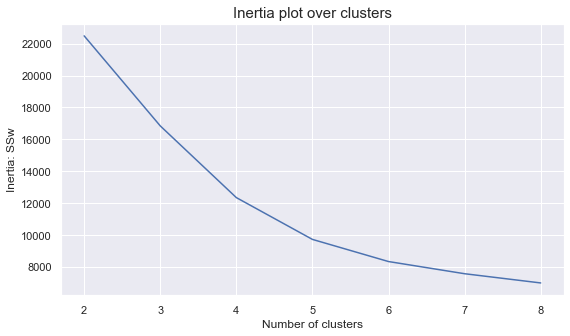

In [709]:
init = 'k-means++' 
n_init = 15
random_state=10

# Call function inertia_over_clusters
inertia_over_clusters(method='Kmeans', df=df_value, init=init, n_init=n_init, random_state=random_state)

In [710]:
# Choose 4 clusters ??

For n_clusters = 2, the average silhouette_score is : 0.2999571946002421
For n_clusters = 3, the average silhouette_score is : 0.327657127349496
For n_clusters = 4, the average silhouette_score is : 0.3379283164693607
For n_clusters = 5, the average silhouette_score is : 0.35061105187498576
For n_clusters = 6, the average silhouette_score is : 0.3580421062277239


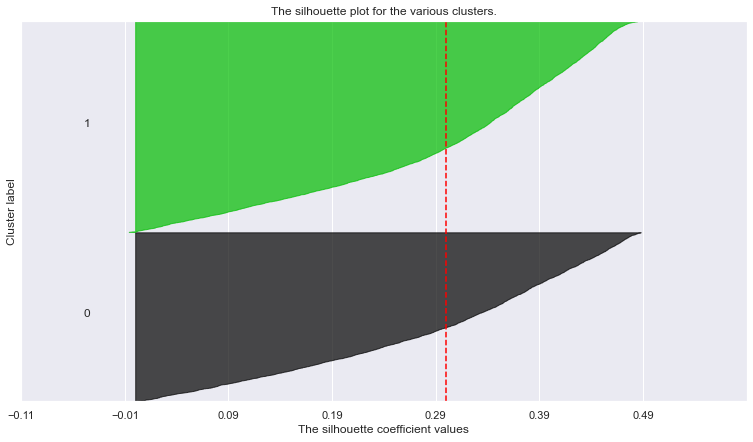

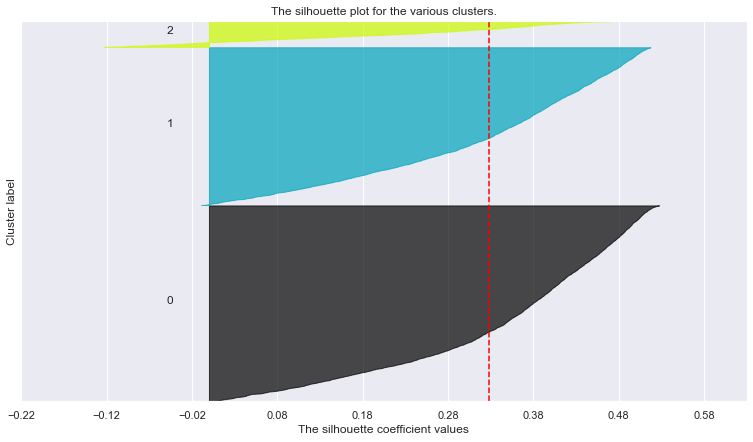

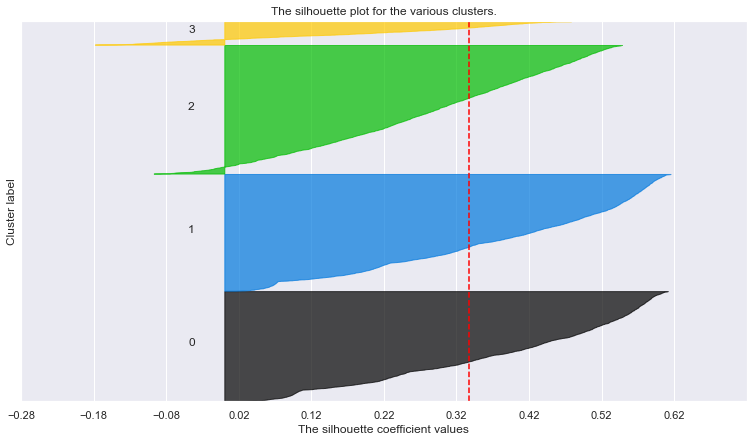

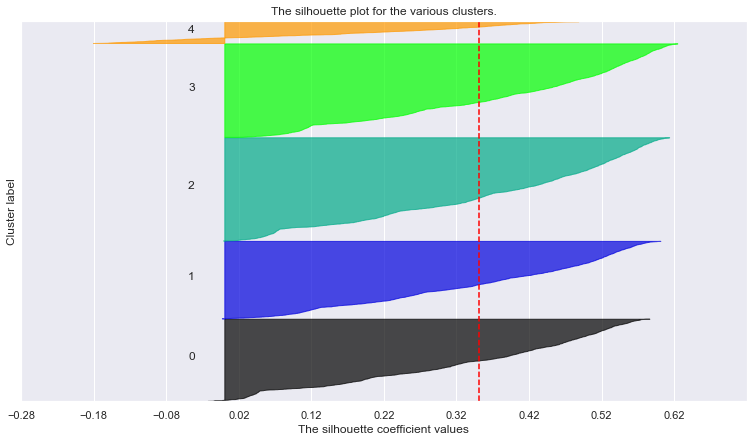

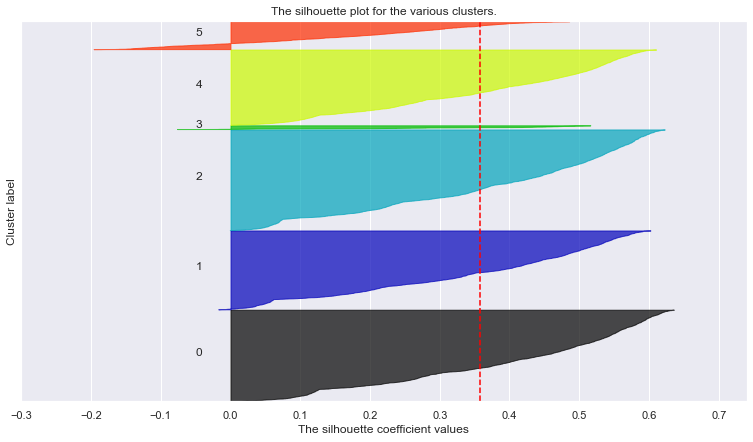

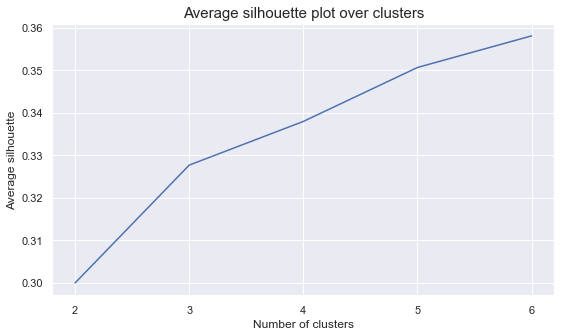

In [711]:
# Call the function created above to plot the silhouttes for each number of clusters
silhouette_plots(method='Kmeans', df=df_value)

In [712]:
# Analyse the graphics:
#    Red dashed line represents the average silhouette score
#    As n_clusters increase there are more negative silhouette values (observations that are closer to other clusters)
#    As n_clusters increase --> more condensed clusters
#    See the maximum silhouette_score --> n_clusters = 4 or 5 ??

In [713]:
# 4 clusters solution
kmeans_value_4 = KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
kmeans_value_4_labels = kmeans_value_4.fit_predict(df_value)

unique, counts = np.unique(kmeans_value_4_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_value_4 = pd.concat((df_value, pd.Series(kmeans_value_4_labels, name='kmeans_labels')), axis=1)
kmeans_value_4.groupby('kmeans_labels').mean()

{0: 2940, 1: 3125, 2: 3442, 3: 627}


,Client_Recency,SalarySpent_Ratio,ClaimsRate
kmeans_labels,,,
0,0.970794,-0.184010,0.618141
1,-0.865741,-0.198235,0.655278
2,-0.046508,-0.213068,-1.127914
3,0.018160,3.020497,0.027435


In [714]:
# 5 clusters solution
number_clusters = 5

kmeans_value_5 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
kmeans_value_5_labels = kmeans_value_5.fit_predict(df_value)

unique, counts = np.unique(kmeans_value_5_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_value_5 = pd.concat((df_value, pd.Series(kmeans_value_5_labels, name='kmeans_labels')), axis=1)
kmeans_value_5.groupby('kmeans_labels').mean()

{0: 2505, 1: 2075, 2: 2766, 3: 2203, 4: 585}


,Client_Recency,SalarySpent_Ratio,ClaimsRate
kmeans_labels,,,
0,0.933443,-0.186821,0.798667
1,-0.911218,-0.189309,-0.980591
2,-0.810518,-0.204794,0.786949
3,0.818278,-0.179335,-0.989461
4,-0.014141,3.115110,0.063497


In [715]:
# Best solution --> 4 clusters !!

r2_kmeans_value = round(r2(df_value, kmeans_value_4_labels),4)
silhouette_kmeans_value = round(silhouette(df_value, kmeans_value_4_labels),4)

print(f'R2 score : {r2_kmeans_value}')
print(f'Silhouette score : {silhouette_kmeans_value}')

kmeans_value_results = pd.DataFrame((np.array([('K-means',4, 
                                r2_kmeans_value, silhouette_kmeans_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, kmeans_value_results))

R2 score : 0.5942
Silhouette score : 0.3379


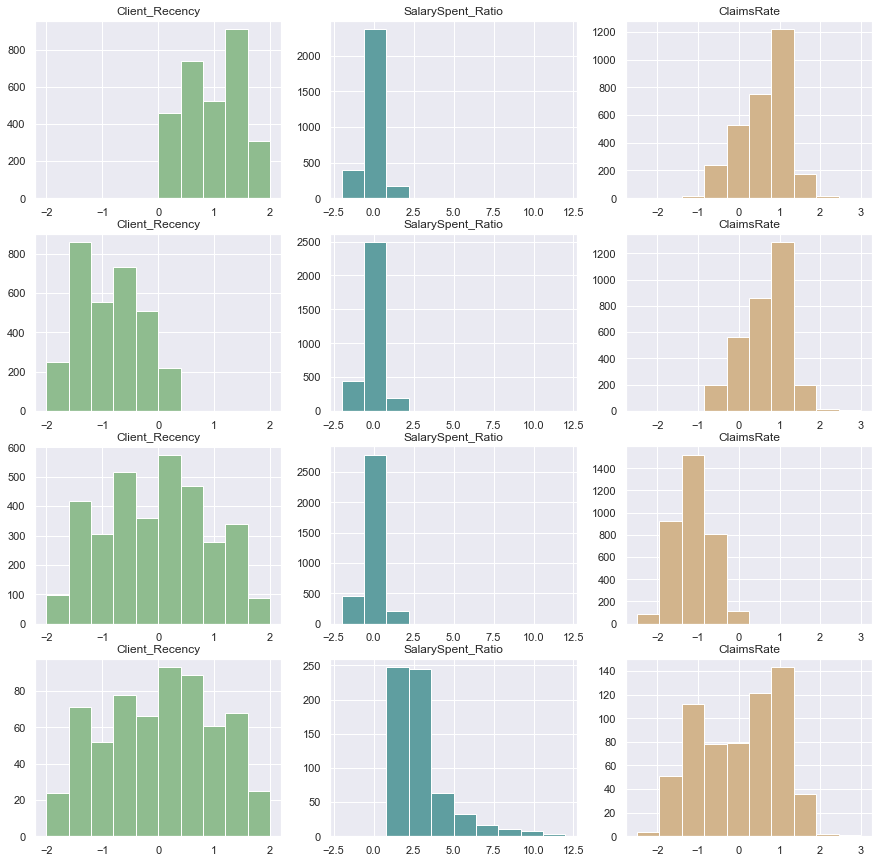

In [716]:
labels = 'kmeans_labels'
df = kmeans_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="som_hierarc_value">

### 12.1.3 Hierachical on SOM Units
</a>

#### Perform a SOM Algorithm

In [717]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
som_value = sompy.SOMFactory().build(
        df_value.values, 
        mapsize=[25, 25],  # HOW MANY UNITS TO USE ???
        initialization='random',
        neighborhood='gaussian',
        training='batch',
        lattice='hexa',
        normalization=False,
        component_names=df_value.columns
)
som_value.train(n_job=-1, verbose='info', train_rough_len=125, train_finetune_len=110)  ## TUNE THESE PARAMETERS !!!

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 9.000000 , radius_final: 1.500000, trainlen: 125

 epoch: 1 ---> elapsed time:  0.058000, quantization error: 0.395729

 epoch: 2 ---> elapsed time:  0.056000, quantization error: 1.544356

 epoch: 3 ---> elapsed time:  0.058000, quantization error: 1.491640

 epoch: 4 ---> elapsed time:  0.057000, quantization error: 1.476284

 epoch: 5 ---> elapsed time:  0.058000, quantization error: 1.469171

 epoch: 6 ---> elapsed time:  0.057000, quantization error: 1.465724

 epoch: 7 ---> elapsed time:  0.056000, quantization error: 1.463301

 epoch: 8 ---> elapsed time:  0.055000, quantization error: 1.461167

 epoch: 9 ---> elapsed time:  0.056000, quantization error: 1.459511

 epoch: 10 ---> elapsed time:  0.056000, quantization error: 1.457929

 epoch: 11 ---> elapsed time:  0.056000, quantization error: 1.456333

 epoch: 12 ---> elapsed time:  0.056000, quantization error: 1.454786

 epoch: 13 ---> 

 epoch: 115 ---> elapsed time:  0.055000, quantization error: 0.705897

 epoch: 116 ---> elapsed time:  0.054000, quantization error: 0.684631

 epoch: 117 ---> elapsed time:  0.054000, quantization error: 0.664609

 epoch: 118 ---> elapsed time:  0.053000, quantization error: 0.644994

 epoch: 119 ---> elapsed time:  0.055000, quantization error: 0.625661

 epoch: 120 ---> elapsed time:  0.054000, quantization error: 0.606654

 epoch: 121 ---> elapsed time:  0.055000, quantization error: 0.587649

 epoch: 122 ---> elapsed time:  0.055000, quantization error: 0.568491

 epoch: 123 ---> elapsed time:  0.055000, quantization error: 0.548641

 epoch: 124 ---> elapsed time:  0.056000, quantization error: 0.527472

 epoch: 125 ---> elapsed time:  0.056000, quantization error: 0.505219

 Finetune training...
 radius_ini: 2.083333 , radius_final: 1.000000, trainlen: 110

 epoch: 1 ---> elapsed time:  0.054000, quantization error: 0.482652

 epoch: 2 ---> elapsed time:  0.054000, quantization 

 epoch: 105 ---> elapsed time:  0.056000, quantization error: 0.313867

 epoch: 106 ---> elapsed time:  0.056000, quantization error: 0.310523

 epoch: 107 ---> elapsed time:  0.055000, quantization error: 0.307151

 epoch: 108 ---> elapsed time:  0.058000, quantization error: 0.303704

 epoch: 109 ---> elapsed time:  0.059000, quantization error: 0.300123

 epoch: 110 ---> elapsed time:  0.056000, quantization error: 0.296532

 Final quantization error: 0.293000
 train took: 13.330000 seconds


#### Visualize the Component Planes

C:\Users\tsoom\anaconda3\lib\site-packages\sompy\visualization\plot_tools.py:45: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



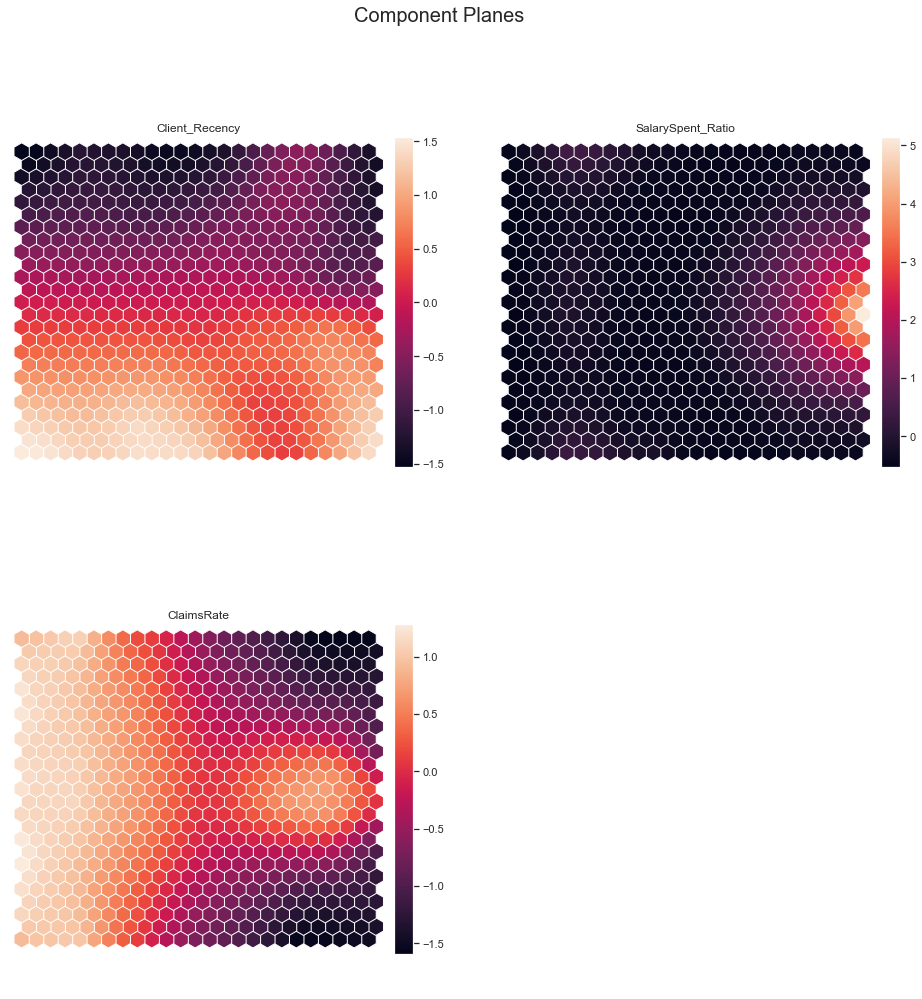

In [718]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)

view2D.show(som_value, col_sz=2, what='codebook')

plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

#### Visualize the U-Matrix

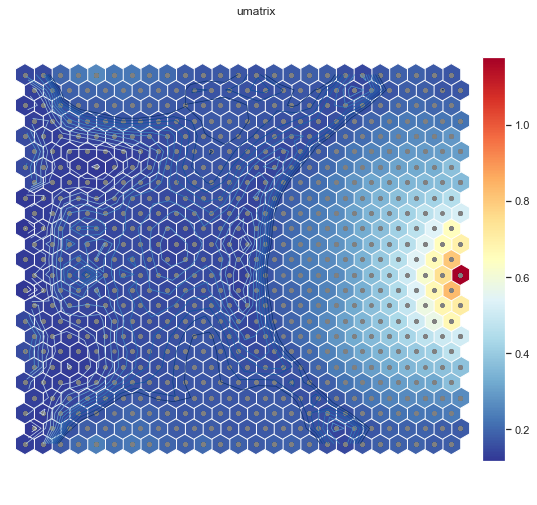

In [719]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    som_value, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

# np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

#### Visualize the Hit Map

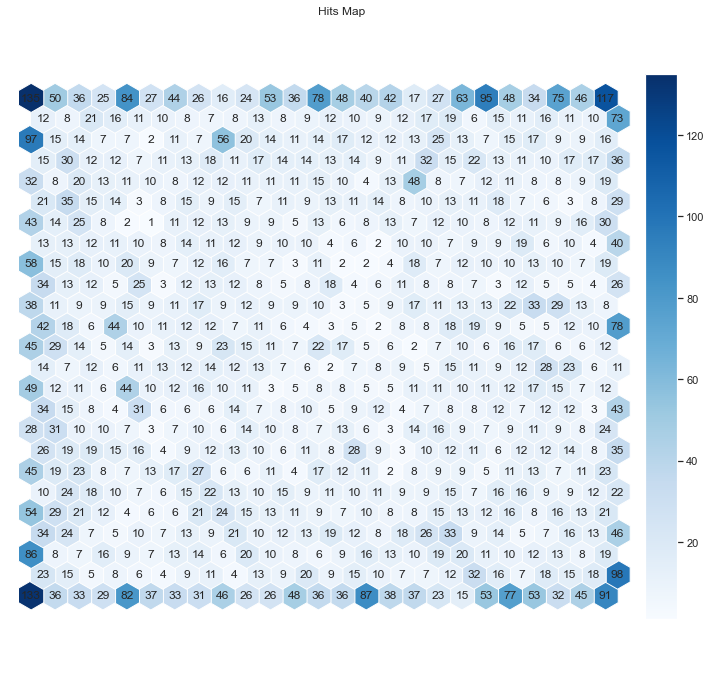

In [720]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(som_value, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

#### Apply Hierarchical Clustering on the SOM Units

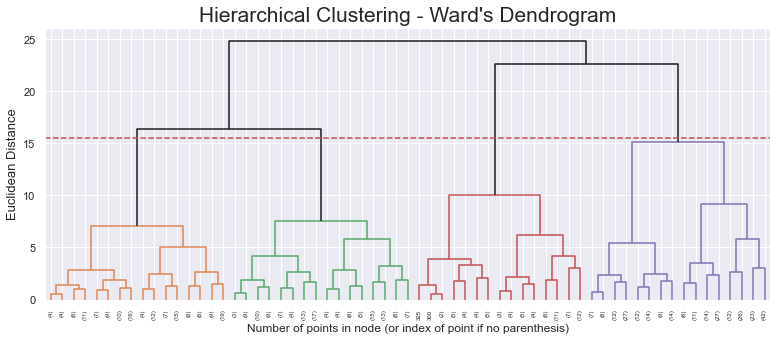

In [721]:
# Define units
units = som_value.codebook.matrix

# Setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage='ward'
distance='euclidean' 

hierarc_som_value = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hierarc_som_value.fit_predict(units)
dendogram(hierarc_som_value,15.5)

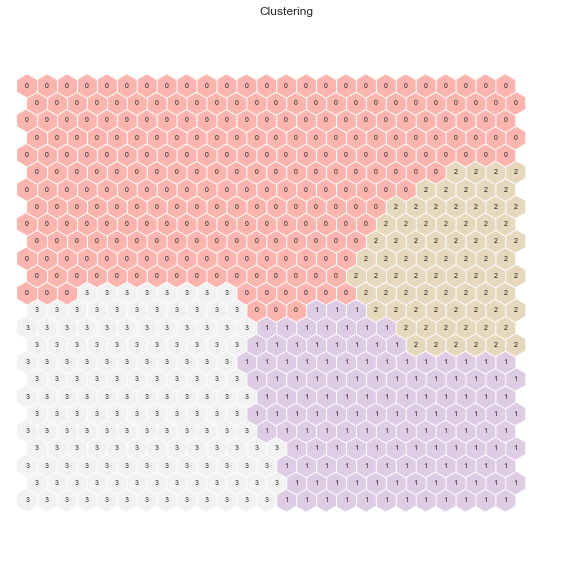

In [722]:
# 4 clusters solution
hierarc_som_value_4 = AgglomerativeClustering(n_clusters=4, linkage=linkage, affinity=distance)
hierarc_som_value_4_labels = hierarc_som_value_4.fit_predict(units)

som_value.cluster_labels = hierarc_som_value_4_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering",text_size=10)
hits.show(som_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

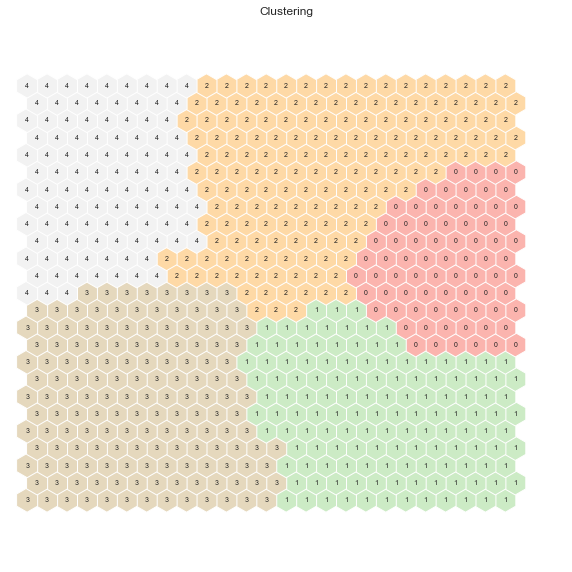

In [723]:
# 5 clusters solution
hierarc_som_value_5 = AgglomerativeClustering(n_clusters=5, linkage=linkage, affinity=distance)
hierarc_som_value_5_labels = hierarc_som_value_5.fit_predict(units)

som_value.cluster_labels = hierarc_som_value_5_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering",text_size=10)
hits.show(som_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [724]:
# Best solution --> 4 clusters !! 
df_value_units = pd.DataFrame(units, columns=df_value.columns)
df_value_units['hierarc_som_labels'] = hierarc_som_value_4_labels

# Obtaining SOM's BMUs labels
bmus_map = som_value.find_bmu(df_value)[0]  # get bmus for each observation in df_value

df_value_bmus = pd.DataFrame(
    np.concatenate((df_value, np.expand_dims(bmus_map,1)), axis=1),
    index=df_value.index, columns=np.append(df_value.columns,"BMU"))

# Get cluster labels for each observation
hierarc_som_value_4 = df_value_bmus.merge(df_value_units['hierarc_som_labels'], 'left', left_on="BMU", right_index=True)
hierarc_som_value_4.drop(columns='BMU', inplace=True)
hierarc_som_value_4.groupby('hierarc_som_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
hierarc_som_labels,,,
0,0.861398,-0.292311,-0.009393
1,-0.813916,-0.126032,-0.925264
2,0.235068,2.203536,0.105600
3,-0.937168,-0.283632,0.761275


In [725]:
# Best solution --> 4 clusters !!
hierarc_som_value_4_labels = hierarc_som_value_4['hierarc_som_labels']

r2_hierarc_som_value = round(r2(df_value, hierarc_som_value_4_labels),4)
silhouette_hierarc_som_value = round(silhouette(df_value, hierarc_som_value_4_labels),4)

print(f'R2 score : {r2_hierarc_som_value}')
print(f'Silhouette score : {silhouette_hierarc_som_value}')

hierarc_som_value_results = pd.DataFrame((np.array([('Hierarchical with SOM',4, 
                                r2_hierarc_som_value, silhouette_hierarc_som_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, hierarc_som_value_results))

R2 score : 0.5236
Silhouette score : 0.2726


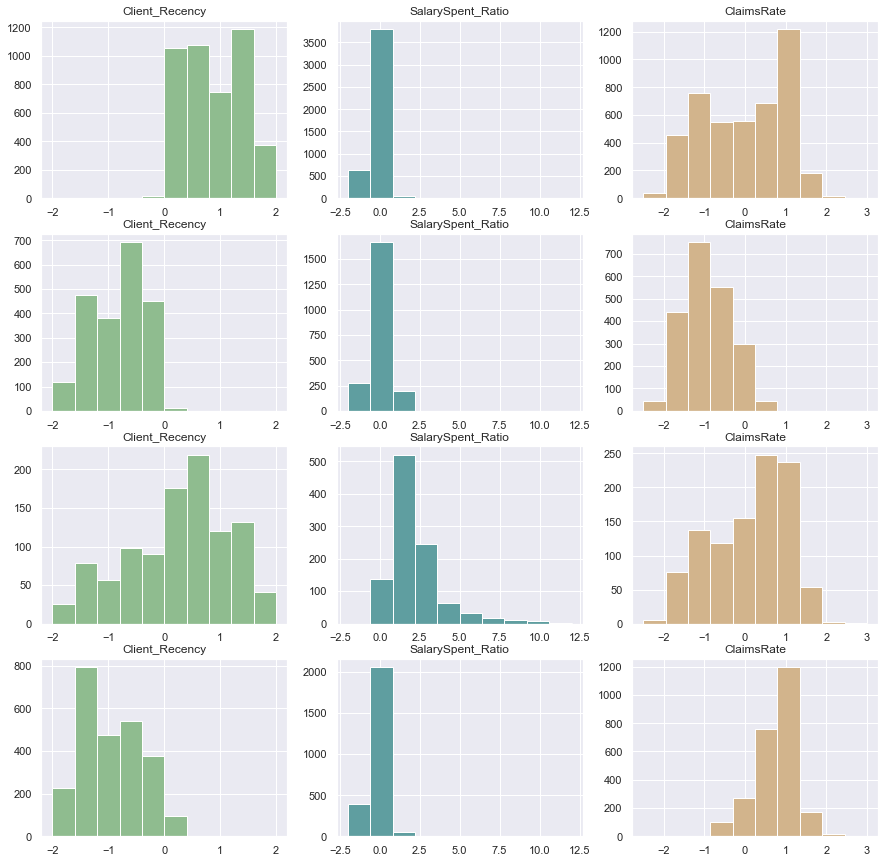

In [726]:
labels = 'hierarc_som_labels'
df = hierarc_som_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="som_kmeans_value">

### 12.1.4 K-Means/K-Medoids on SOM Units
</a>

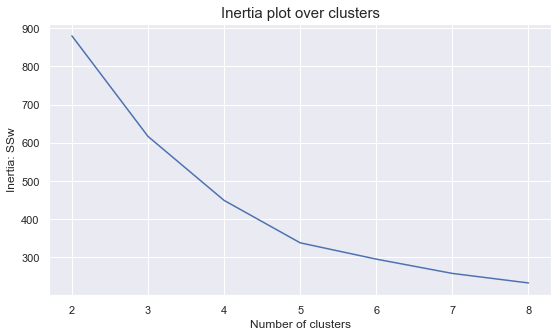

In [727]:
init = 'k-means++'
n_init = 15
random_state=10

# Call function inertia_over_clusters
inertia_over_clusters(method='Kmeans', df=units, init=init, n_init=n_init, random_state=random_state)

For n_clusters = 2, the average silhouette_score is : 0.2877556985403334
For n_clusters = 3, the average silhouette_score is : 0.3333287676575087
For n_clusters = 4, the average silhouette_score is : 0.33895935074582667
For n_clusters = 5, the average silhouette_score is : 0.36404442160365125
For n_clusters = 6, the average silhouette_score is : 0.35292177443697764


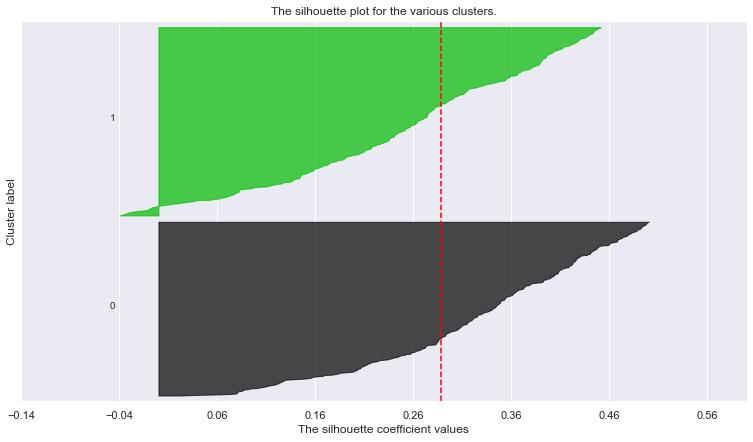

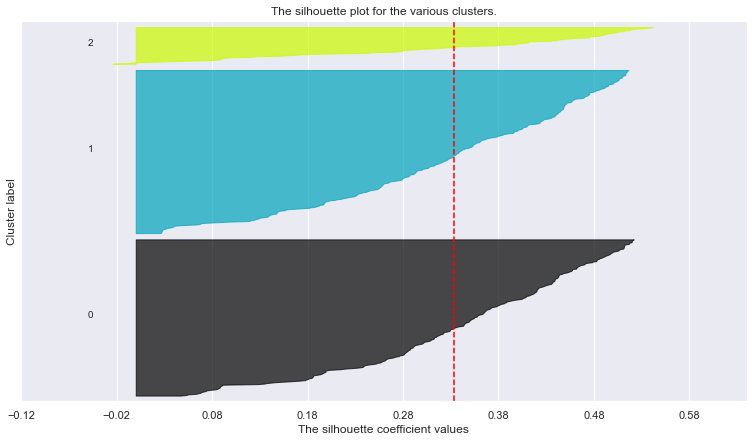

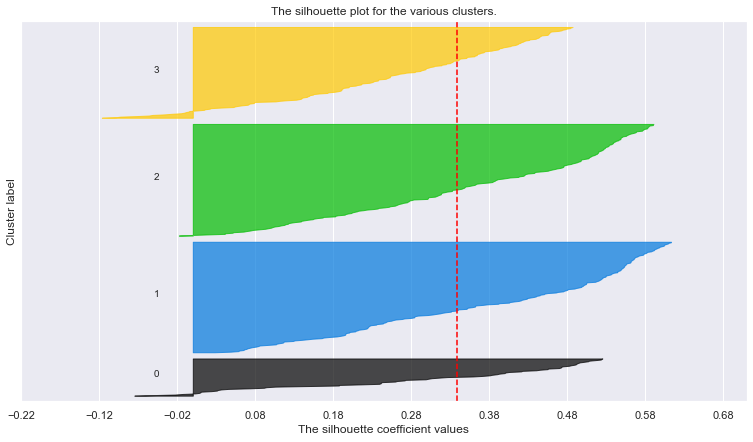

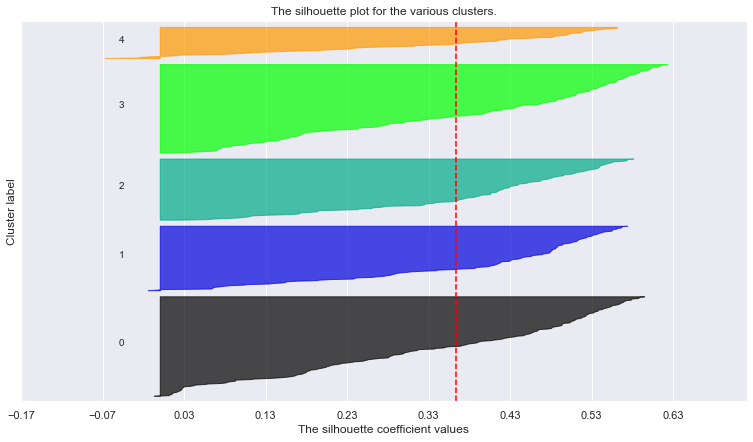

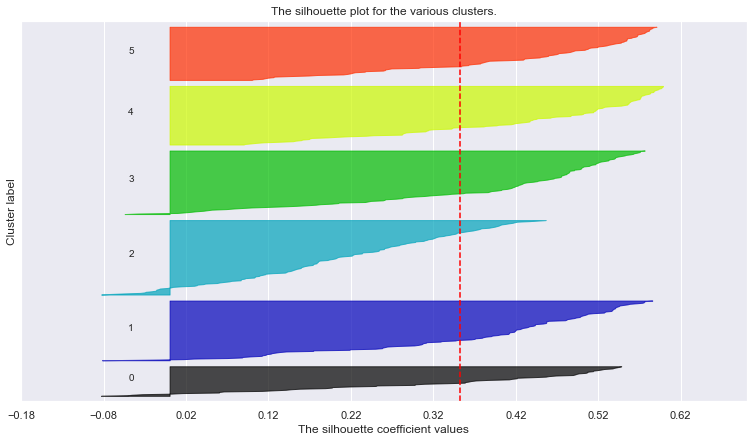

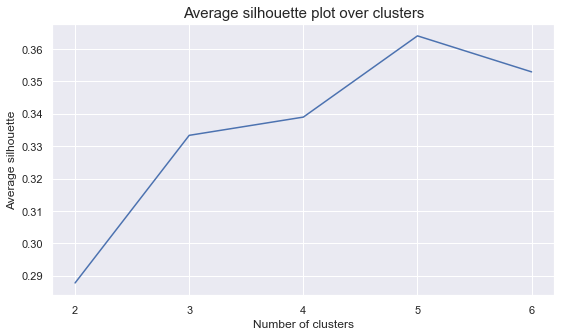

In [728]:
# Call the function created above to plot the silhouttes for each number of clusters
silhouette_plots(method='Kmeans', df=units)

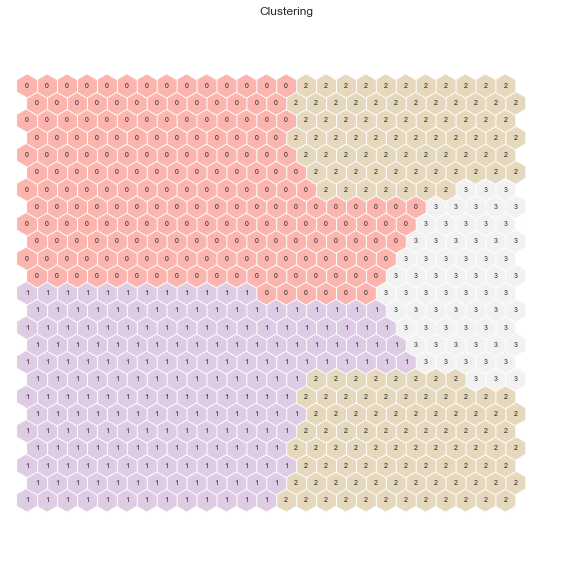

In [729]:
# 4 clusters solution
kmeans_som_value_4 = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=10)
kmeans_som_value_4_labels = kmeans_som_value_4.fit_predict(units)
som_value.cluster_labels = kmeans_som_value_4_labels  # setting the cluster labels of sompy

hits = HitMapView(10, 10,"Clustering", text_size=10)
hits.show(som_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

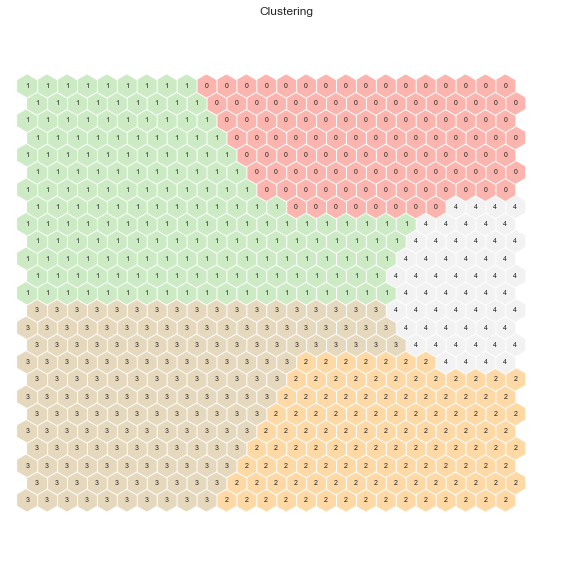

In [730]:
# 5 clusters solution
kmeans_som_value_5 = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=10)
kmeans_som_value_5_labels = kmeans_som_value_5.fit_predict(som_value.codebook.matrix)

som_value.cluster_labels = kmeans_som_value_5_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering", text_size=10)
hits.show(som_value, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [731]:
# Best solution --> 4 clusters !!
df_value_units = pd.DataFrame(units, columns=df_value.columns)
df_value_units['kmeans_som_labels'] = kmeans_som_value_4_labels

# Obtaining SOM's BMUs labels
bmus_map = som_value.find_bmu(df_value)[0]  # get bmus for each observation in df_value

df_value_bmus = pd.DataFrame(
    np.concatenate((df_value, np.expand_dims(bmus_map,1)), axis=1),
    index=df_value.index, columns=np.append(df_value.columns,"BMU"))

# Get cluster labels for each observation
kmeans_som_value_4 = df_value_bmus.merge(df_value_units['kmeans_som_labels'], 'left', left_on="BMU", right_index=True)
kmeans_som_value_4.drop(columns='BMU', inplace=True)
kmeans_som_value_4.groupby('kmeans_som_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
kmeans_som_labels,,,
0,0.947120,-0.252230,0.547375
1,-0.844428,-0.269874,0.673565
2,-0.111420,-0.231389,-1.168548
3,0.021281,2.401894,0.048744


In [732]:
# Best solution --> 4 clusters !!
kmeans_som_value_4_labels = kmeans_som_value_4['kmeans_som_labels']

r2_kmeans_som_value = round(r2(df_value, kmeans_som_value_4_labels),4)
silhouette_kmeans_som_value = round(silhouette(df_value, kmeans_som_value_4_labels),4)

print(f'R2 score : {r2_kmeans_som_value}')
print(f'Silhouette score : {silhouette_kmeans_som_value}')

kmeans_som_value_results = pd.DataFrame((np.array([('K-means with SOM',4, 
                                r2_kmeans_som_value, silhouette_kmeans_som_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, kmeans_som_value_results))

R2 score : 0.5781
Silhouette score : 0.3252


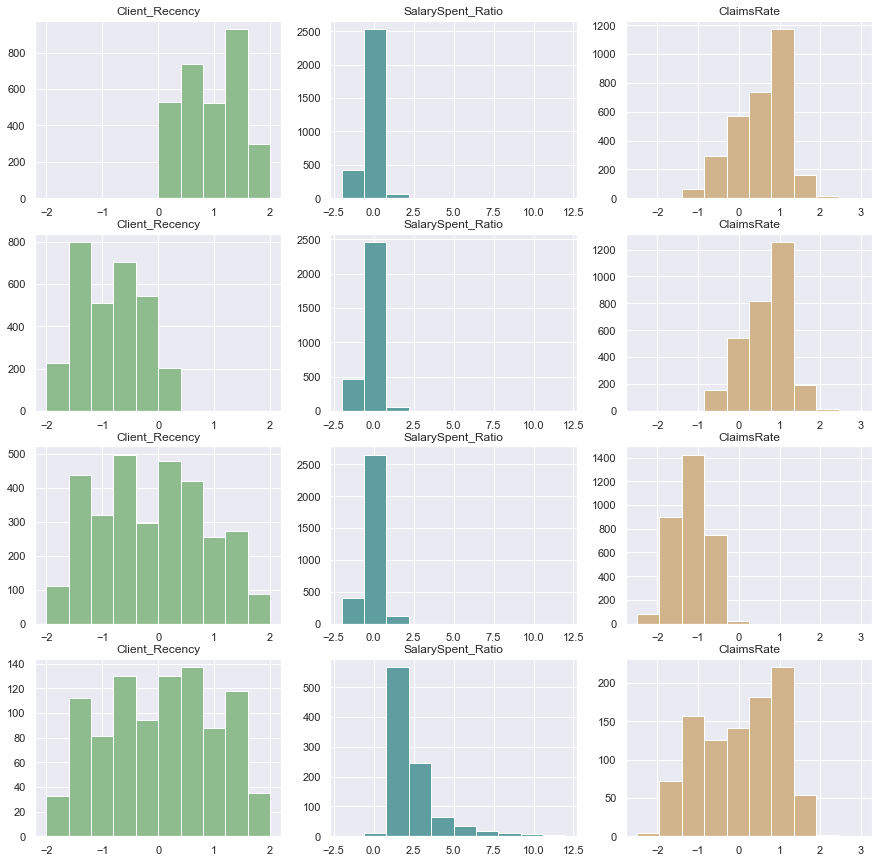

In [733]:
labels = 'kmeans_som_labels'
df = kmeans_som_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="dbscan_value">

### 12.1.5 DBSCAN
</a>

In [734]:
dbscan_value = DBSCAN(eps=0.43, min_samples=7, n_jobs=-1) # TUNE THESE PARAMETERS !!!
dbscan_value_labels = dbscan_value.fit_predict(df_value)

dbscan_value_n_clusters = len(np.unique(dbscan_value_labels))
print("Number of estimated clusters : %d" % dbscan_value_n_clusters)

Number of estimated clusters : 4


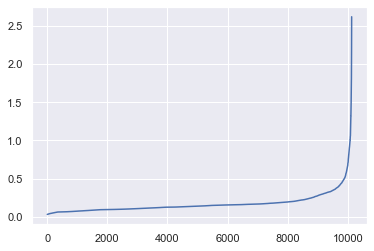

In [735]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=7)
neigh.fit(df_value)
distances, _ = neigh.kneighbors(df_value)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [736]:
# Concatenating the labels to df
dbscan_value_3 = pd.concat([df_value, pd.Series(dbscan_value_labels, index=df_value.index, name="dbscan_labels")], axis=1)
dbscan_value_3.groupby('dbscan_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
dbscan_labels,,,
-1,0.036434,4.250216,-0.031651
0,-0.001305,-0.095478,-0.000815
1,0.223214,3.140360,0.791869
2,0.413984,3.914678,0.849152


In [737]:
# Detecting noise (potential outliers)
dbscan_value_3.loc[dbscan_value_3['dbscan_labels'] == -1]

,Client_Recency,SalarySpent_Ratio,ClaimsRate,dbscan_labels
106,-0.754236,3.957284,0.786141,-1
220,0.760123,0.383222,-2.143911,-1
250,-0.754236,9.936696,-1.482287,-1
258,-1.662851,2.830866,-2.143911,-1
388,0.002944,5.040101,1.699813,-1
...,...,...,...,...
9925,-0.754236,2.839162,-0.726144,-1
9997,-0.451364,8.912027,1.479271,-1
10020,1.214431,3.820547,-1.356263,-1
10081,-1.208543,5.004176,0.534093,-1


In [738]:
# Computing the R^2 of the cluster solution
df_nonoise = dbscan_value_3.loc[dbscan_value_3['dbscan_labels'] != -1]

sst = get_ss(df_value)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2_dbscan_value = round(ssb / sst, 4)

silhouette_dbscan_value = round(silhouette(df_value, dbscan_value_labels),3)

print(f'R2 score : {r2_dbscan_value}')
print(f'Silhouette score : {silhouette_dbscan_value}')

dbscan_value_results = pd.DataFrame((np.array([('DBSCAN',3, 
                                r2_dbscan_value, silhouette_dbscan_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, dbscan_value_results))

R2 score : 0.2012
Silhouette score : 0.404


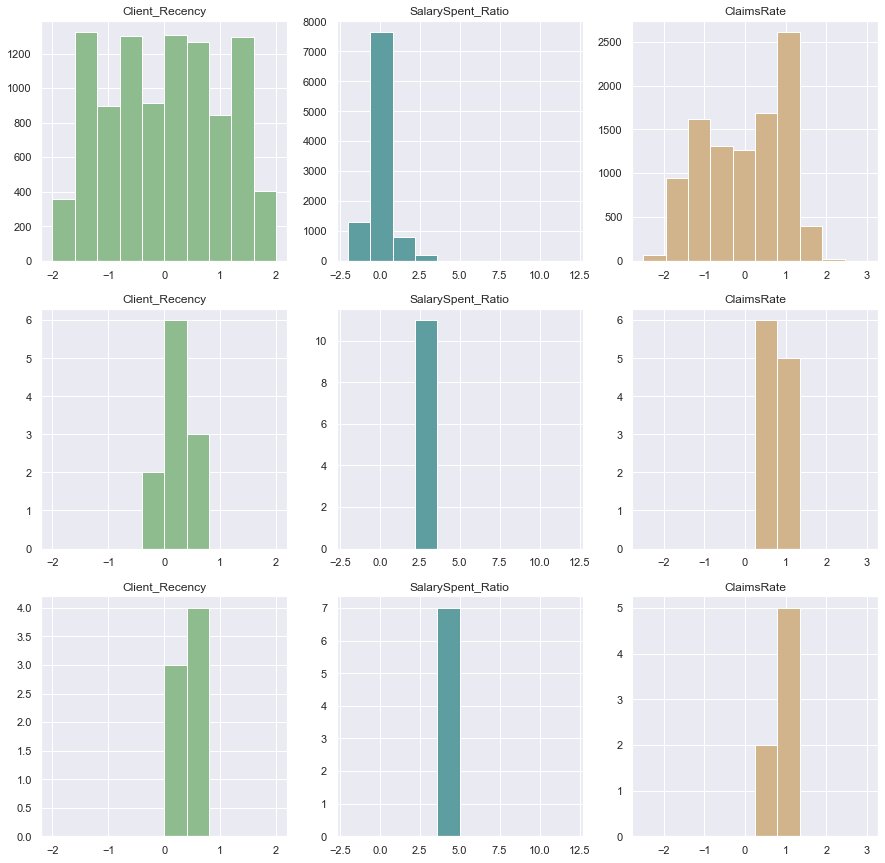

In [739]:
labels = 'dbscan_labels'
df = dbscan_value_3
features = df.columns

n_clusters = 3
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="mean_shift_value">

### 12.1.6 Mean Shift Clustering 
</a>

In [740]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# for i in np.arange(0.05,0.1,0.002):
# print(i)

bandwidth = estimate_bandwidth(df_value, quantile=0.33, random_state=1, n_jobs=-1) 
print(f'Bandwith estimated: {round(bandwidth,4)}')  # reduce quantile to have more than one clusters


# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
mean_shift_value = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
mean_shift_value_labels = mean_shift_value.fit_predict(df_value)

mean_shift_value_n_clusters = len(np.unique(mean_shift_value_labels))
print(f"Number of estimated clusters : {mean_shift_value_n_clusters}")

Bandwith estimated: 1.7369
Number of estimated clusters : 4


In [741]:
# Concatenating the labels to df
mean_shift_value_4 = pd.concat([df_value, pd.Series(mean_shift_value_labels, index=df_value.index, name="mean_shift_labels")],axis=1)
mean_shift_value_4.groupby('mean_shift_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
mean_shift_labels,,,
0,-0.000481,-0.061473,-0.000682
1,0.173527,6.042211,0.110030
2,-1.158065,8.836219,-0.383080
3,0.154380,11.802954,0.723129


In [742]:
# Best solution --> 4 clusters !!
r2_mean_shift_value = round(r2(df_value, mean_shift_value_labels),4)
silhouette_mean_shift_value = round(silhouette(df_value, mean_shift_value_labels),4)

print(f'R2 score : {r2_mean_shift_value}')
print(f'Silhouette score : {silhouette_mean_shift_value}')

mean_shift_value_results = pd.DataFrame((np.array([('Mean Shift',4, 
                                r2_mean_shift_value, silhouette_mean_shift_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, mean_shift_value_results))

R2 score : 0.134
Silhouette score : 0.6631


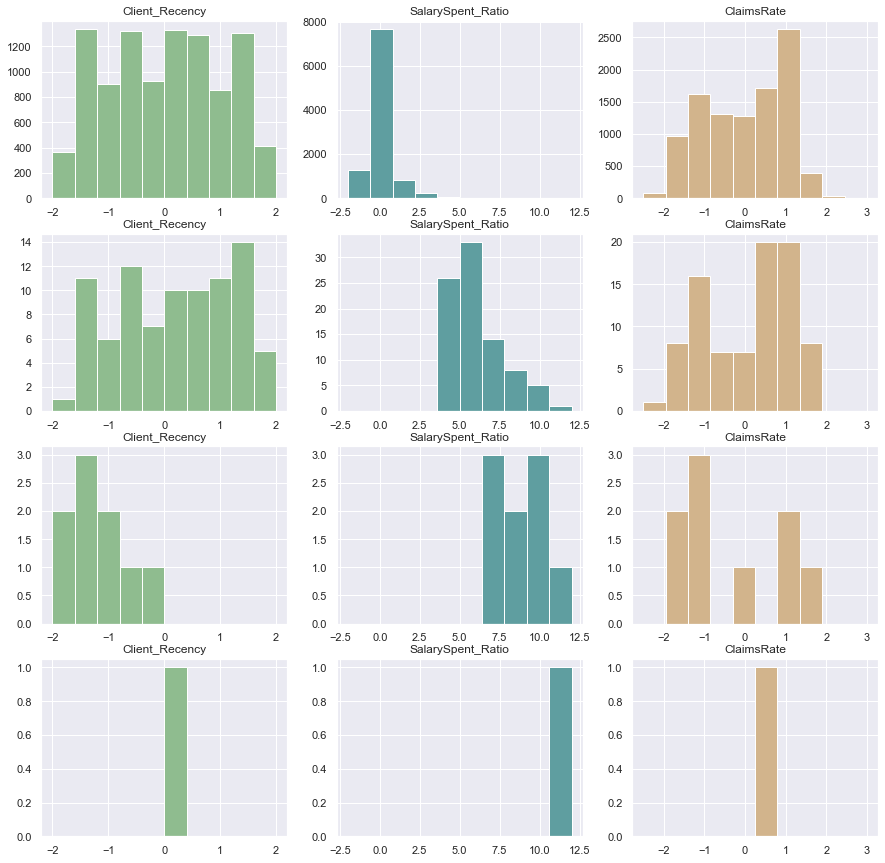

In [743]:
labels = 'mean_shift_labels'
df = mean_shift_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="gaussian_value">

### 12.1.7 Gaussian Mixture Model
</a>

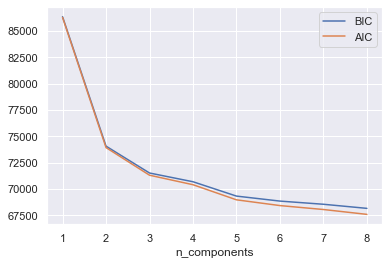

In [744]:
#Defining Covariance type: diag, spherical, full, tied
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 9)
models = [GaussianMixture(n, covariance_type='full', init_params='kmeans', n_init=10, random_state=1).fit(df_value)
          for n in n_components]

bic_values = [m.bic(df_value) for m in models]
aic_values = [m.aic(df_value) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [745]:
# Solution with 3 clusters
gaussian_value_3 = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gaussian_value_3_labels = gaussian_value_3.fit_predict(df_value)

# Concatenating the labels to df
gaussian_value_3 = pd.concat([df_value, pd.Series(gaussian_value_3_labels, index=df_value.index, name="gaussian_labels")],axis=1)
gaussian_value_3.groupby('gaussian_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
gaussian_labels,,,
0,-0.008378,-0.362256,-0.886376
1,0.016124,-0.371004,0.895856
2,-0.013930,1.402305,0.046366


In [746]:
# Solution with 4 clusters
gaussian_value_4 = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gaussian_value_4_labels = gaussian_value_4.fit_predict(df_value)

# Concatenating the labels to df
gaussian_value_4 = pd.concat([df_value, pd.Series(gaussian_value_4_labels, index=df_value.index, name="gaussian_labels")],axis=1)
gaussian_value_4.groupby('gaussian_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate
gaussian_labels,,,
0,0.931427,-0.245301,-0.579367
1,-0.001645,-0.433584,0.965029
2,-0.106445,1.586110,0.100086
3,-0.848018,-0.318751,-0.691112


In [747]:
# Best solution --> 4 clusters !!

r2_gaussian_value = round(r2(df_value, gaussian_value_4_labels),4)
silhouette_gaussian_value = round(silhouette(df_value, gaussian_value_4_labels),4)

print(f'R2 score : {r2_gaussian_value}')
print(f'Silhouette score : {silhouette_gaussian_value}')

gaussian_value_results = pd.DataFrame((np.array([('Gaussian Mixture',4, 
                                r2_gaussian_value, silhouette_gaussian_value)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_value = pd.concat((final_results_value, gaussian_value_results))

R2 score : 0.4839
Silhouette score : 0.2406


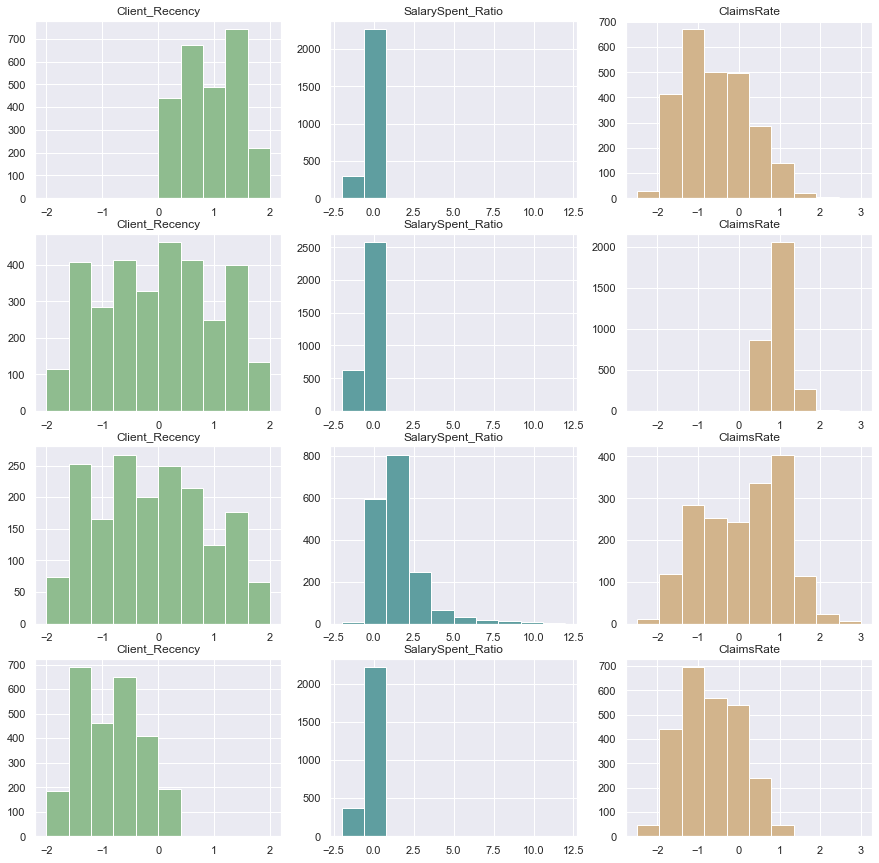

In [748]:
labels = 'gaussian_labels'
df = gaussian_value_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2,2]
range_axis2 = [-2, 12]
range_axis3 = [-2.5, 3]

profiling_for_value(labels, df, features, n_clusters, n_features, range_axis1, range_axis2, range_axis3)

<a class="anchor" id="best_cluster_value">

### 12.1.8 Choose Best Solution
</a>

In [749]:
final_results_value #value_df4

,Method,Clusters,R*2,Silhouette
0,Hierarchical,4,0.5106,0.2631
0,K-means,4,0.5942,0.3379
0,Hierarchical with SOM,4,0.5236,0.2726
0,K-means with SOM,4,0.5781,0.3252
0,DBSCAN,3,0.2012,0.404
0,Mean Shift,4,0.134,0.6631
0,Gaussian Mixture,4,0.4839,0.2406


In [750]:
############################################################################################################################
############################################################################################################################
############################################################################################################################

<a class="anchor" id="products_df">

### 12.2. Clustering on Products Segementation
</a>

In [751]:
# products_df = insur[['PremMotor', 'PremHealth', 'PremLife_sqrt', 'PremWork_sqrt', 'PremHousehold_sqrt']]
# # display(products_df.head(3))

# products_df2 = insur[['PremMotor', 'PremHealth', 'PremLife_sqrt', 'PremWork_sqrt', 'Total_Premiums']]
# # display(products_df2.head(3))

# products_df3 = insur[['PremMotor_Ratio', 'PremHealth_Ratio', 'PremLife_Ratio_sqrt', \
#                       'PremWork_Ratio_sqrt', 'PremHousehold_Ratio_sqrt']]
# # display(products_df3.head(3))

# products_df4 = insur[['PremMotor_Ratio', 'PremHealth_Ratio', 'PremLife_Ratio_sqrt', \
#                       'PremWork_Ratio_sqrt', 'Total_Premiums']]
# # display(products_df4.head(3))


In [752]:
df_products = products_df

<a class="anchor" id="hierarchical">

### 12.2.1 Hierarchical Clustering
</a>

####  A) Chose best hierarchical linkage and the best partitioning method (based on the R2)

,kmeans,kmedoids,complete,average,single,ward
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.408662,0.403303,0.176352,0.001385,0.000379,0.388641
3,0.540510,0.535981,0.211379,0.258397,0.000933,0.492915
4,0.599964,0.561770,0.486332,0.263397,0.001072,0.548439
5,0.634079,0.622846,0.497618,0.263676,0.001366,0.596657


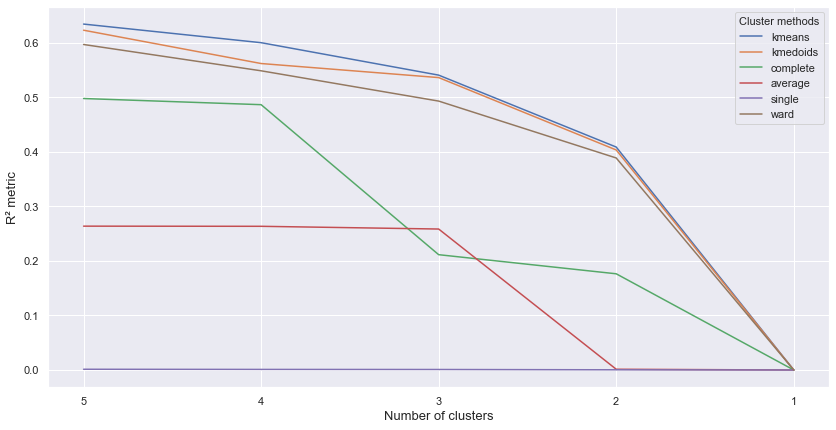

In [753]:
plot_r2_scores(df_products)

#### B) Chose optimal number of clusters to use (2 possible options)

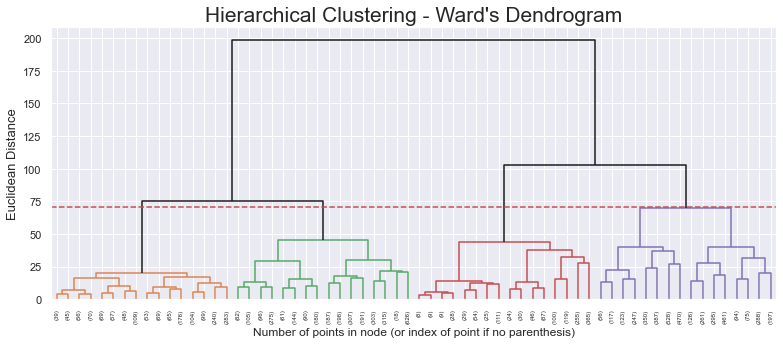

In [754]:
# Setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage='ward'
distance='euclidean'  # "euclidean", "l1", "l2", "manhattan", "cosine", or "precomputed".

hierarc_products = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hierarc_products.fit_predict(df_products)
dendogram(hierarc_products, 71)

#### C) Create a clustering algorithm and compare the mean values of the variables

In [755]:
# 4 cluster solution
hierarc_products_4 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=4)
hierarc_products_4_labels = hierarc_products_4.fit_predict(df_products)

# Characterizing the 4 clusters
hierarc_products_4 = pd.concat((df_products, pd.Series(hierarc_products_4_labels, name='hierarc_labels')), axis=1)
hierarc_products_4.groupby('hierarc_labels').mean().round(4)

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
hierarc_labels,,,,,
0,-0.5275,0.6770,0.3834,0.2436,0.2058
1,0.5466,-0.1907,-0.5618,-0.4073,-0.4344
2,-1.4432,-0.0981,1.3452,1.3972,1.4976
3,1.4458,-1.2801,-0.9636,-0.9567,-0.8871


In [756]:
# 3 cluster solution
hierarc_products_3 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=3)
hierarc_products_3_labels = hierarc_products_3.fit_predict(df_products)

# Characterizing the 3 clusters
hierarc_products_3 = pd.concat((df_products, pd.Series(hierarc_products_3_labels, name='hierarc_labels')), axis=1)
hierarc_products_3.groupby('hierarc_labels').mean().round(4)

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
hierarc_labels,,,,,
0,0.8455,-0.5528,-0.6953,-0.5899,-0.5848
1,-0.5275,0.6770,0.3834,0.2436,0.2058
2,-1.4432,-0.0981,1.3452,1.3972,1.4976


In [757]:
# 5 cluster solution
hierarc_products_5 = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=5)
hierarc_products_5_labels = hierarc_products_5.fit_predict(df_products)

# Characterizing the 3 clusters
hierarc_products_5 = pd.concat((df_products, pd.Series(hierarc_products_5_labels, name='hierarc_labels')), axis=1)
hierarc_products_5.groupby('hierarc_labels').mean().round(4)

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
hierarc_labels,,,,,
0,0.5466,-0.1907,-0.5618,-0.4073,-0.4344
1,-0.2283,-0.0653,0.7011,0.3459,0.1155
2,-1.4432,-0.0981,1.3452,1.3972,1.4976
3,1.4458,-1.2801,-0.9636,-0.9567,-0.8871
4,-0.7636,1.2625,0.1328,0.1629,0.2769


In [758]:
# Best solution --> 4 clusters !!

r2_hierarc_products = round(r2(df_products, hierarc_products_4_labels),4)
silhouette_hierarc_products = round(silhouette(df_products, hierarc_products_4_labels),4)
print(f'R2 score : {r2_hierarc_products}')
print(f'Silhouette score : {silhouette_hierarc_products}')

hierarc_products_results = pd.DataFrame((np.array([('Hierarchical',4, r2_hierarc_products, 
                                                silhouette_hierarc_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = hierarc_products_results

R2 score : 0.5484
Silhouette score : 0.1764


#### D) Plot the histograms for the different clusters obtained

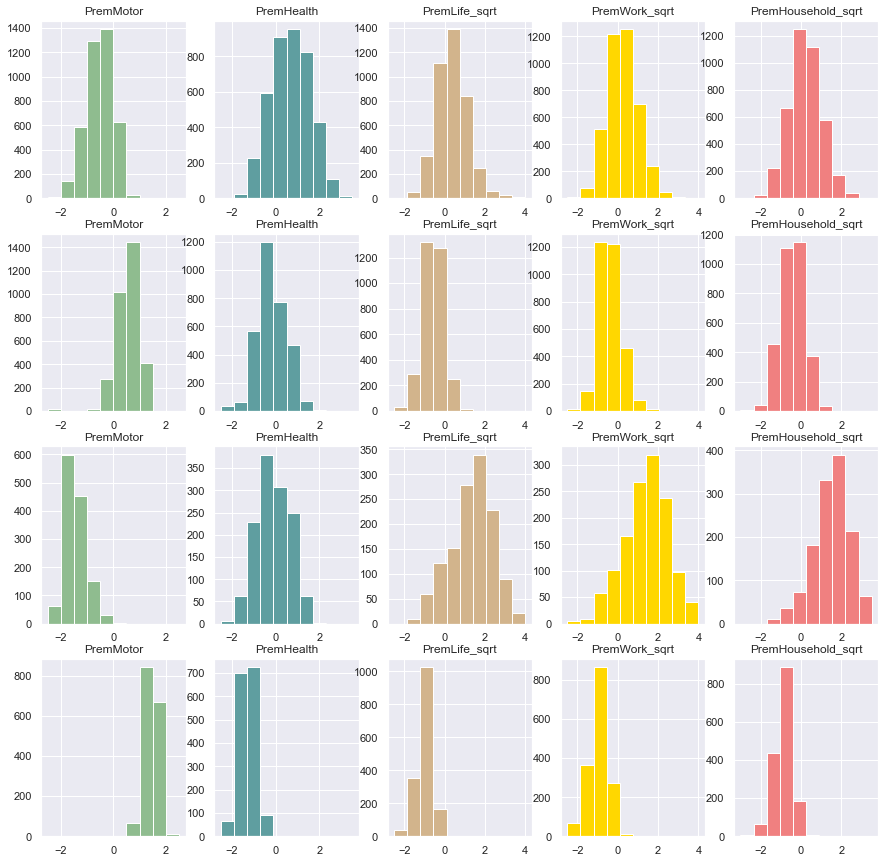

In [759]:
labels = 'hierarc_labels'
df = hierarc_products_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="kmeans">

### 12.2.2 K-Means/K-Medois Algorithm
</a>

#### A) Chose best partitioning method to use based on the R2 (done above)

#### B) With best partitioning method (Kmeans), plot the Inertia values and the silhouette scores

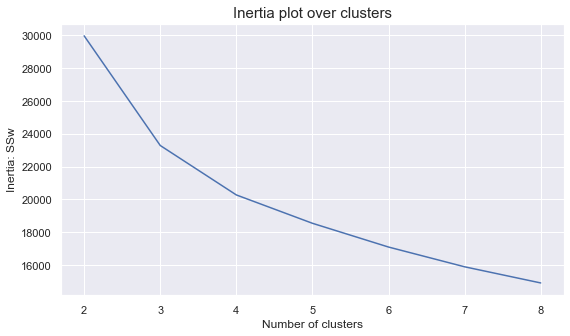

In [760]:
# kmeans = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1) 
init = 'k-means++'  ## random
n_init = 15
random_state=10

# Call function inertia_over_clusters
inertia_over_clusters(method='Kmeans', df=df_products, init=init, n_init=n_init, random_state=random_state)

In [761]:
# Choose 3 or 4 clusters ???

For n_clusters = 2, the average silhouette_score is : 0.3495135917272903
For n_clusters = 3, the average silhouette_score is : 0.302202494870502
For n_clusters = 4, the average silhouette_score is : 0.24578438008184103
For n_clusters = 5, the average silhouette_score is : 0.23640058379173143
For n_clusters = 6, the average silhouette_score is : 0.22600754962920006


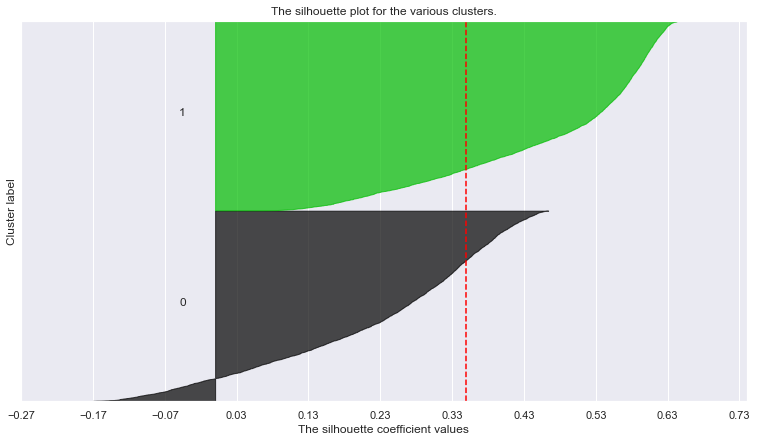

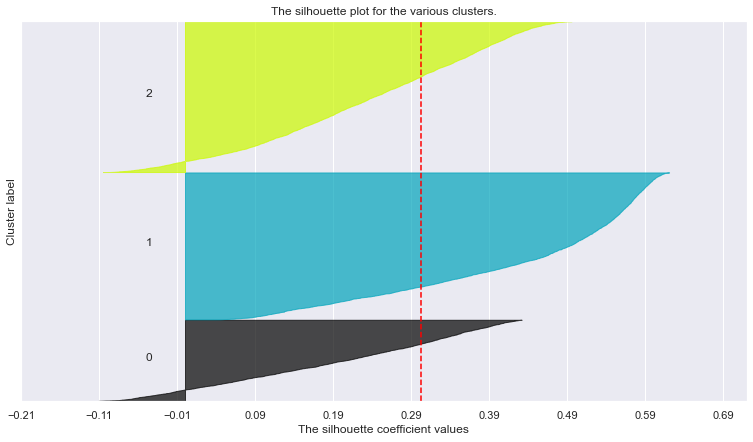

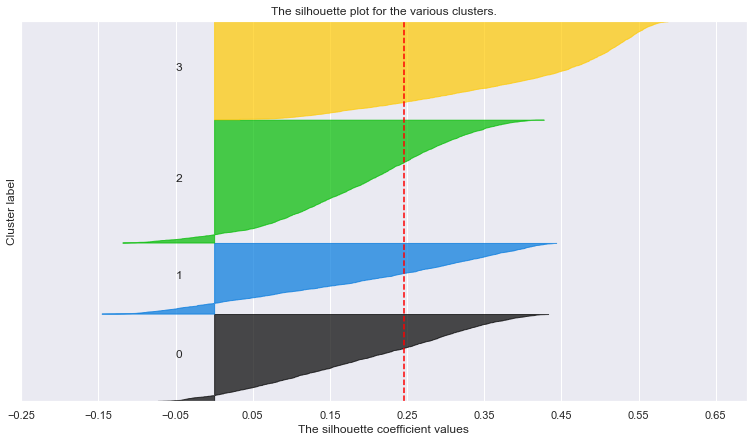

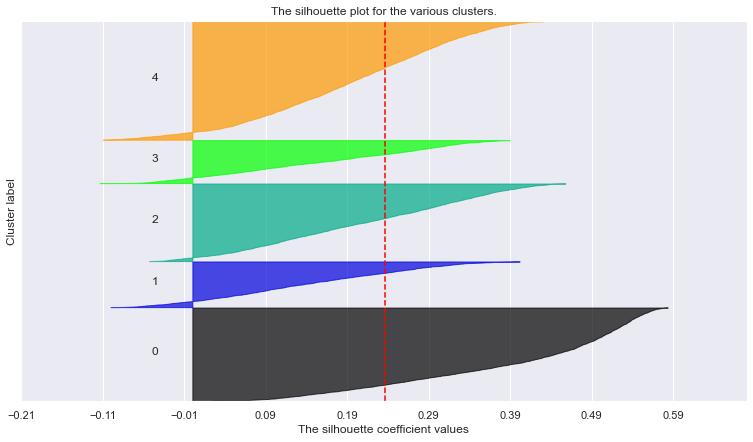

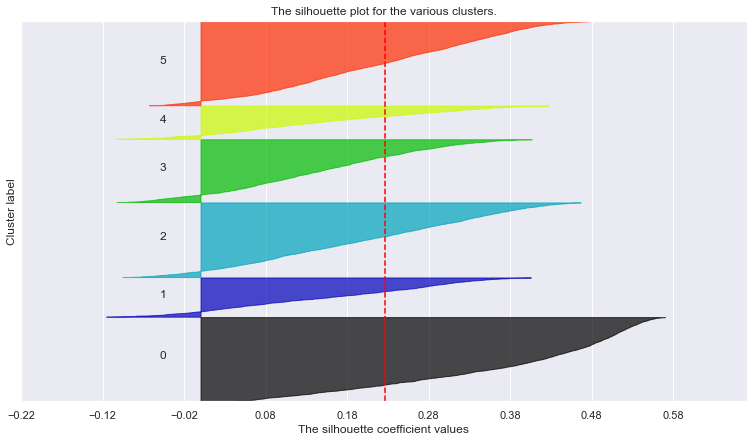

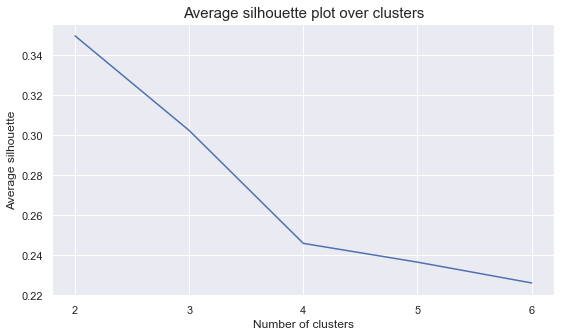

In [762]:
# Call the function created above to plot the silhouttes for each number of clusters
silhouette_plots(method='Kmeans', df=df_products)

In [763]:
# Analyse the graphics:
#    Red dashed line represents the average silhouette score
#    As n_clusters increase there are more negative silhouette values (observations that are closer to other clusters)
#    As n_clusters increase --> more condensed clusters
#    See the maximum silhouette_score --> n_clusters = 2 or 3

In [764]:
# 3 clusters solution
kmeans_products_3 = KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
kmeans_products_3_labels = kmeans_products_3.fit_predict(df_products)

unique, counts = np.unique(kmeans_products_3_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_products_3 = pd.concat((df_products, pd.Series(kmeans_products_3_labels, name='kmeans_labels')), axis=1)
kmeans_products_3.groupby('kmeans_labels').mean()

{0: 2171, 1: 3929, 2: 4034}


,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
kmeans_labels,,,,,
0,-1.174181,-0.039734,1.213017,1.170883,1.197834
1,1.014510,-0.804895,-0.686360,-0.674208,-0.666843
2,-0.356188,0.805328,0.015679,0.026519,0.004841


In [765]:
# 4 clusters solution
kmeans_products_4 = KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
kmeans_products_4_labels = kmeans_products_4.fit_predict(df_products)

unique, counts = np.unique(kmeans_products_4_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_products_4 = pd.concat((df_products, pd.Series(kmeans_products_4_labels, name='kmeans_labels')), axis=1)
kmeans_products_4.groupby('kmeans_labels').mean()

{0: 2327, 1: 1892, 2: 3289, 3: 2626}


,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
kmeans_labels,,,,,
0,-0.780521,1.299978,0.200391,0.187079,0.159038
1,-1.202933,-0.141067,1.270128,1.235121,1.277242
2,0.256661,-0.011540,-0.186757,-0.178209,-0.169264
3,1.236886,-1.035870,-0.858777,-0.832465,-0.849168


In [766]:
# Best solution --> 4 clusters !!

r2_kmeans_products = round(r2(df_products, kmeans_products_4_labels),4)
silhouette_kmeans_products = round(silhouette(df_products, kmeans_products_4_labels),4)

print(f'R2 score : {r2_kmeans_products}')
print(f'Silhouette score : {silhouette_kmeans_products}')

kmeans_products_results = pd.DataFrame((np.array([('K-means',4, 
                                r2_kmeans_products, silhouette_kmeans_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, kmeans_products_results))

R2 score : 0.6
Silhouette score : 0.2458


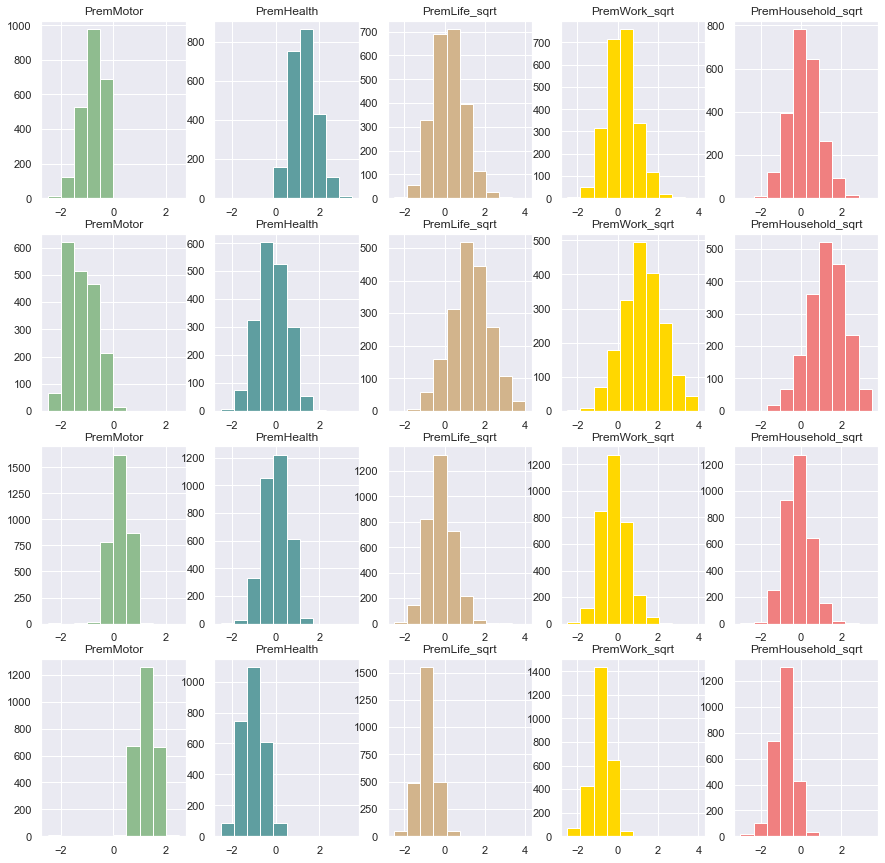

In [767]:
labels = 'kmeans_labels'
df = kmeans_products_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="h_som">

### 12.2.3 Hierarchical on SOM Units
</a>

#### Perform a SOM Algorithm

In [768]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
som_products = sompy.SOMFactory().build(
        df_products.values, 
        mapsize=[25, 25],  # HOW MANY UNITS TO USE ???
        initialization='random',
        neighborhood='gaussian',
        training='batch',
        lattice='hexa',
        normalization=False,
        component_names=df_products.columns
)
som_products.train(n_job=-1, verbose='info', train_rough_len=105, train_finetune_len=100)  ## TUNE THESE PARAMETERS !!!

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 9.000000 , radius_final: 1.500000, trainlen: 105

 epoch: 1 ---> elapsed time:  0.055000, quantization error: 0.951742

 epoch: 2 ---> elapsed time:  0.057000, quantization error: 2.044194

 epoch: 3 ---> elapsed time:  0.056000, quantization error: 1.992640

 epoch: 4 ---> elapsed time:  0.055000, quantization error: 1.979431

 epoch: 5 ---> elapsed time:  0.053000, quantization error: 1.936221

 epoch: 6 ---> elapsed time:  0.054000, quantization error: 1.932305

 epoch: 7 ---> elapsed time:  0.054000, quantization error: 1.929604

 epoch: 8 ---> elapsed time:  0.054000, quantization error: 1.927133

 epoch: 9 ---> elapsed time:  0.053000, quantization error: 1.924807

 epoch: 10 ---> elapsed time:  0.053000, quantization error: 1.922526

 epoch: 11 ---> elapsed time:  0.054000, quantization error: 1.920248

 epoch: 12 ---> elapsed time:  0.056000, quantization error: 1.917959

 epoch: 13 ---> 

 epoch: 9 ---> elapsed time:  0.056000, quantization error: 1.024984

 epoch: 10 ---> elapsed time:  0.055000, quantization error: 1.021838

 epoch: 11 ---> elapsed time:  0.053000, quantization error: 1.018601

 epoch: 12 ---> elapsed time:  0.055000, quantization error: 1.015329

 epoch: 13 ---> elapsed time:  0.055000, quantization error: 1.012159

 epoch: 14 ---> elapsed time:  0.054000, quantization error: 1.008845

 epoch: 15 ---> elapsed time:  0.054000, quantization error: 1.005525

 epoch: 16 ---> elapsed time:  0.054000, quantization error: 1.002135

 epoch: 17 ---> elapsed time:  0.055000, quantization error: 0.998790

 epoch: 18 ---> elapsed time:  0.054000, quantization error: 0.995458

 epoch: 19 ---> elapsed time:  0.055000, quantization error: 0.992015

 epoch: 20 ---> elapsed time:  0.053000, quantization error: 0.988463

 epoch: 21 ---> elapsed time:  0.055000, quantization error: 0.984955

 epoch: 22 ---> elapsed time:  0.053000, quantization error: 0.981421

 epoch:

#### Visualize the Component Planes

C:\Users\tsoom\anaconda3\lib\site-packages\sompy\visualization\plot_tools.py:45: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



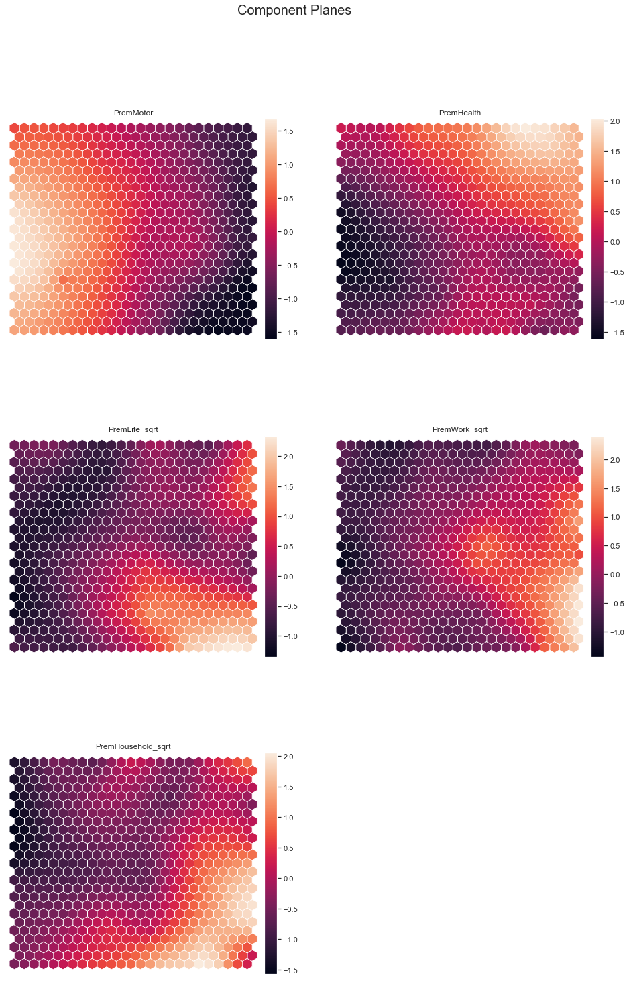

In [769]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)

view2D.show(som_products, col_sz=2, what='codebook')

plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

#### Visualize the U-Matrix

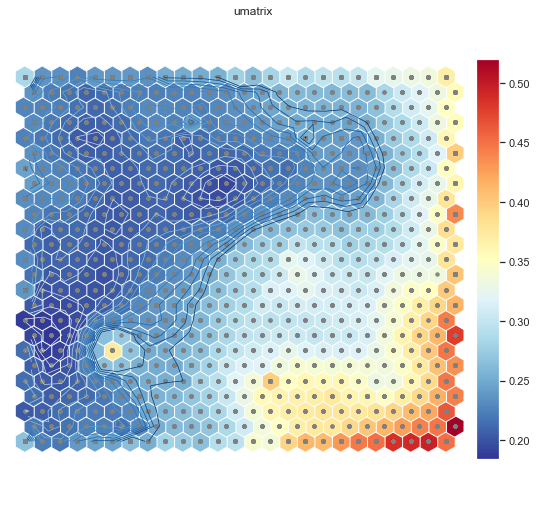

In [770]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    som_products, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

# np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

#### Visualize the Hit Map

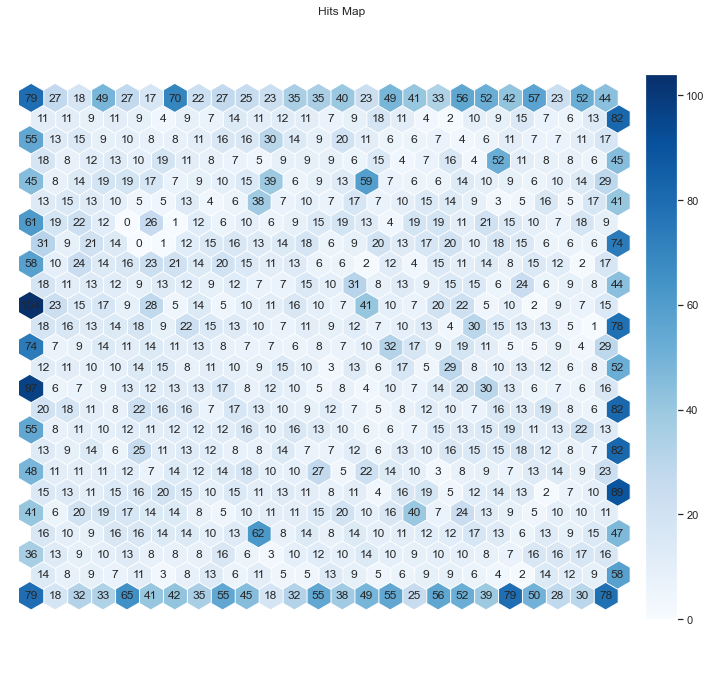

In [771]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(som_products, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

#### Apply Hierarchical Clustering on the SOM Units

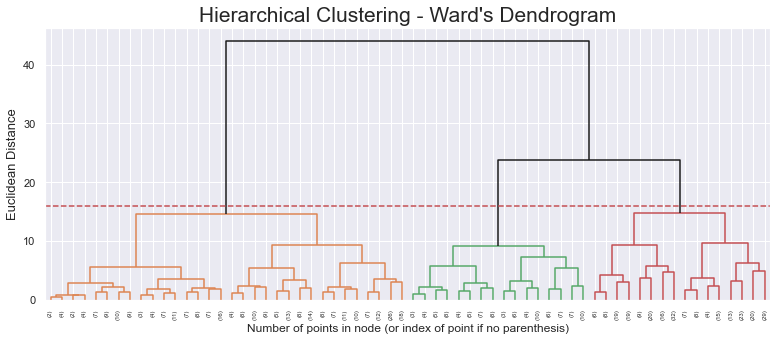

In [772]:
# Define units
units = som_products.codebook.matrix

# Setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage='ward'
distance='euclidean'  # "euclidean", "l1", "l2", "manhattan", "cosine", or "precomputed".

hierarc_som_products = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hierarc_som_products.fit_predict(units)
dendogram(hierarc_som_products,16)

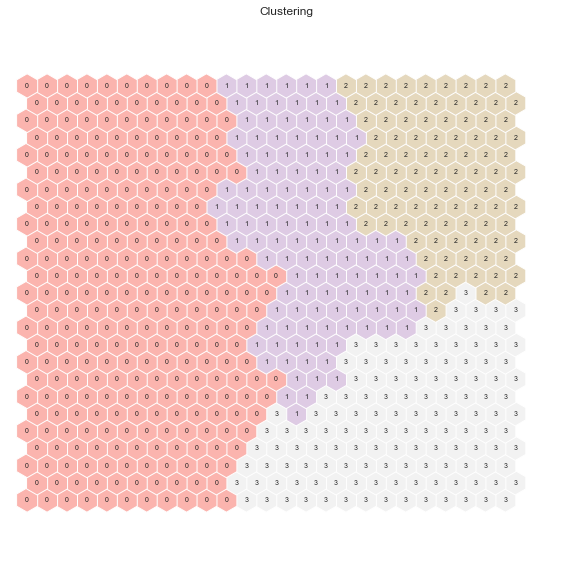

In [773]:
# 4 clusters solution
hierarc_som_products_4 = AgglomerativeClustering(n_clusters=4, linkage=linkage, affinity=distance)
hierarc_som_products_4_labels = hierarc_som_products_4.fit_predict(units)

som_products.cluster_labels = hierarc_som_products_4_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering",text_size=10)
hits.show(som_products, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

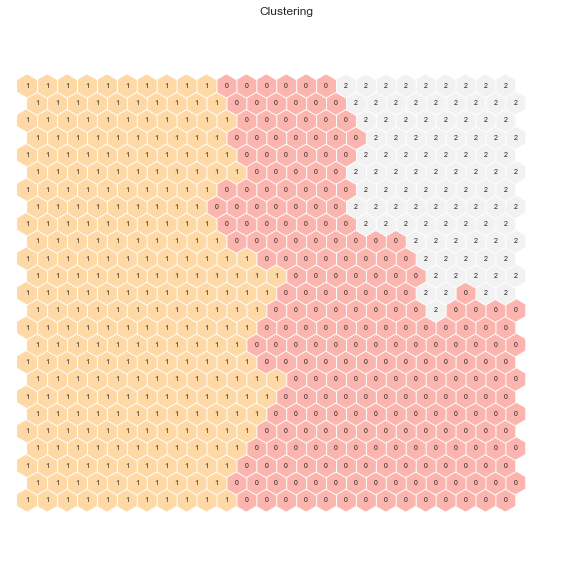

In [774]:
# 3 clusters solution
hierarc_som_products_3 = AgglomerativeClustering(n_clusters=3, linkage=linkage, affinity=distance)
hierarc_som_products_3_labels = hierarc_som_products_3.fit_predict(units)

som_products.cluster_labels = hierarc_som_products_3_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering",text_size=10)
hits.show(som_products, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

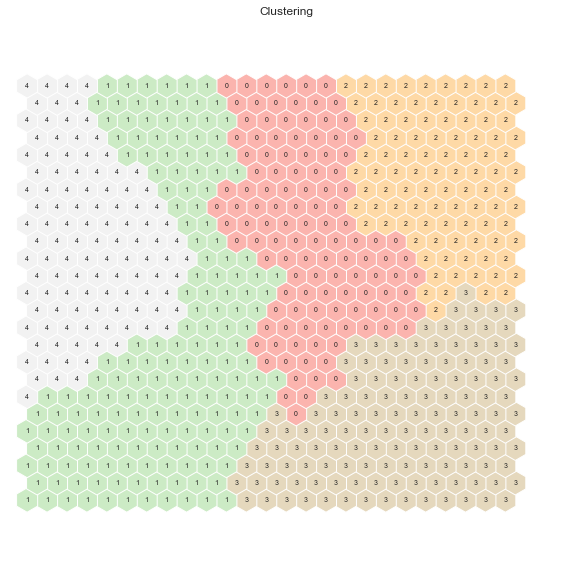

In [775]:
# 5 clusters solution
hierarc_som_products_5 = AgglomerativeClustering(n_clusters=5, linkage=linkage, affinity=distance)
hierarc_som_products_5_labels = hierarc_som_products_5.fit_predict(units)

som_products.cluster_labels = hierarc_som_products_5_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering",text_size=10)
hits.show(som_products, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [776]:
# Best solution --> 4 clusters !! 
df_products_units = pd.DataFrame(units, columns=df_products.columns)
df_products_units['hierarc_som_labels'] = hierarc_som_products_5_labels

# Obtaining SOM's BMUs labels
bmus_map = som_products.find_bmu(df_products)[0]  # get bmus for each observation in df_products

df_products_bmus = pd.DataFrame(
    np.concatenate((df_products, np.expand_dims(bmus_map,1)), axis=1),
    index=df_products.index, columns=np.append(df_products.columns,"BMU"))

# Get cluster labels for each observation
hierarc_som_products_5 = df_products_bmus.merge(df_products_units['hierarc_som_labels'], 'left', left_on="BMU", right_index=True)
hierarc_som_products_5.drop(columns='BMU', inplace=True)
hierarc_som_products_5.groupby('hierarc_som_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
hierarc_som_labels,,,,,
0,-0.172282,0.021172,0.378061,0.244224,0.188956
1,0.547707,-0.156682,-0.507341,-0.449220,-0.417526
2,-1.242915,-0.141928,1.177604,1.258529,1.423460
3,-0.757930,1.319125,0.213740,0.188783,0.057945
4,1.332598,-1.209313,-0.865478,-0.874544,-0.858827


In [777]:
# Best solution --> 4 clusters !!
hierarc_som_products_5_labels = hierarc_som_products_5['hierarc_som_labels']

r2_hierarc_som_products = round(r2(df_products, hierarc_som_products_5_labels),4)
silhouette_hierarc_som_products = round(silhouette(df_products, hierarc_som_products_5_labels),4)

print(f'R2 score : {r2_hierarc_som_products}')
print(f'Silhouette score : {silhouette_hierarc_som_products}')

hierarc_som_products_results = pd.DataFrame((np.array([('Hierarchical with SOM',5, 
                                r2_hierarc_som_products, silhouette_hierarc_som_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, hierarc_som_products_results))

R2 score : 0.6024
Silhouette score : 0.1785


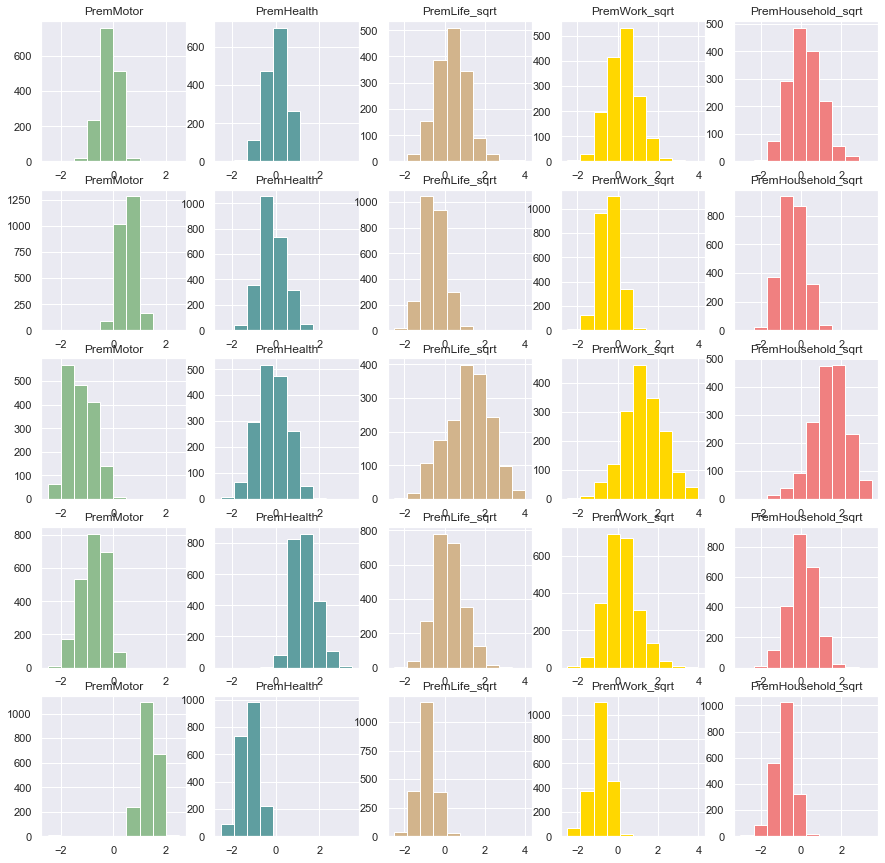

In [778]:
labels = 'hierarc_som_labels'
df = hierarc_som_products_5
features = df.columns

n_clusters = 5
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="k_som">

### 12.2.4 K-Means/K-Medois on SOM Units
</a>

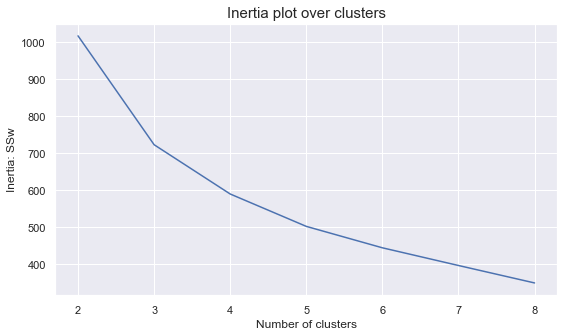

In [779]:
init = 'k-means++'
n_init = 15
random_state=10

# Call function inertia_over_clusters
inertia_over_clusters(method='Kmeans', df=units, init=init, n_init=n_init, random_state=random_state)

For n_clusters = 2, the average silhouette_score is : 0.40510453781936717
For n_clusters = 3, the average silhouette_score is : 0.35914523556956945
For n_clusters = 4, the average silhouette_score is : 0.3278306239891961
For n_clusters = 5, the average silhouette_score is : 0.3071636725589344
For n_clusters = 6, the average silhouette_score is : 0.29073216240911504


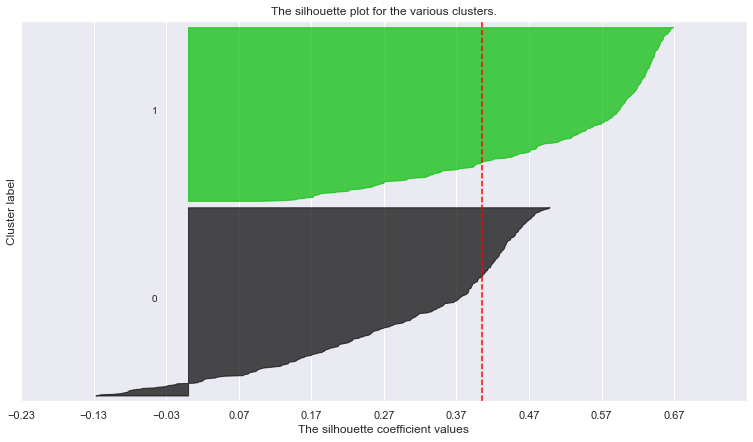

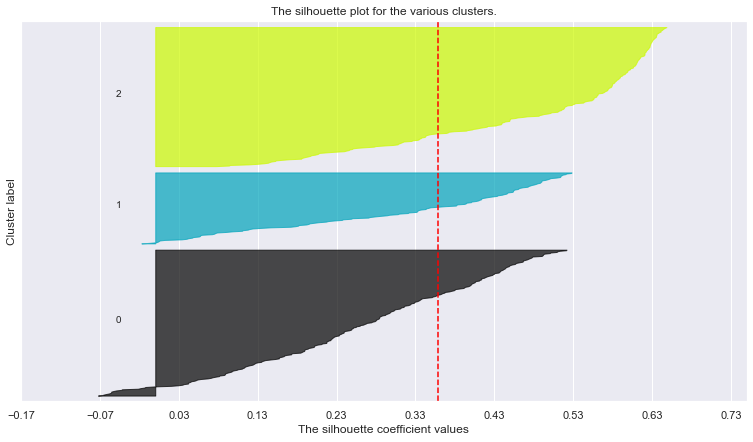

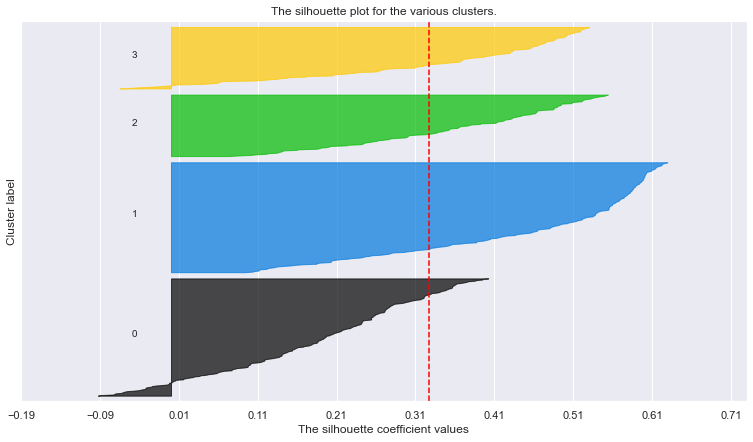

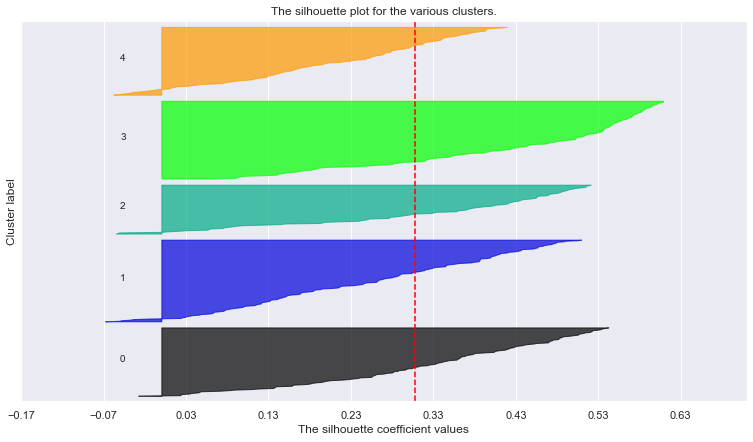

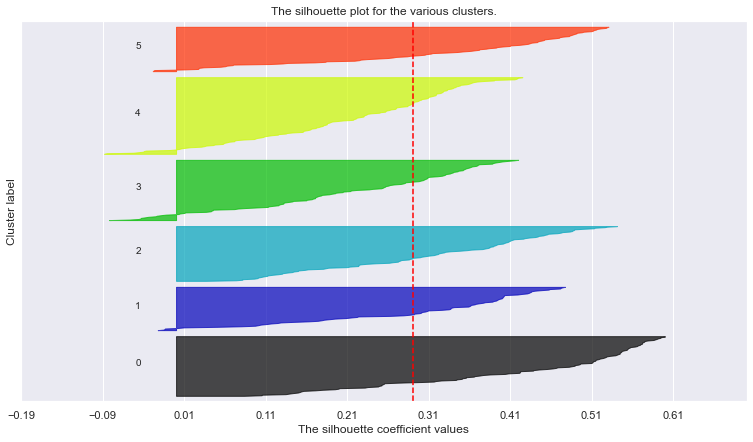

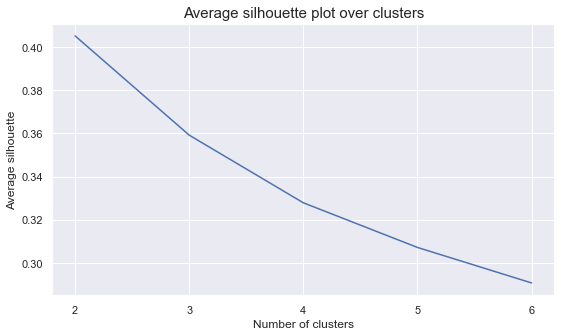

In [780]:
# Call the function created above to plot the silhouttes for each number of clusters
silhouette_plots(method='Kmeans', df=units)

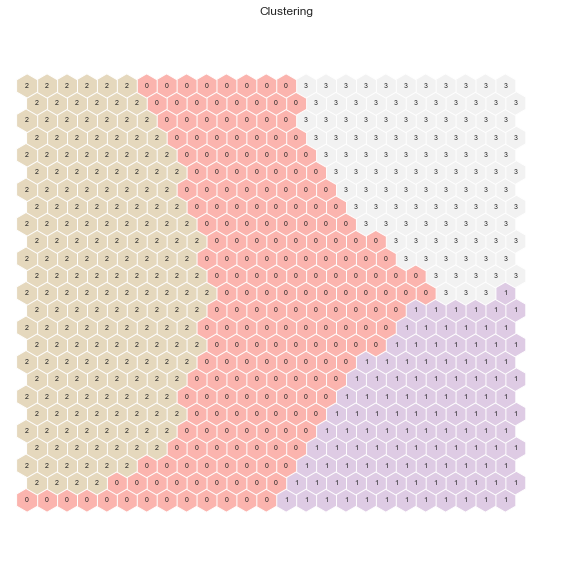

In [781]:
# 4 clusters solution
kmeans_som_products_4 = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=10)
kmeans_som_products_4_labels = kmeans_som_products_4.fit_predict(units)
som_products.cluster_labels = kmeans_som_products_4_labels  # setting the cluster labels of sompy

hits = HitMapView(10, 10,"Clustering", text_size=10)
hits.show(som_products, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

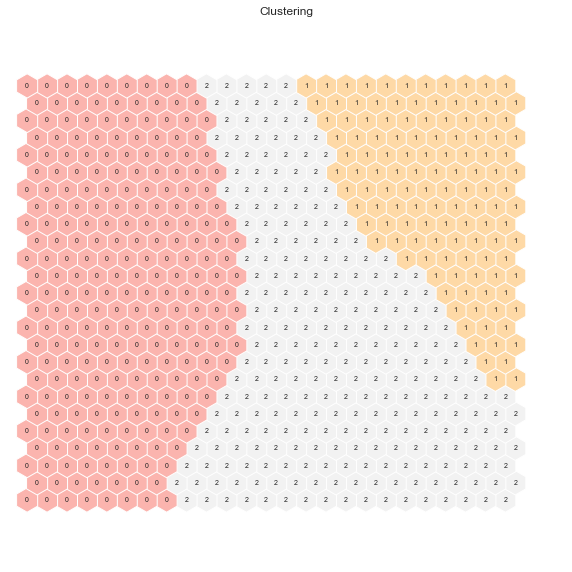

In [782]:
# 3 clusters solution
kmeans_som_products_3 = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=10)
kmeans_som_products_3_labels = kmeans_som_products_3.fit_predict(som_products.codebook.matrix)

som_products.cluster_labels = kmeans_som_products_3_labels  # setting the cluster labels of sompy
hits = HitMapView(10, 10,"Clustering", text_size=10)
hits.show(som_products, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [783]:
# Best solution --> 4 clusters !!
df_products_units = pd.DataFrame(units, columns=df_products.columns)
df_products_units['kmeans_som_labels'] = kmeans_som_products_4_labels

# Obtaining SOM's BMUs labels
bmus_map = som_products.find_bmu(df_products)[0]  # get bmus for each observation in df_products

df_products_bmus = pd.DataFrame(
    np.concatenate((df_products, np.expand_dims(bmus_map,1)), axis=1),
    index=df_products.index, columns=np.append(df_products.columns,"BMU"))

# Get cluster labels for each observation
kmeans_som_products_4 = df_products_bmus.merge(df_products_units['kmeans_som_labels'], 'left', left_on="BMU", right_index=True)
kmeans_som_products_4.drop(columns='BMU', inplace=True)
kmeans_som_products_4.groupby('kmeans_som_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
kmeans_som_labels,,,,,
0,0.123012,0.089935,-0.079444,-0.090430,-0.127815
1,-0.845880,1.371118,0.267323,0.284026,0.099771
2,1.158868,-0.939968,-0.812814,-0.774693,-0.783746
3,-1.160126,-0.162098,1.174719,1.111034,1.399708


In [784]:
# Best solution --> 4 clusters !!
kmeans_som_products_4_labels = kmeans_som_products_4['kmeans_som_labels']

r2_kmeans_som_products = round(r2(df_products, kmeans_som_products_4_labels),4)
silhouette_kmeans_som_products = round(silhouette(df_products, kmeans_som_products_4_labels),4)

print(f'R2 score : {r2_kmeans_som_products}')
print(f'Silhouette score : {silhouette_kmeans_som_products}')

kmeans_som_products_results = pd.DataFrame((np.array([('K-means with SOM',4, 
                                r2_kmeans_som_products, silhouette_kmeans_som_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, kmeans_som_products_results))

R2 score : 0.5826
Silhouette score : 0.2357


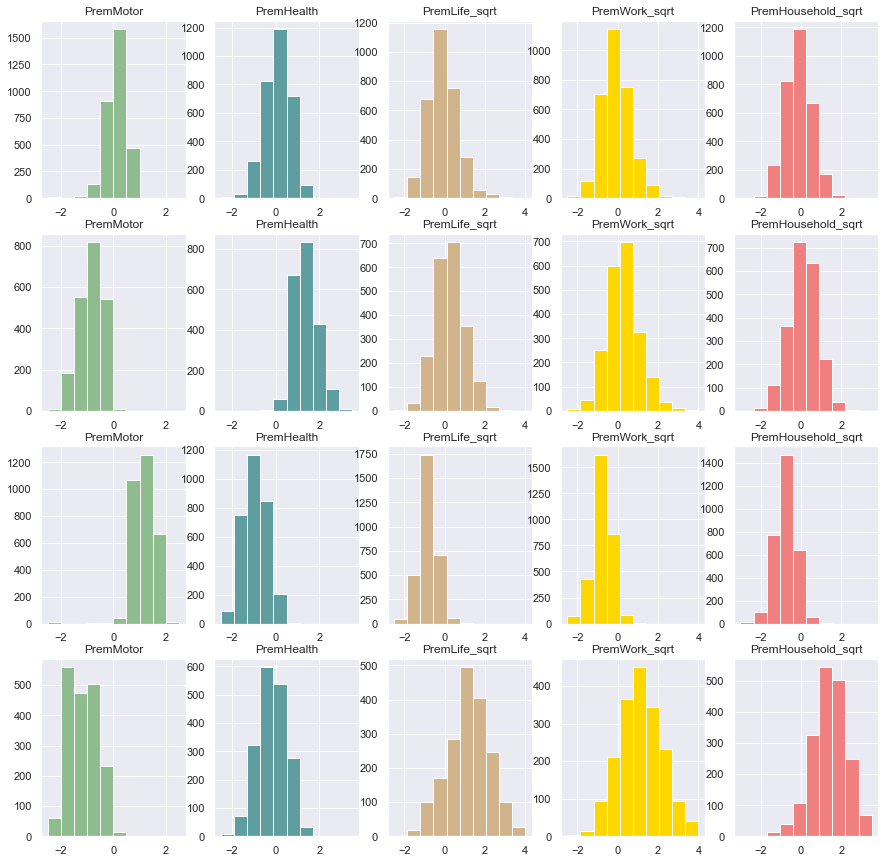

In [785]:
labels = 'kmeans_som_labels'
df = kmeans_som_products_4
features = df.columns

n_clusters = 4
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="dbscan">

### 12.2.5 DBSCAN
</a>

In [786]:
dbscan_products = DBSCAN(eps=0.68, min_samples=10, n_jobs=-1) # TUNE THESE PARAMETERS !!!
dbscan_products_labels = dbscan_products.fit_predict(df_products)

dbscan_products_n_clusters = len(np.unique(dbscan_products_labels))
print(f'Number of estimated clusters : {dbscan_products_n_clusters-1}')

Number of estimated clusters : 3


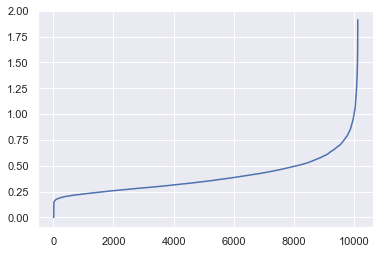

In [787]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=6)
neigh.fit(df_products)
distances, _ = neigh.kneighbors(df_products)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [788]:
# Concatenating the labels to df
dbscan_products_3 = pd.concat([df_products, pd.Series(dbscan_products_labels, index=df_products.index, name="dbscan_labels")], axis=1)
dbscan_products_3.groupby('dbscan_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
dbscan_labels,,,,,
-1,-1.124159,-0.124889,1.012850,0.740444,0.521071
0,0.061430,0.009299,-0.051678,-0.039279,-0.024401
1,-2.171548,-2.249959,-1.210895,-1.134757,-1.101324
2,-1.418257,-0.128084,1.548082,2.873995,-0.732653


In [789]:
# Detecting noise (potential outliers)
dbscan_products_3.loc[dbscan_products_3['dbscan_labels'] == -1]

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt,dbscan_labels
13,-1.848756,-0.536664,3.483088,1.314095,0.824100,-1
43,-1.357652,0.544394,3.025231,0.306778,-1.483054,-1
96,-0.684549,-0.773753,2.571074,0.652547,-0.463676,-1
105,-0.041367,-0.667888,-0.608185,2.120665,-0.303702,-1
106,-1.591483,-0.945230,2.894446,-0.463021,2.620275,-1
...,...,...,...,...,...,...
10092,-2.171548,-0.827423,-0.990522,0.036303,-1.101324,-1
10094,-2.171548,-0.392022,-0.425329,0.781064,-1.101324,-1
10098,-0.529195,-2.249959,-0.366151,-0.566088,-1.101324,-1
10105,0.731252,-2.249959,-1.097766,0.356583,-1.101324,-1


In [790]:
# Computing the R^2 of the cluster solution
df_nonoise = dbscan_products_3.loc[dbscan_products_3['dbscan_labels'] != -1]

sst = get_ss(df_products)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2_dbscan_products = round(ssb / sst, 3)

silhouette_dbscan_products = round(silhouette(df_products, dbscan_products_labels),3)

print(f'R2 score : {r2_dbscan_products}')
print(f'Silhouette score : {silhouette_dbscan_products}')

dbscan_products_results = pd.DataFrame((np.array([('DBSCAN',3, 
                                r2_dbscan_products, silhouette_dbscan_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, dbscan_products_results))

R2 score : 0.127
Silhouette score : 0.193


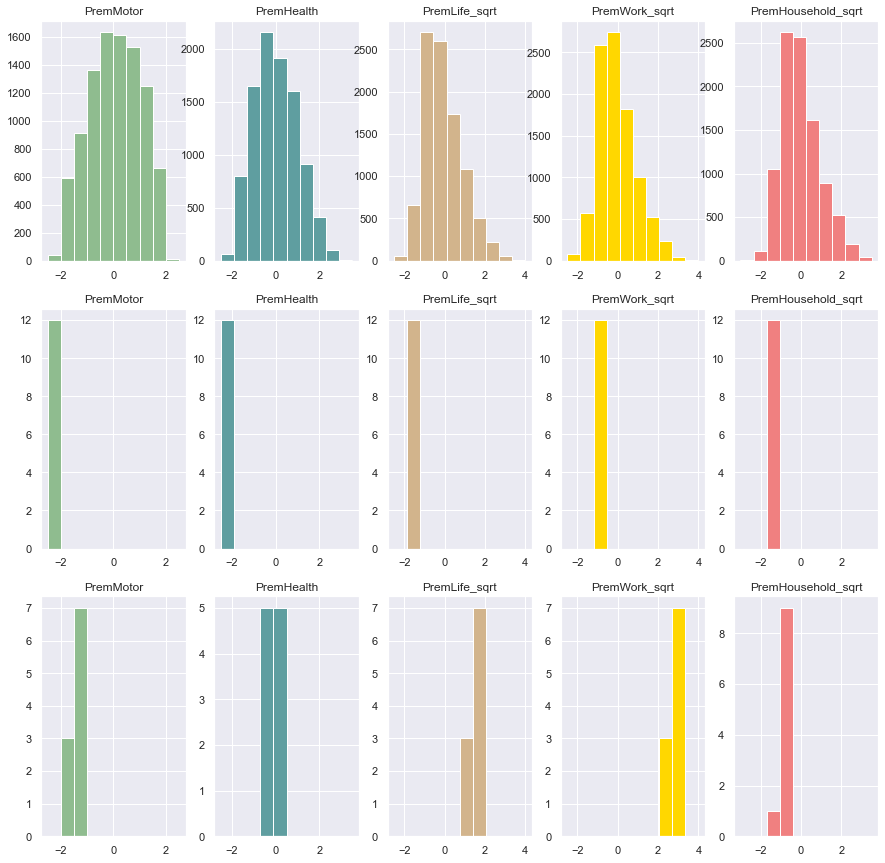

In [791]:
labels = 'dbscan_labels'
df = dbscan_products_3
features = df.columns

n_clusters = 3
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="mean_shift_p">

### 12.2.6 Mean Shift Clustering
</a>

In [792]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# for i in np.arange(0.05,0.1,0.002):
# print(i)

bandwidth = estimate_bandwidth(df_products, quantile=0.3, random_state=1, n_jobs=-1) 
print(f'Bandwith estimated: {round(bandwidth,4)}')  # reduce quantile to have more than one clusters


# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
mean_shift_products = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
mean_shift_products_labels = mean_shift_products.fit_predict(df_products)

mean_shift_products_n_clusters = len(np.unique(mean_shift_products_labels))
print(f"Number of estimated clusters : {mean_shift_products_n_clusters}")

Bandwith estimated: 2.1674
Number of estimated clusters : 2


In [793]:
# Concatenating the labels to df
mean_shift_products_2 = pd.concat([df_products, pd.Series(mean_shift_products_labels, index=df_products.index, name="mean_shift_labels")],axis=1)
mean_shift_products_2.groupby('mean_shift_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
mean_shift_labels,,,,,
0,0.007313,0.006340,0.000961,0.002656,0.001674
1,-1.757093,-1.523498,-0.230996,-0.638240,-0.402305


In [794]:
# Best solution --> 2 clusters !!
r2_mean_shift_products = round(r2(df_products, mean_shift_products_labels),4)
silhouette_mean_shift_products = round(silhouette(df_products, mean_shift_products_labels),4)

print(f'R2 score : {r2_mean_shift_products}')
print(f'Silhouette score : {silhouette_mean_shift_products}')

mean_shift_products_results = pd.DataFrame((np.array([('Mean Shift',2, 
                                r2_mean_shift_products, silhouette_mean_shift_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, mean_shift_products_results))

R2 score : 0.005
Silhouette score : 0.2618


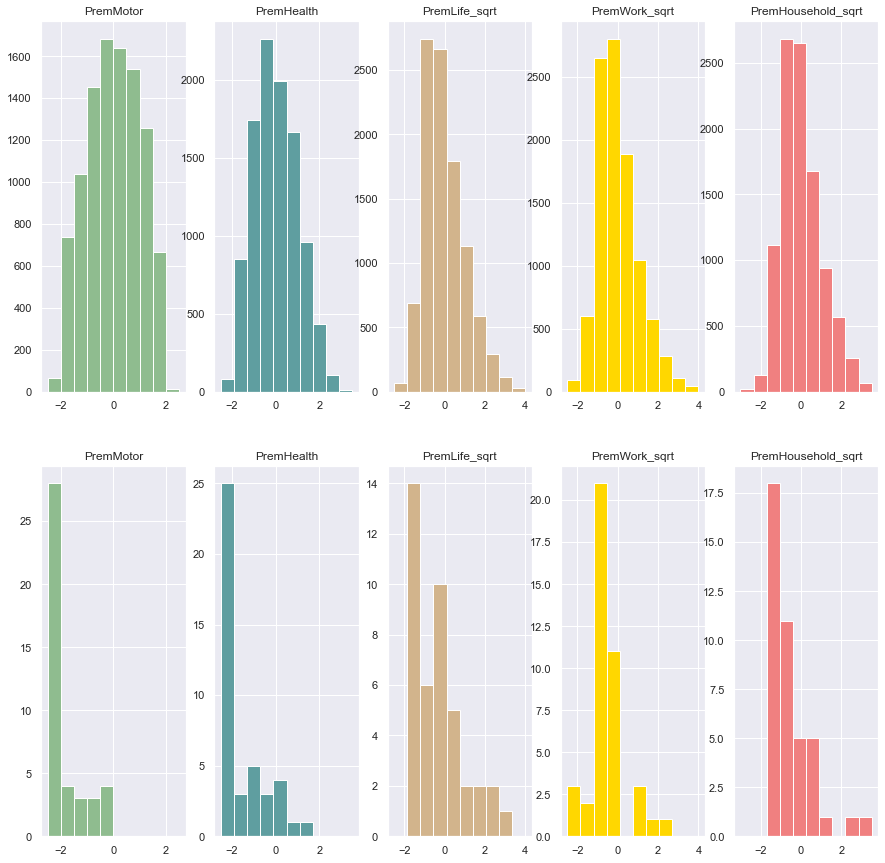

In [795]:
labels = 'mean_shift_labels'
df = mean_shift_products_2
features = df.columns

n_clusters = 2
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="gaussian_p">

### 12.2.7 Gaussian Mixture Model
</a>

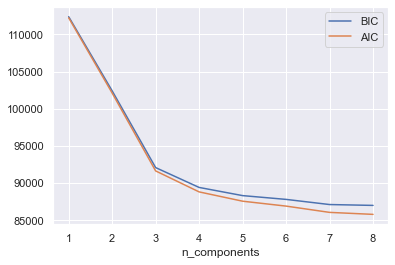

In [796]:
#Defining Covariance type: diag, spherical, full, tied
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 9)
models = [GaussianMixture(n, covariance_type='full', init_params='kmeans', n_init=10, random_state=1).fit(df_products)
          for n in n_components]

bic_values = [m.bic(df_products) for m in models]
aic_values = [m.aic(df_products) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [797]:
# Solution with 3 clusters
gaussian_products_3 = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gaussian_products_3_labels = gaussian_products_3.fit_predict(df_products)

# Concatenating the labels to df
gaussian_products_3 = pd.concat([df_products, pd.Series(gaussian_products_3_labels, index=df_products.index, name="gaussian_labels")],axis=1)
gaussian_products_3.groupby('gaussian_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
gaussian_labels,,,,,
0,-1.138269,-0.663162,0.823365,-0.040101,0.027392
1,-0.871285,0.271826,0.751995,0.788889,0.799114
2,0.571872,-0.149112,-0.488998,-0.486980,-0.495249


In [798]:
# Solution with 4 clusters
gaussian_products_4 = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gaussian_products_4_labels = gaussian_products_4.fit_predict(df_products)

# Concatenating the labels to df
gaussian_products_4 = pd.concat([df_products, pd.Series(gaussian_products_4_labels, index=df_products.index, name="gaussian_labels")],axis=1)
gaussian_products_4.groupby('gaussian_labels').mean()

,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
gaussian_labels,,,,,
0,-1.255910,0.058358,1.109023,1.103178,1.052438
1,-0.983706,-1.195931,-0.058467,-0.498682,-0.247902
2,0.831549,-0.419672,-0.655089,-0.650020,-0.653184
3,-0.442933,0.508598,0.317618,0.324378,0.343894


In [799]:
# Best solution --> 3 clusters !!

r2_gaussian_products = round(r2(df_products, gaussian_products_3_labels),4)
silhouette_gaussian_products = round(silhouette(df_products, gaussian_products_3_labels),4)

print(f'R2 score : {r2_gaussian_products}')
print(f'Silhouette score : {silhouette_gaussian_products}')

gaussian_products_results = pd.DataFrame((np.array([('Gaussian Mixture',3, 
                                r2_gaussian_products, silhouette_gaussian_products)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
final_results_products = pd.concat((final_results_products, gaussian_products_results))

R2 score : 0.3382
Silhouette score : 0.2928


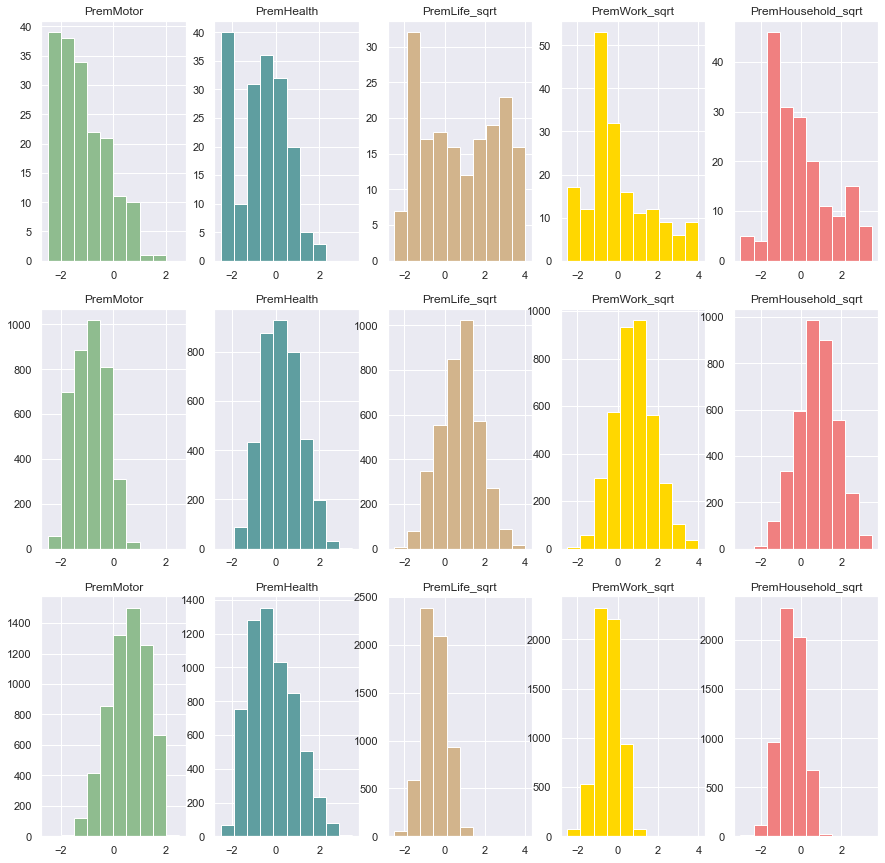

In [800]:
labels = 'gaussian_labels'
df = gaussian_products_3
features = df.columns

n_clusters = 3
n_features = len(features)-1

range_axis1 = [-2.5, 2.5]
range_axis2 = [-2.5, 3.5]
range_axis3 = [-2.5, 4]
range_axis4 = [-2.5, 4]
range_axis5 = [-3, 3.5]

profiling_for_products(labels, df, features, n_clusters, n_features, 
                       range_axis1, range_axis2, range_axis3, range_axis4, range_axis5)

<a class="anchor" id="best_cluster_p">

### 12.2.8 Choose Best Solution
</a>

In [801]:
final_results_products #products_df

,Method,Clusters,R*2,Silhouette
0,Hierarchical,4,0.5484,0.1764
0,K-means,4,0.6,0.2458
0,Hierarchical with SOM,5,0.6024,0.1785
0,K-means with SOM,4,0.5826,0.2357
0,DBSCAN,3,0.127,0.193
0,Mean Shift,2,0.005,0.2618
0,Gaussian Mixture,3,0.3382,0.2928


In [196]:
############################################################################################################################
############################################################################################################################
############################################################################################################################

<a class="anchor" id="merging">

## 13. Merging the Perspectives

</a>

### Choose best segmentations

In [802]:
# Segmentation for Value --> value_df4
# Segmentation for Products --> products_df

df_final = pd.concat([value_df4, products_df], axis=1)
final_features = df_final.columns
df_final.head(3)

,Client_Recency,SalarySpent_Ratio,ClaimsRate,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt
0,0.154380,-0.244920,-0.915180,0.564614,-0.286157,0.373373,-0.452021,-0.485585
1,0.760123,2.829453,1.384753,-1.607645,-0.684257,2.679080,1.510900,1.105474
2,-0.754236,-0.187182,-1.261745,-0.670790,-0.578392,1.152348,1.392221,0.311686


### Choose best algotihm for each segmentation

In [803]:
# Best Labels for Value --> kmeans_som_value_4_labels
# Best Labels for Products --> kmeans_products_3_labels

df_final['value_labels'] = kmeans_value_4_labels
df_final['products_labels'] = kmeans_products_4_labels
df_final.head(3)

,Client_Recency,SalarySpent_Ratio,ClaimsRate,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt,value_labels,products_labels
0,0.154380,-0.244920,-0.915180,0.564614,-0.286157,0.373373,-0.452021,-0.485585,2,2
1,0.760123,2.829453,1.384753,-1.607645,-0.684257,2.679080,1.510900,1.105474,3,1
2,-0.754236,-0.187182,-1.261745,-0.670790,-0.578392,1.152348,1.392221,0.311686,2,1


In [804]:
# Count label frequencies (contigency table)
df_final.groupby(['value_labels', 'products_labels'])\
        .size()\
        .to_frame()\
        .reset_index()\
        .pivot('value_labels', 'products_labels', 0)

products_labels,0,1,2,3
value_labels,,,,
0,836,418,1014,672
1,894,490,1030,711
2,506,478,1216,1242
3,91,506,29,1


### Merging the perspectives with hierarchical clustering

In [805]:
# Centroids of the concatenated cluster labels
df_centroids = df_final.groupby(['value_labels', 'products_labels']).mean()

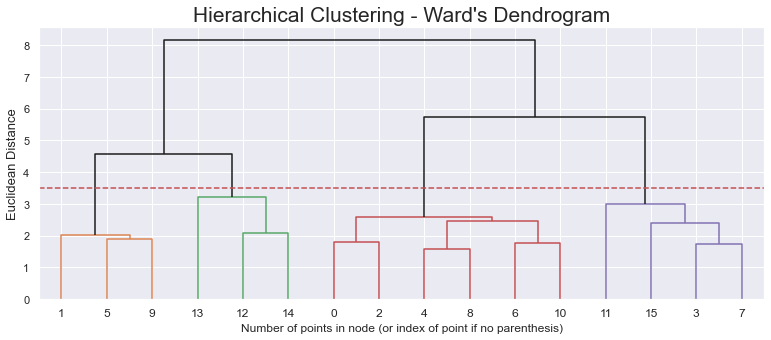

In [806]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
final_hierarc = AgglomerativeClustering(linkage='ward', affinity='euclidean', distance_threshold=0, n_clusters=None)

final_hierarc.fit_predict(df_centroids)
dendogram(final_hierarc,3.5)

### Number  of clusters chosen : 4

In [807]:
# Re-running the Hierarchical clustering based on the correct number of clusters
final_hierarc = AgglomerativeClustering(n_clusters=4, linkage='ward', affinity='euclidean')

final_labels = final_hierarc.fit_predict(df_centroids)
df_centroids['final_labels'] = final_labels
# df_centroids  # centroid's cluster labels

In [808]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['final_labels'].to_dict()

df_merged = df_final.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_merged['merged_labels'] = df_merged.apply(
    lambda row: cluster_mapper[
        (row['value_labels'], row['products_labels'])
    ], axis=1
)

# Merged cluster centroids
df_merged.groupby('merged_labels').mean()

,Client_Recency,SalarySpent_Ratio,ClaimsRate,PremMotor,PremHealth,PremLife_sqrt,PremWork_sqrt,PremHousehold_sqrt,value_labels,products_labels
merged_labels,,,,,,,,,,
0,0.018668,3.022857,0.026374,-1.447863,0.012427,1.209205,1.228897,1.659386,3.000000,0.900958
1,0.019725,-0.399142,-0.177214,1.236886,-1.035870,-0.858777,-0.832465,-0.849168,1.217822,3.000000
2,0.002531,-0.213970,0.078295,-0.158569,0.521374,-0.032848,-0.032850,-0.048440,0.976710,1.186317
3,-0.055839,0.239408,0.013381,-1.060756,-0.110430,1.211196,1.152456,1.051490,1.043290,1.000000


In [809]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_merged.groupby('merged_labels')\
    .size()\
    .to_frame()
display(df_counts)

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['value_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['products_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('value_labels', 'products_labels', 0)

,0
merged_labels,
0,626
1,2626
2,5496
3,1386


products_labels,1,2,3
value_labels,,,
2,1386.0,5496.0,NaN
3,NaN,626.0,2626.0


<a class="anchor" id="analysis">

## 14. Analysis of the Merged Clusters

</a>

### Function to do the cluster profile

In [810]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

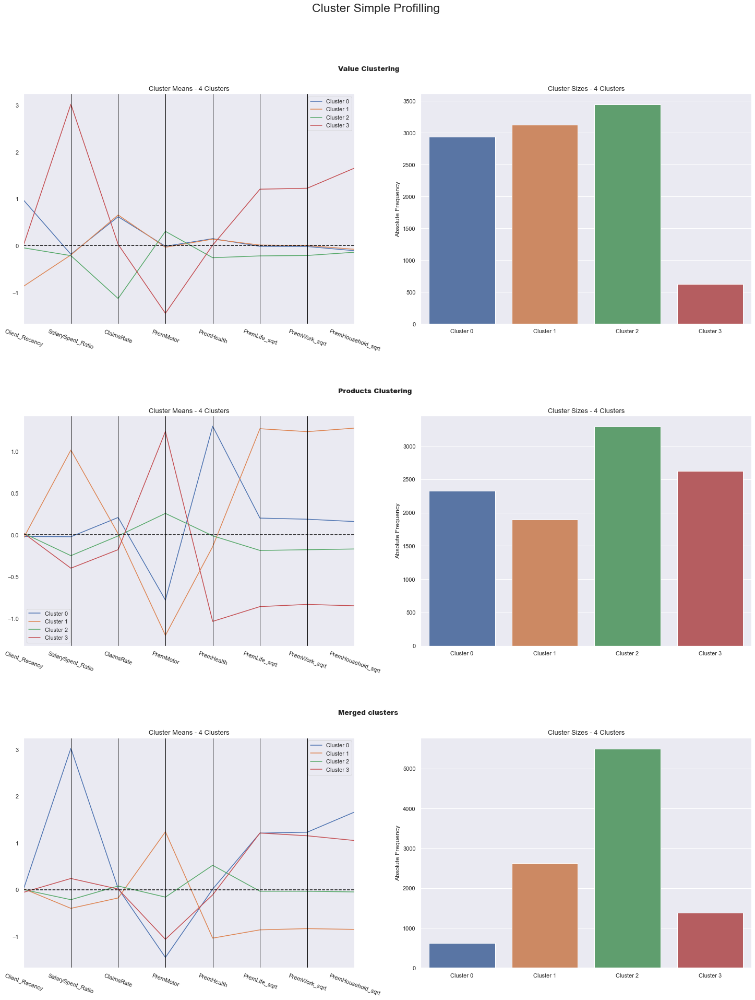

In [811]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_merged, 
    label_columns = ['value_labels', 'products_labels', 'merged_labels'], 
    figsize = (25, 30), 
    compar_titles = ["Value Clustering", "Products Clustering", "Merged clusters"]
)

### Profiling of the merged clusters with the non metric variables

In [812]:
insur.EducDeg = insur.EducDeg.astype('int')
insur.GeoLivArea = insur.GeoLivArea.astype('float') 
insur.Children = insur.Children.astype('float')

df_non_metric = insur[['GeoLivArea', 'EducDeg', 'Children']]

df_merged_non_metric = pd.concat([df_non_metric, df_merged[['merged_labels']]], axis=1)
print(df_merged_non_metric.shape)
df_merged_non_metric.head(3)

(10134, 4)


,GeoLivArea,EducDeg,Children,merged_labels
0,1.0,2,1.0,2
1,4.0,2,1.0,0
2,3.0,1,0.0,3


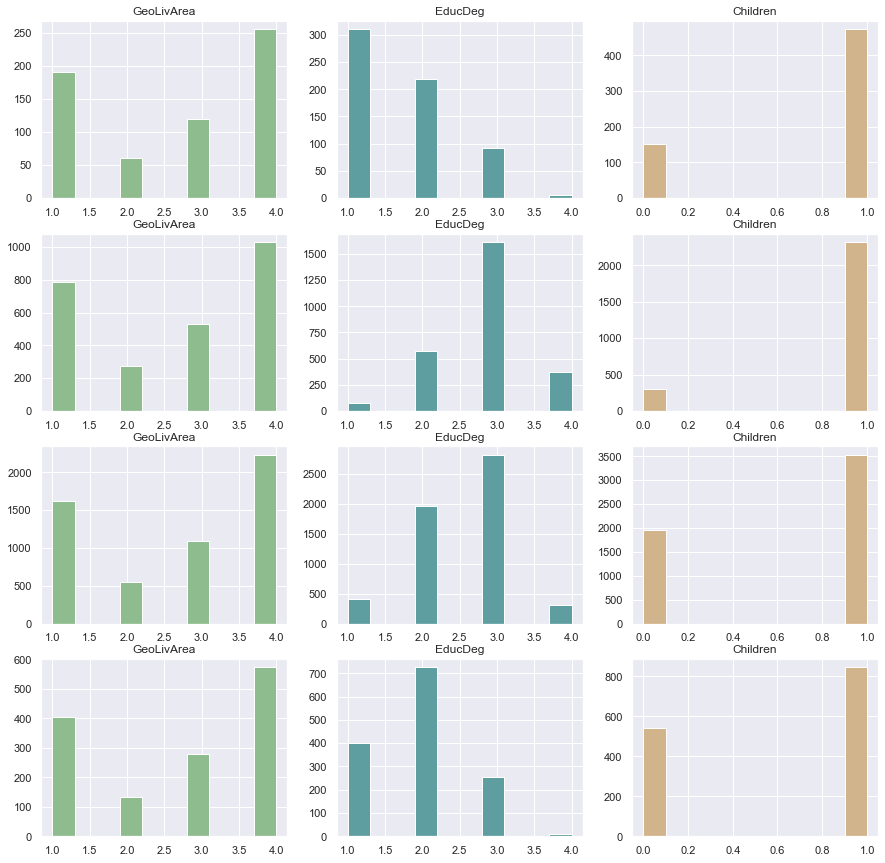

In [813]:
labels = 'merged_labels'
df = df_merged_non_metric
features = df.columns

n_clusters = 4
n_features = len(features)-1

# Show histograms for each cluster 
fig, axs = plt.subplots(n_clusters, n_features, figsize=(15,15))

################################# cluster 1 #################################
axs[0, 0].hist(df[df.columns[0]].loc[df[labels]==0], color='darkseagreen', range=[1,4])
axs[0, 0].set_title(df.columns[0])
axs[0, 1].hist(df[df.columns[1]].loc[df[labels]==0], color='cadetblue', range=[1,4])
axs[0, 1].set_title(df.columns[1])
plt.sca(axs[0, 1])
axs[0, 2].hist(df[df.columns[2]].loc[df[labels]==0], color='tan', range=[0,1])
axs[0, 2].set_title(df.columns[2])
plt.sca(axs[0, 2])

################################# cluster 2 #################################
axs[1, 0].hist(df[df.columns[0]].loc[df[labels]==1], color='darkseagreen', range=[1,4])
axs[1, 0].set_title(df.columns[0])
axs[1, 1].hist(df[df.columns[1]].loc[df[labels]==1], color='cadetblue', range=[1,4])
axs[1, 1].set_title(df.columns[1])
plt.sca(axs[1, 1])
axs[1, 2].hist(df[df.columns[2]].loc[df[labels]==1], color='tan', range=[0,1])
axs[1, 2].set_title(df.columns[2])
plt.sca(axs[1, 2])

################################# cluster 3 #################################
axs[2, 0].hist(df[df.columns[0]].loc[df[labels]==2], color='darkseagreen', range=[1,4])
axs[2, 0].set_title(df.columns[0])
axs[2, 1].hist(df[df.columns[1]].loc[df[labels]==2], color='cadetblue', range=[1,4])
axs[2, 1].set_title(df.columns[1])
plt.sca(axs[2, 1])
axs[2, 2].hist(df[df.columns[2]].loc[df[labels]==2], color='tan', range=[0,1])
axs[2, 2].set_title(df.columns[2])
plt.sca(axs[2, 2])

################################# cluster 4 #################################
axs[3, 0].hist(df[df.columns[0]].loc[df[labels]==3], color='darkseagreen', range=[1,4])
axs[3, 0].set_title(df.columns[0])
axs[3, 1].hist(df[df.columns[1]].loc[df[labels]==3], color='cadetblue', range=[1,4])
axs[3, 1].set_title(df.columns[1])
plt.sca(axs[3, 1])
axs[3, 2].hist(df[df.columns[2]].loc[df[labels]==3], color='tan', range=[0,1])
axs[3, 2].set_title(df.columns[2])
plt.sca(axs[3, 2])

plt.show()

### 2D Visualization of the merged clusters with t-SNE

In [814]:
two_dim = TSNE(random_state=42).fit_transform(df_merged[final_features])

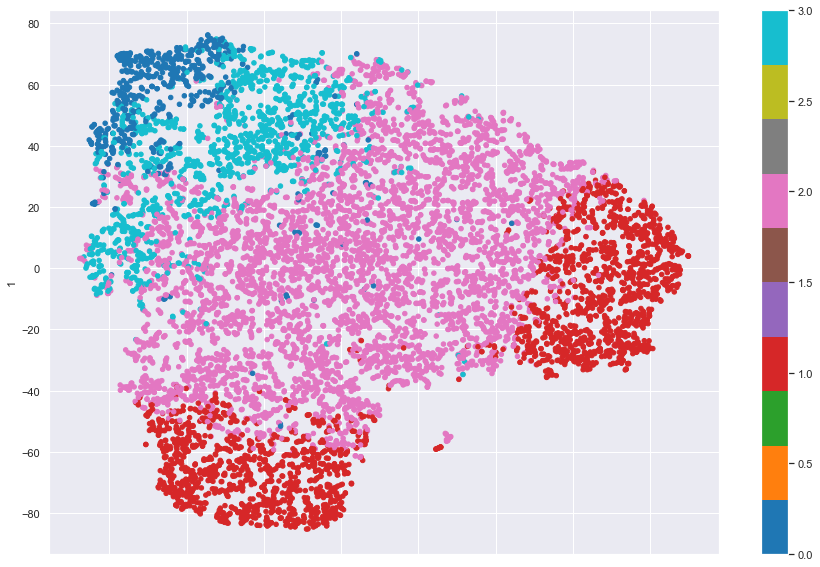

In [815]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_merged['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()
# tab10 || Set1 || Paired

### Evaluate Feature Importance

In [816]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

# We are essentially decomposing the R² into the R² for each variable
r2_variables(df_merged[list(final_features) + ['merged_labels']], 'merged_labels').drop('merged_labels').sort_values(ascending=False)

PremMotor             0.693457
SalarySpent_Ratio     0.638406
PremHousehold_sqrt    0.509434
PremLife_sqrt         0.482650
PremWork_sqrt         0.455096
PremHealth            0.427151
ClaimsRate            0.011530
Client_Recency        0.000552
dtype: float64

In [817]:
# Preparing the data
X = df_merged.drop(columns=['value_labels','products_labels','merged_labels'])
y = df_merged['merged_labels']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=10
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=10, max_depth=3)
dt.fit(X_train, y_train)
score = dt.score(X_test, y_test)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly.".format(score*100))

# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns).sort_values(ascending=False)

It is estimated that in average, we are able to predict 86.38% of the customers correctly.


PremMotor             0.634794
SalarySpent_Ratio     0.211499
PremLife_sqrt         0.140210
PremHousehold_sqrt    0.013497
Client_Recency        0.000000
ClaimsRate            0.000000
PremHealth            0.000000
PremWork_sqrt         0.000000
dtype: float64

In [820]:
# The end :) 